In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import benfords
from scipy.stats import chisquare, ks_2samp, pearsonr
from itertools import product
import networkx as nx
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KernelDensity

### CDF Calculator Based on Observations

In [38]:
class Distribution:
    def __init__(self, observations, kernel = 'gaussian'):
        self.observations = observations
        self.cumulative_probs, self.sorted_data, self.sorted_unique_values = self.preprocess()
        self.kde = KernelDensity(bandwidth=0.75, kernel = kernel)
        self.kde.fit(self.sorted_data.reshape(-1, 1))
        
    def preprocess(self):
        sorted_data = np.sort(self.observations)
        unique_values, counts = np.unique(sorted_data, return_counts=True)
        return np.cumsum(counts) / len(sorted_data), sorted_data, unique_values

    def get_min(self):
        return self.sorted_data[0]

    def get_max(self):
        return self.sorted_data[-1]

    def cdf(self, x):
        if x < self.sorted_data[0]:
            return 0
        elif x > self.sorted_data[-1]:
            return 1
        else:
            return self.cumulative_probs[np.searchsorted(self.sorted_unique_values, x, side='right') - 1]
  
    def pdf(self, x):
        if isinstance(x, np.ndarray):
            return np.exp(self.kde.score_samples(x.reshape(-1, 1)))
        else:
            return np.exp(self.kde.score_samples(np.array([x]).reshape(-1, 1)))

### - Lawrence Metric

In [39]:
class LawrenceBenfordCheck:
    def __init__(self, cdf, domain):
        self.cdf = cdf
        self.domain = domain

    # Interpretation:
    # - High R-squared: Suggests good fit to the linear model, indicating possible linearity
    # - Low R-squared: Suggests non-linearity
    def r_square(self, x, y):
        model = LinearRegression()
        model.fit(x.reshape(-1, 1), y)
        r_squared = model.score(x.reshape(-1, 1), y)
        print(f"        R-squared: {r_squared:.4f}")

    # Interpretation:
    # - Close to 1: Strong positive linear relationship
    # - Close to 0: Weak or non-linear relationship
    # - Close to -1: Strong negative linear relationship
    # - A low p-value indicates rejecting the null hypothesis of non-linearity.
    def pearson(self, x, y):
        r, p = pearsonr(x, y)
        print(f'        Pearson Coefficient: {r}, P-Value: {p}')

    def check_linearity(self, x, y):
        print(f'    Linearity Check:')
        self.pearson(x, y)
        self.r_square(x, y)

    def compare_cdf_with_benford(self, precision=1000):
        z_vals = np.linspace(0, 1, precision)
        cdf = np.array([
            self.calculate_cumulative_prob(z) for z in z_vals
        ])
        self.check_linearity(z_vals, cdf)
        plt.plot(z_vals, cdf, label='Lawrence function')
        plt.xlabel('z')
        plt.ylabel('Pr(Z ≤ z)')
        plt.legend()
        plt.show()

    def calculate_cumulative_prob(self, z):
        d_vals = np.arange(-self.domain, self.domain + 1, 1, dtype=float)
        return sum([
            self.calculate_mixture_prob(d, z) for d in d_vals
        ])

    def calculate_mixture_prob(self, d, z):
        return self.cdf(10 ** (d + z)) - self.cdf(10 ** d)

In [40]:
class LindyAnalyzer:
    def __init__(self, dist):
        self.dist = dist
        
    def hazard(self, x):
        return self.dist.pdf(x) / (1 - self.dist.cdf(x))
    

    def show_hazard_rate(self, begin=0, end=100, q=100, eliazar_analysis = True):
        x = np.linspace(begin, end, q)
        for i in range(len(x)):
            c = self.dist.cdf(x[i])
            if c >= 1:
                end = x[i-1]
                break
        if begin == 0:
            begin = 0.001
        
        x = np.linspace(begin, end, q)
        h = np.array([self.hazard(i) for i in x])
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        axes[0].plot(x, h)
        axes[0].set_xlabel('Time')
        axes[0].set_ylabel('Hazard Rate')
        
        if eliazar_analysis:
            l = x.reshape(-1, 1) * h.reshape((-1, 1))
            model = LinearRegression()
            model.fit(x.reshape(-1, 1), l)
            print('   Check t*h(t):')
            print(f'        Slope (Regression): {model.coef_[0]}')
            print(f'        Estimated value for p (denoted in eliazar): {np.sum(l) / len(l)}')
            # plot first moment:
            axes[1].plot(x, l)
            axes[1].set_xlabel('Time')
            axes[1].set_ylabel('Time * Hazard')
            
        fig.suptitle('h(t) , t*h(t)')
        plt.show()
        plt.close()



In [41]:
class BenfordAnalyzer:
    def __init__(self):
        self.data = None
        self.data_dist = None
        self.first_digits_freq = None
        self.first_digits = None
        self.first_digit_dist = None
        self.LAWRENCE_DOMAIN = 20

    def set_lawrence_domain(self, domain):
        self.LAWRENCE_DOMAIN = domain

    def set_data(self, data):
        self.data = data
        self.data_dist = None
        self.first_digits = None
        self.first_digits_freq = None
        self.first_digit_dist = None

    def extract_first_digits(self, data):
        return np.array([int(format(abs(float(x)), ".6e")[0]) for x in data if x != 0 and x != np.inf])

    def count_first_digits(self, data):
        counts = Counter(self.extract_first_digits(data))
        return [counts[d] for d in range(1, 10)]

    def get_first_digits_freq(self):
        if self.first_digits_freq is None:
            self.first_digits_freq = self.count_first_digits(self.data)
        return self.first_digits_freq

    def get_first_digits(self):
        if self.first_digits is None:
            self.first_digits = self.extract_first_digits(self.data)
        return self.extract_first_digits(self.data)

    def get_dist_of_data(self):
        if self.data_dist is None:
            self.data_dist = Distribution(self.data)
        return self.data_dist

    def set_dist_of_data(self, dist):
        self.data_dist = dist
        
    def get_dist_of_first_digit(self):
        if self.data is None:
            raise Exception('data is not provided.')
        return Distribution(self.get_first_digits())

    def get_hazard_of_first_digit_dist(self):
        dist = self.get_dist_of_first_digit()
        x = np.arange(1, 10)
        f = np.array([dist.pdf(i) for i in x])
        s = np.array([1 - dist.cdf(i) for i in x])
        return f / s

    def get_combined_benford(self, digit_lists):
        all_combs = list(product(*digit_lists))
        return sum([
            self.get_benford(comb) for comb in all_combs
        ])

    def get_benford(self, digits):
        if len(digits) == 0:
            raise ValueError('No digits provided')
        sigma = sum([digits[i] * 10 ** (len(digits) - i - 1) for i in range(len(digits))])
        return np.log10(1 + 1 / sigma)

    def get_benford_rvs(self, size):
        uniform_data = np.random.uniform(low=0.0, high=1.0, size=size)
        return 10 ** uniform_data

    def get_benford_probes(self):
        return np.array([self.get_benford([i]) for i in range(1, 10)])

    def get_benford_freq(self, count):
        probes = self.get_benford_probes()
        return np.array([count * probes[i] for i in range(9)])

    def show_benford_diff(self):
        first_digits_count = self.get_first_digits_freq()
        benford_freq = self.get_benford_freq(len(self.data))
        digits = list(range(1, 10))
        benford_diff = [abs(first_digits_count[d - 1] - benford_freq[d - 1]) for d in digits]
        plt.plot(digits, first_digits_count, color='violet', label='Actual', alpha=0.5)
        plt.plot(digits, benford_freq, color='red', label = 'Benford', alpha=0.5)
        plt.bar(digits, benford_diff, color='green', label = 'Difference', alpha=0.5)
        plt.xlabel('First Digit')
        plt.ylabel('Frequency')
        plt.title('Difference with Benford')
        plt.legend()
        plt.show()
        plt.close()

    def show_benford_diff_2(self):
        benfords.benfords(self.data, output_plot=True)

    def show_dist(self):
        distribution = self.get_dist_of_data()
        precision = 200
        if isinstance(distribution, Distribution):
            min_val = distribution.get_min() 
            max_val = distribution.get_max() 
            if max_val - min_val > 1000:
                max_val = min_val + 1000
                precision = 1000
            if min_val > 0:
                min_val = 0   
        else:
            min_val = 0 
            max_val = 10
            
        x = np.linspace(min_val, max_val, precision)
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].plot(x, [distribution.pdf(p) for p in x])
        axes[0].set_xlabel('Time')
        axes[0].set_ylabel('Prob')
    
        # plot first moment:
        axes[1].plot(x, [distribution.cdf(p) for p in x])
        axes[1].set_xlabel('Time')
        axes[1].set_ylabel('CDF')
    
        # plot variance:
        axes[2].plot(x, [1-distribution.cdf(p) for p in x])
        axes[2].set_xlabel('Time')
        axes[2].set_ylabel('Survival')
        fig.suptitle('Distribution of data')
        plt.show()
        plt.close()
    
    def show_hazard_of_data_dist(self):
        dist = self.get_dist_of_data()
        x = np.linspace(dist.get_min(), dist.get_max(), 1000)
        f = np.array([dist.pdf(i) for i in x])
        s = np.array([1 - dist.cdf(i) for i in x])
        plt.plot(x, f / s)
        plt.xlabel('Time')
        plt.ylabel('Hazard rate')
        plt.title('Hazard rate of data')
        plt.show()
        plt.close()
        return f / s

    def show_hazard_of_first_digit(self):
        hazards = self.get_hazard_of_first_digit_dist()
        plt.plot(np.arange(1, 10), hazards)
        plt.xlabel('First Digit')
        plt.ylabel('Hazard')
        plt.title('Hazard of First Digit Dist')
        plt.show()
        plt.close()

    def show_benford_diff_bars(self):
        first_digits_count = self.get_first_digits_freq()
        benford_freq = self.get_benford_freq(len(self.data))

        # X-axis labels
        categories = np.arange(1, len(first_digits_count) + 1)

        # Plot the first distribution
        plt.bar(categories - 0.2, first_digits_count, width=0.4, label='Observed')

        # Plot the second distribution
        plt.bar(categories + 0.2, benford_freq, width=0.4, label='Benford')

        # Add labels and title
        plt.xlabel('Digits')
        plt.ylabel('Frequency')
        plt.title('Benford - Observed')
        plt.legend()
        plt.show()
        plt.close()

    def calculate_chisquare(self):
        first_digits_freq = np.array(self.get_first_digits_freq())
        benford_freq = np.array(self.get_benford_freq(len(self.data)))
        statistic, p_value = chisquare(first_digits_freq, benford_freq)
        return statistic, p_value

    def lawrence_diff(self):
        first_digits_freq = self.get_first_digits_freq()
        s = sum(first_digits_freq)
        first_digits_probes = [i / s for i in first_digits_freq]
        benford_probes = self.get_benford_probes()
        c = sum([
            (first_digits_probes[i] - benford_probes[i]) ** 2 / benford_probes[i] for i in range(9)
        ])
        m = max([
            abs(first_digits_probes[i] - benford_probes[i]) for i in range(9)

        ])
        return c, m

    def calculate_mad(self):
        first_digits_freq = self.get_first_digits_freq()
        s = sum(first_digits_freq)
        first_digits_probes = [i / s for i in first_digits_freq]
        benford_probes = self.get_benford_probes()
        abs_diffs = [abs(first_digits_probes[i] - benford_probes[i]) for i in range(9)]
        mad = sum(abs_diffs) / len(abs_diffs)
        result = 'close'
        if 0.0012 <= mad <= 0.0018:
            result = 'acceptable'
        elif 0.0018 <= mad <= 0.0022:
            result = 'marginally'
        else:
            result = 'None'
        return mad, result

    # H0 : There is no actual correlation between the two variables
    def calculate_pearsonr(self):
        first_digits_freq = self.get_first_digits_freq()
        benford_freq = self.get_benford_freq(len(self.data))
        statistic, p_value = pearsonr(first_digits_freq, benford_freq)
        return statistic, p_value

    def calculate_ks(self, benford_rvs):
        first_digits = np.array(self.get_first_digits())
        benford_first_digits = np.array(self.extract_first_digits(benford_rvs))
        return ks_2samp(first_digits, benford_first_digits)

    def calculate_j_divergence(self):
        first_digits_count = self.count_first_digits(self.data)
        first_digits_probes = np.array(first_digits_count) / sum(first_digits_count)
        benford_probes = self.get_benford_probes()
        j_divergence = sum([
            first_digits_probes[i] * np.log2(first_digits_probes[i] / benford_probes[i]) +
            benford_probes[i] * np.log2(benford_probes[i] / first_digits_probes[i])
            for i in range(9)
        ])
        return j_divergence
    
    def show_lorenz(self):
        cumulative_proportions = (np.cumsum(np.sort(self.data)) / np.sum(self.data)) 
        percentages = np.arange(1, len(self.data) + 1) / len(self.data)
        plt.plot(percentages, cumulative_proportions, color = 'r', label='Current Distribution')
        plt.xlabel('Cumulative Proportion of Population')
        plt.ylabel('Cumulative Percentage of Income/Wealth')
        plt.title('Lorenz Curve')
        plt.grid(True)
        plt.plot([0,1], [0, 1], linestyle = '--', color = 'gray', label = 'Line of Equality')
        plt.legend()
        plt.show()
        plt.close()


    def show_zipf_fd_single(self):
        first_digits_count = self.get_first_digits_freq()
        for i in range(len(first_digits_count)):
            if first_digits_count[i] == 0:
                first_digits_count[i] = 1
        x = np.log(np.array(range(1, 10)))
        y = np.log(np.sort(first_digits_count)[::-1])
        model = LinearRegression()
        model.fit(x.reshape(-1, 1), y)
        r_squared = model.score(x.reshape(-1, 1), y)
        r, p = pearsonr(x, y)
        print('   Linearity Check:')
        print(f"        R-squared: {r_squared:.4f}")
        print(f'        Pearson Coefficient: {r:.4f}')
        print(f'        Slope (Regression): {model.coef_}')
        plt.plot(x, y, color='red', alpha=0.5)
        plt.xlabel('Ln(Rank)')
        plt.ylabel('Ln(Frequency)')
        plt.title('Check Zipf')
        plt.legend()
        plt.show()
        plt.close()
        
    def show_zipf_fd(self):
        first_digits_count = self.get_first_digits_freq()
        for i in range(len(first_digits_count)):
            if first_digits_count[i] == 0:
                first_digits_count[i] = 1
        
        benford_freq = self.get_benford_freq(len(self.data))
        digits = list(range(1, 10))
        
        ln_digits = np.log(digits)
        ln_freqs = np.log(first_digits_count)     
        ln_benf_freqs = np.log(benford_freq)
        model = LinearRegression()
        model.fit(ln_digits.reshape(-1, 1), ln_freqs)
        r_squared = model.score(ln_digits.reshape(-1, 1), ln_freqs)
        r, p = pearsonr(ln_digits, ln_freqs)
        
        print('   Linearity Check:')
        print(f"        R-squared: {r_squared:.4f}")
        print(f'        Pearson Coefficient: {r:.4f}')
        print(f'        Slope (Regression): {model.coef_}')
        
        
        plt.plot(ln_digits, ln_freqs, color='violet', label='Actual', alpha=0.5)
        plt.plot(ln_digits, ln_benf_freqs, color='red', label = 'Benford', alpha=0.5)
        plt.xlabel('Ln(Digit)')
        plt.ylabel('Ln(Frequency)')
        plt.title('Check Linearity Based On Eliazar (Zipf)')
        plt.legend()
        plt.show()
        plt.close() 
            
    def show_ttt(self):
        sorted_data = np.sort(self.data)
        n = len(self.data)
        cumsum = np.cumsum(sorted_data)
        s = np.sum(self.data)
        x = np.arange(1, len(sorted_data) + 1, 1)
        ttt = [(cumsum[i - 1] + (n - i) * sorted_data[i - 1]) / s for i in x]
        plt.plot(x/n, ttt)
        plt.show()
        plt.close()
            
        
    def report(self):
        benford_rvs = self.get_benford_rvs(len(self.data))
        ks, ks_result = self.calculate_ks(benford_rvs)
        chi2, chi2_result = self.calculate_chisquare()
        pearson, pearson_result = self.calculate_pearsonr()
        c, m = self.lawrence_diff()
        mad, mad_result = self.calculate_mad()

        data_dist = self.get_dist_of_data()
        lawrence_check = LawrenceBenfordCheck(data_dist.cdf, self.LAWRENCE_DOMAIN)

        print('Statistical Tests:')
        print(f'    Chi2 Statistic: {chi2}, Chi2 P-Value: {chi2_result}')
        print(f'    Lawrence Statistics-> c: {c}, m: {m}')
        print(f'    MAD Statistic: {mad}')
        print(f'    MAD result: {mad_result}')
        print(f'    KS Statistic: {ks} KS P-Value: {ks_result}')
        print(f'    Pearson Statistic: {pearson} Pearson P-Value: {pearson_result}')
        print(f'    J-Divergence: {self.calculate_j_divergence()}')

        print('Benford Check:')
        self.show_benford_diff_bars()
        self.show_benford_diff()

        print('Lawrence Check:')
        lawrence_check.compare_cdf_with_benford()

        print("Distribution:")
        self.show_dist()

        print("Lorenz Curve:")
        self.show_lorenz()

        print("Zipf Law Check (Eliazar):")
        self.show_zipf_fd()

        print("Scaled TTT:")
        self.show_ttt()


## Check Benford for survival distributions

In [42]:
from scipy.stats import expon, lognorm, gamma, beta, loggamma, triang, zipf, burr, invgamma, levy, invgauss, invweibull, \
     weibull_min, cauchy, pareto

# Check Benford for survival distributions
SAMPLE_SIZE = 10000
LAWRENCE_DOMAIN = 10
LINDY_PRECISION = 100

analyzer = BenfordAnalyzer()
analyzer.get_combined_benford([[1, 2, 3, 4, 5, 6, 7, 8, 9], [2]])  # ~0.109

0.10882149900550823

#### - Weibull

Statistical Tests:
    Chi2 Statistic: 54.824392343526355, Chi2 P-Value: 4.775802273503328e-09
    Lawrence Statistics-> c: 0.005482439234352634, m: 0.02277000433601878
    MAD Statistic: 0.007150396732132085
    MAD result: None
    KS Statistic: 0.0234 KS P-Value: 0.008373537366957604
    Pearson Statistic: 0.9955670569597361 Pearson P-Value: 1.901456352392821e-08
    J-Divergence: 0.008019448297490602
Benford Check:


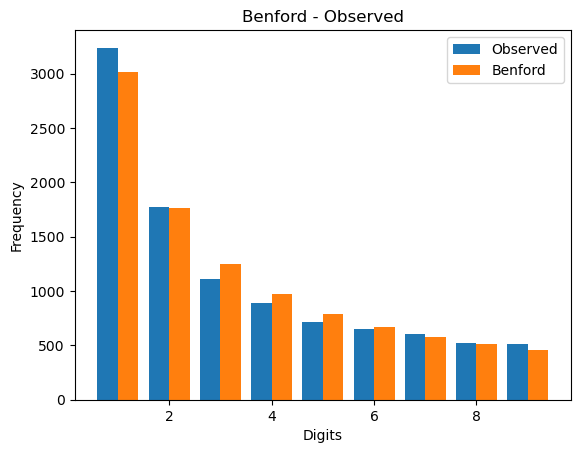

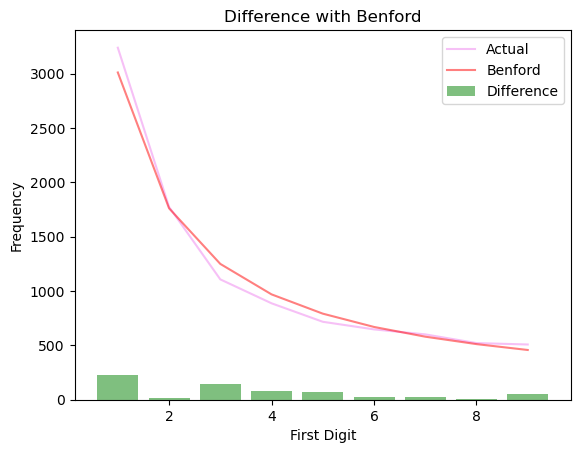

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9992911002602028, P-Value: 0.0
        R-squared: 0.9986


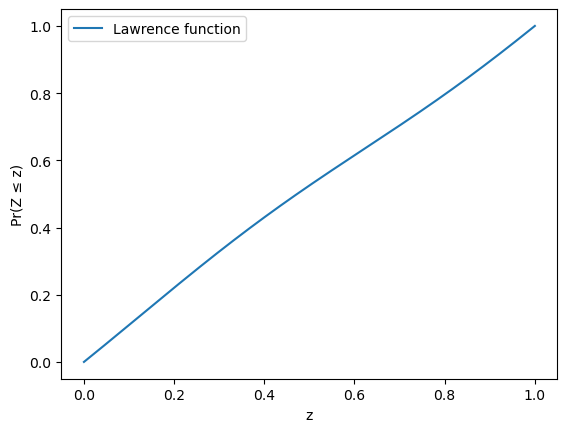

Distribution:


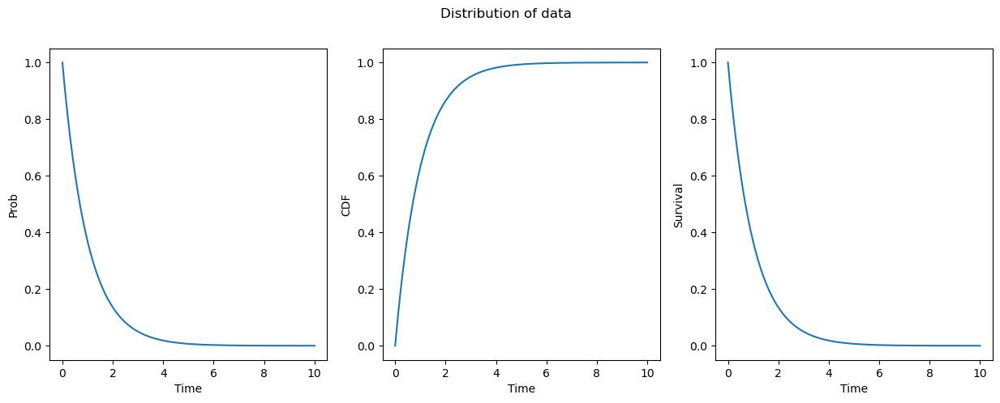

Lorenz Curve:


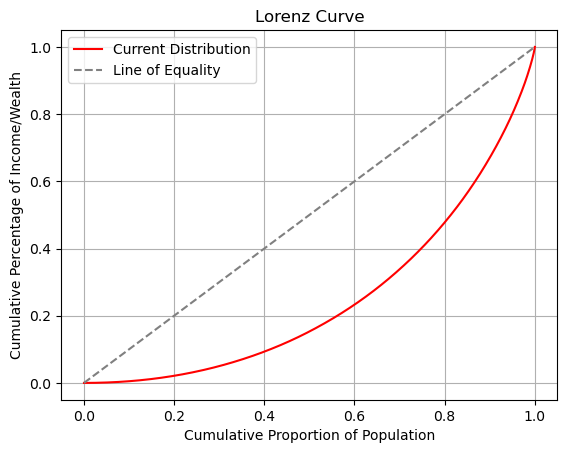

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9908
        Pearson Coefficient: -0.9954
        Slope (Regression): [-0.86032129]


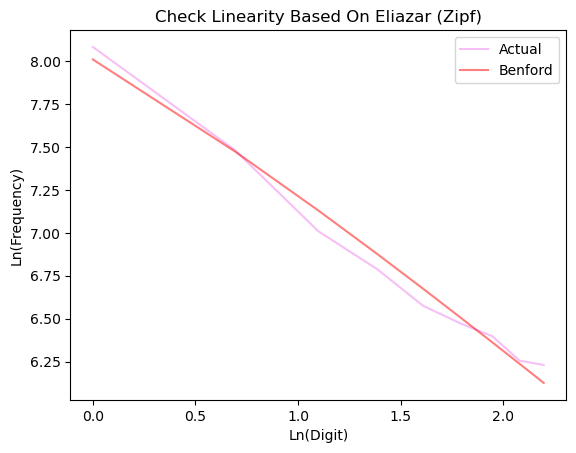

Scaled TTT:


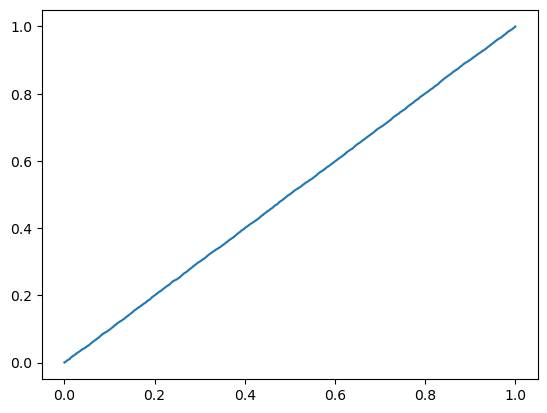

   Check t*h(t):
        Slope (Regression): [1.]
        Estimated value for p (denoted in eliazar): 1.0005


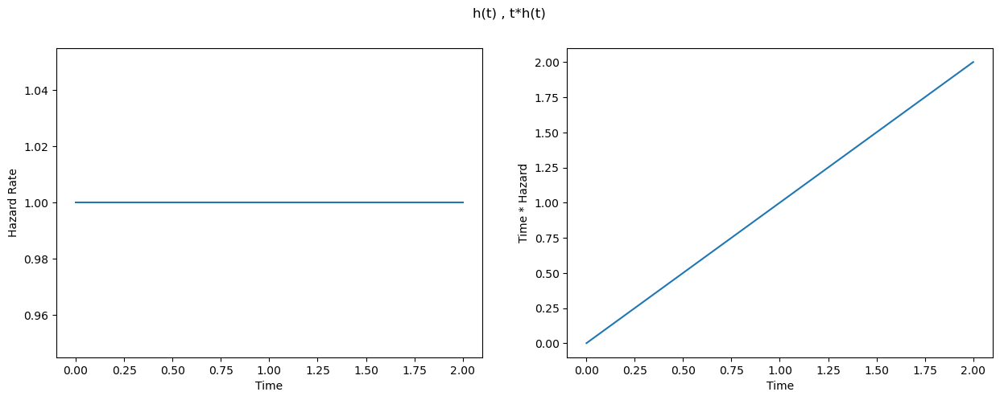

Statistical Tests:
    Chi2 Statistic: 16.9396319823646, Chi2 P-Value: 0.030743861627990463
    Lawrence Statistics-> c: 0.0016939631982364587, m: 0.0069532103693867725
    MAD Statistic: 0.0032598711542859166
    MAD result: None
    KS Statistic: 0.0143 KS P-Value: 0.2582344696265808
    Pearson Statistic: 0.9988864618223018 Pearson P-Value: 1.5154257837578663e-10
    J-Divergence: 0.0024353146130569403
Benford Check:


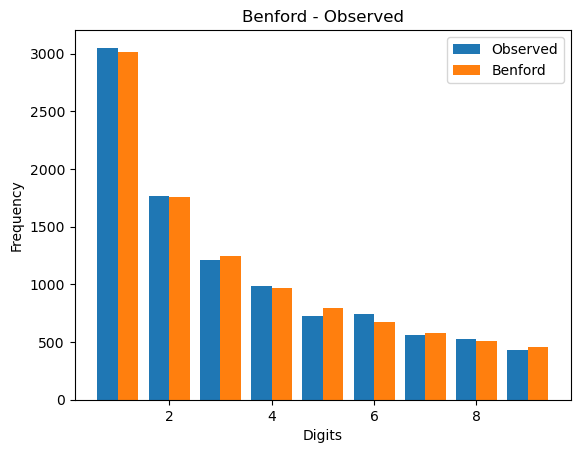

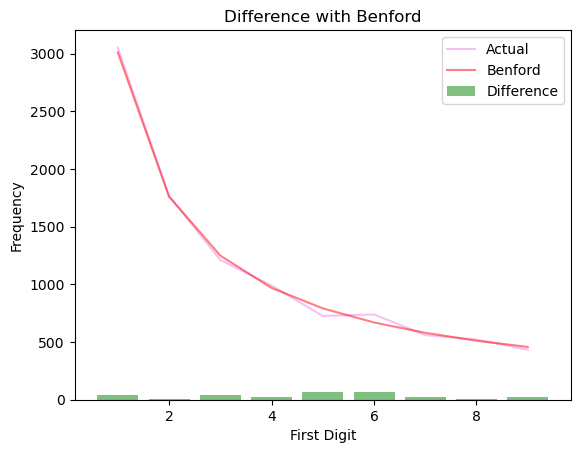

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999999999954512, P-Value: 0.0
        R-squared: 1.0000


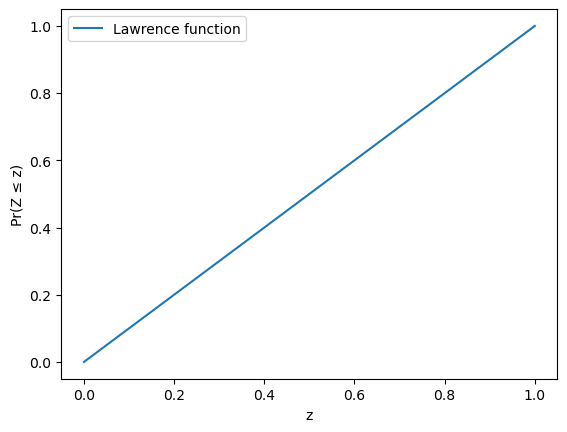

Distribution:


/Users/treant/anaconda3/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:2267: RuntimeWarning: divide by zero encountered in power
  return c*pow(x, c-1)*np.exp(-pow(x, c))


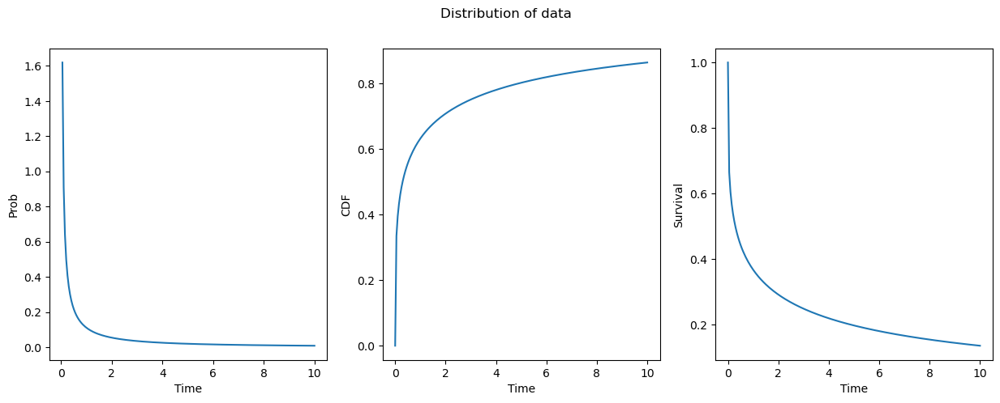

Lorenz Curve:


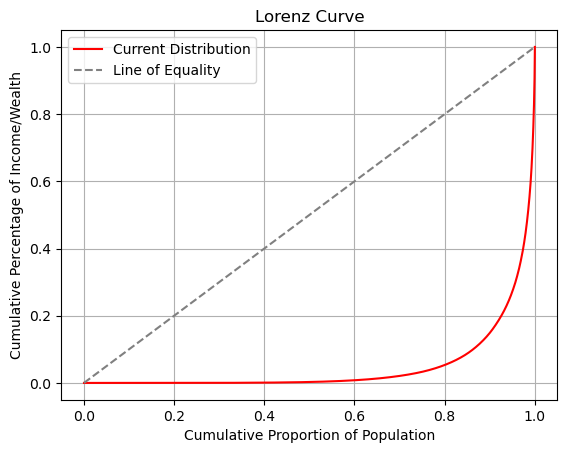

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9916
        Pearson Coefficient: -0.9958
        Slope (Regression): [-0.87280726]


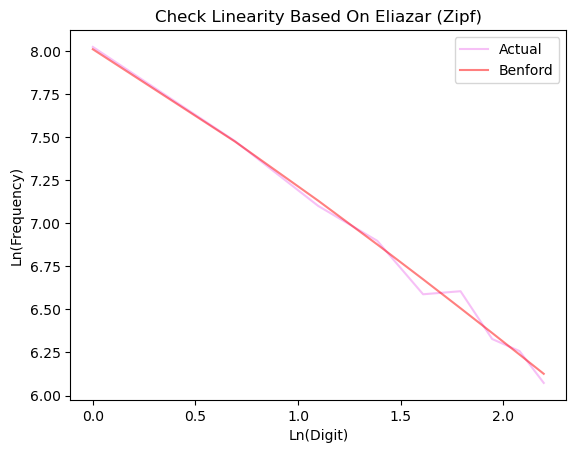

Scaled TTT:


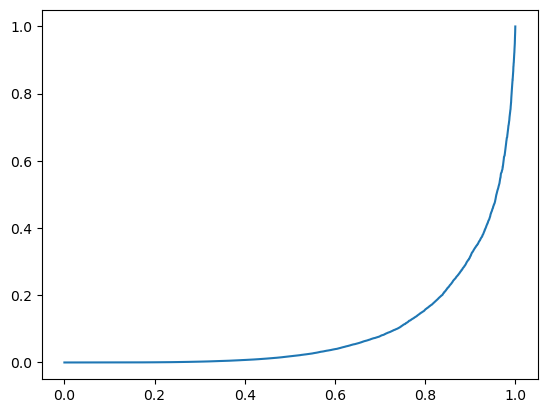

   Check t*h(t):
        Slope (Regression): [0.03676393]
        Estimated value for p (denoted in eliazar): 0.45880280525777833


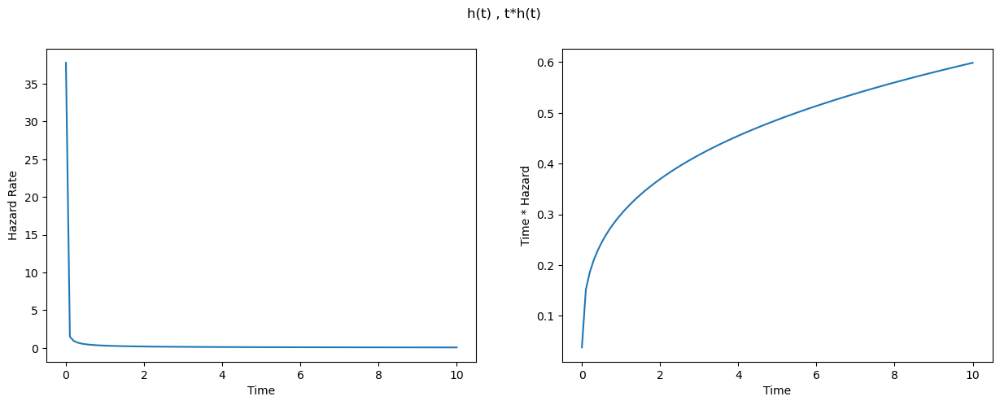

In [43]:
weibull_rv = weibull_min(c=1, scale=1)
data = weibull_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(weibull_rv)
analyzer.report()
la = LindyAnalyzer(weibull_rv)
la.show_hazard_rate(0, 2, LINDY_PRECISION)

weibull_rv = weibull_min(c=0.3, scale=1)
data = weibull_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(weibull_rv)
analyzer.report()
la = LindyAnalyzer(weibull_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

Statistical Tests:
    Chi2 Statistic: 12.17365689703349, Chi2 P-Value: 0.1436223010896027
    Lawrence Statistics-> c: 0.0012173656897033456, m: 0.010429995663981173
    MAD Statistic: 0.0032157093906720635
    MAD result: None
    KS Statistic: 0.0065 KS P-Value: 0.9841448923336962
    Pearson Statistic: 0.9990011779644462 Pearson P-Value: 1.035913850234081e-10
    J-Divergence: 0.0017338642119510556
Benford Check:


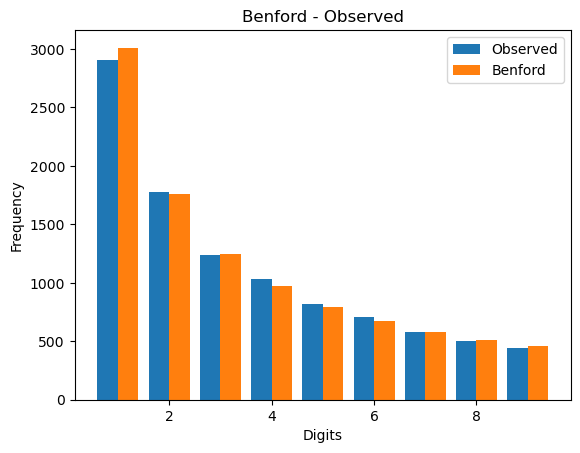

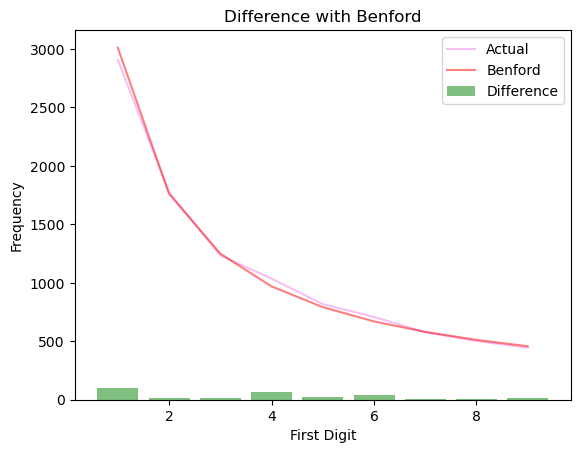

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9998350015249441, P-Value: 0.0
        R-squared: 0.9997


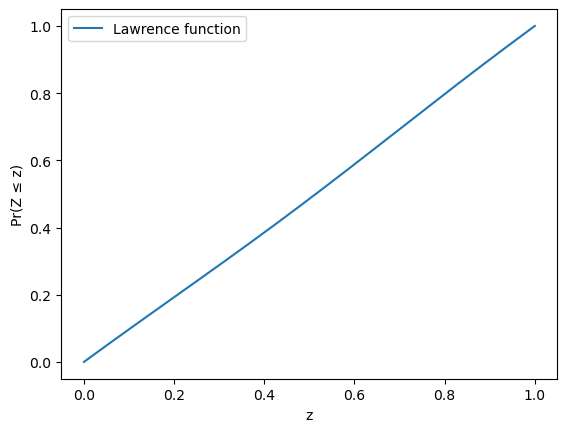

Distribution:


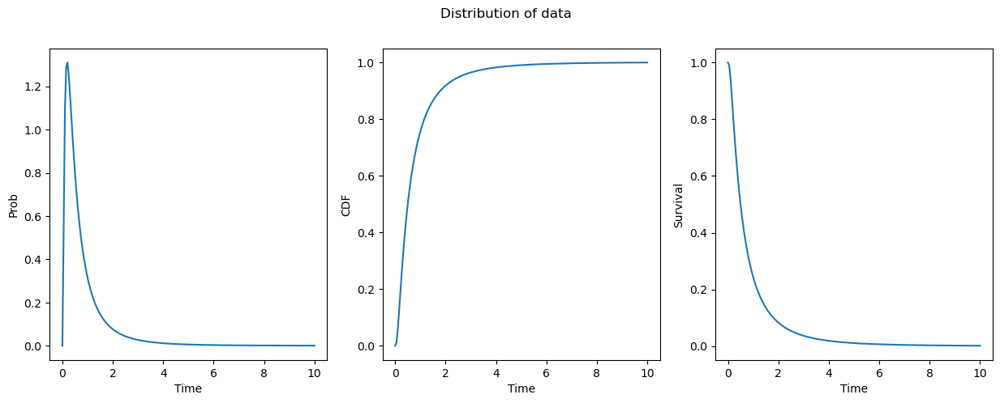

Lorenz Curve:


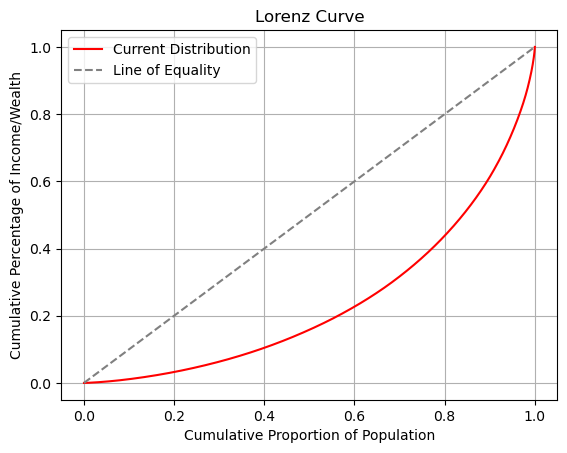

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9919
        Pearson Coefficient: -0.9960
        Slope (Regression): [-0.85532387]


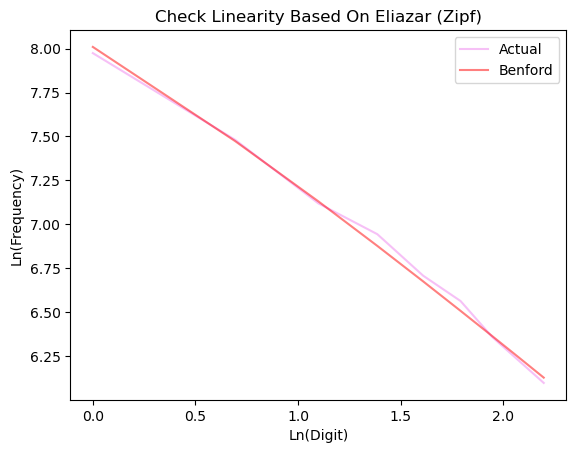

Scaled TTT:


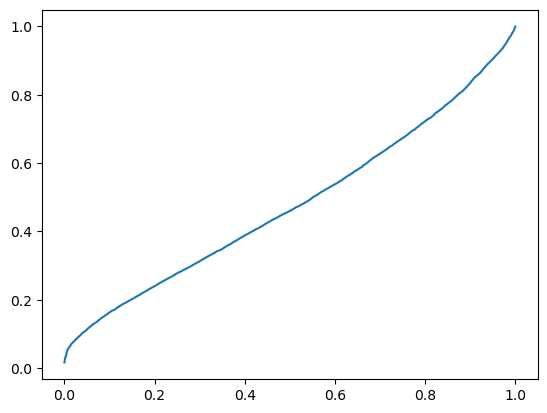

   Check t*h(t):
        Slope (Regression): [0.11855447]
        Estimated value for p (denoted in eliazar): 3.124152836125232


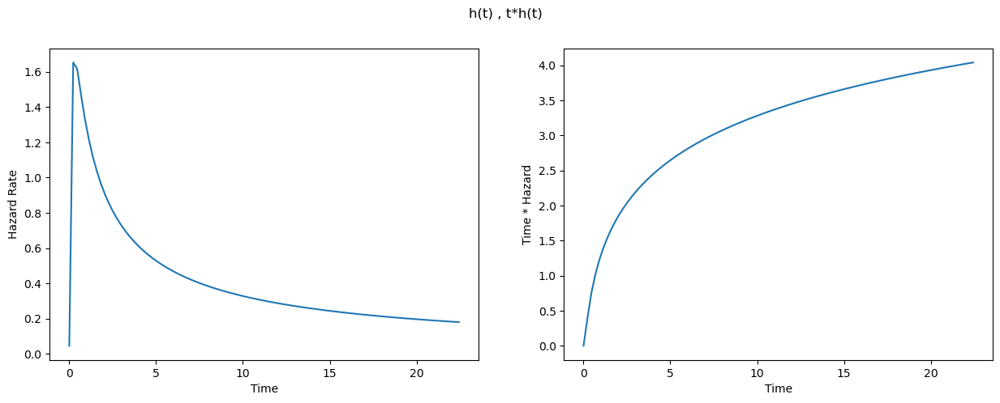

In [44]:
lognorm_rv = lognorm(s=1, scale=0.5)
data = lognorm_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(lognorm_rv)
analyzer.report()
la = LindyAnalyzer(lognorm_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

#### - Exponential

Statistical Tests:
    Chi2 Statistic: 58.498319566796646, Chi2 P-Value: 9.176833458345107e-10
    Lawrence Statistics-> c: 0.005849831956679664, m: 0.02000874094431876
    MAD Statistic: 0.007168886961769421
    MAD result: None
    KS Statistic: 0.0251 KS P-Value: 0.0036709697323378866
    Pearson Statistic: 0.9943452220971466 Pearson P-Value: 4.452474431498463e-08
    J-Divergence: 0.008459399112670334
Benford Check:


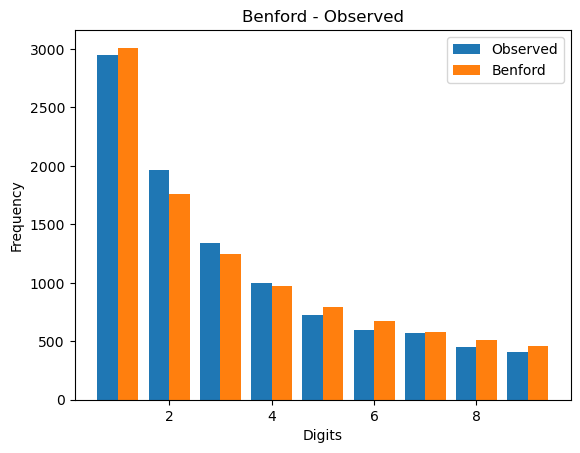

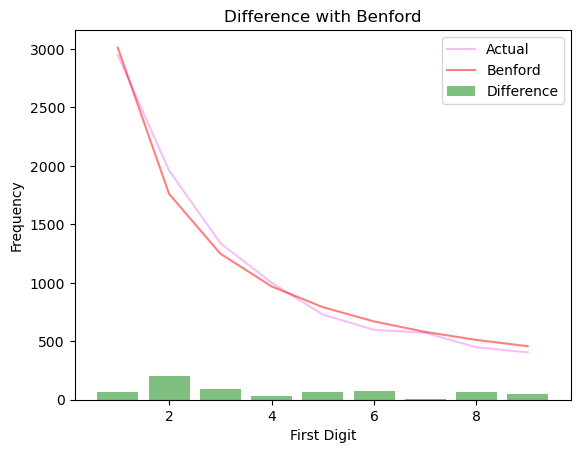

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9995157115549355, P-Value: 0.0
        R-squared: 0.9990


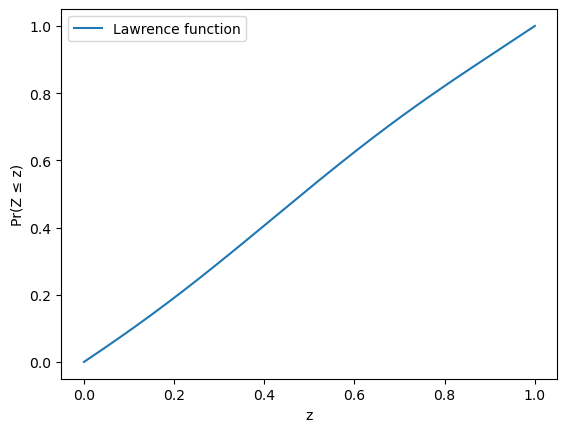

Distribution:


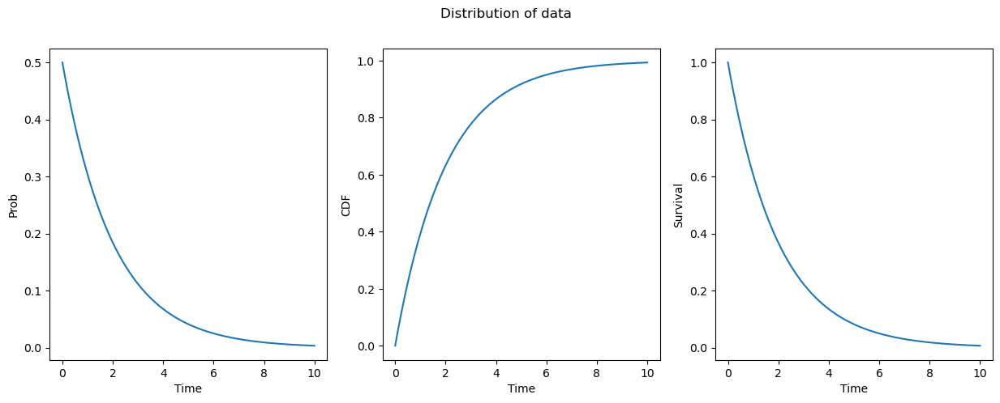

Lorenz Curve:


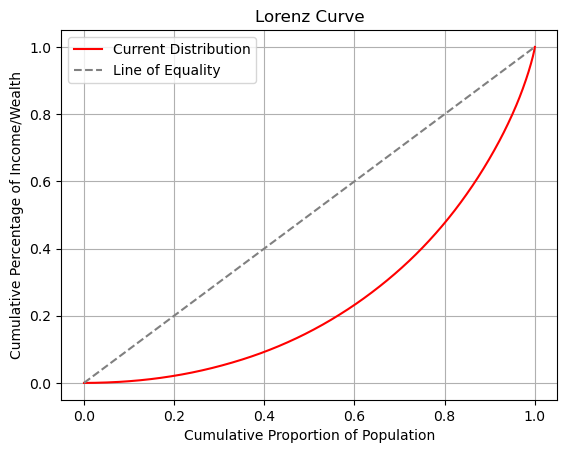

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9833
        Pearson Coefficient: -0.9916
        Slope (Regression): [-0.94059691]


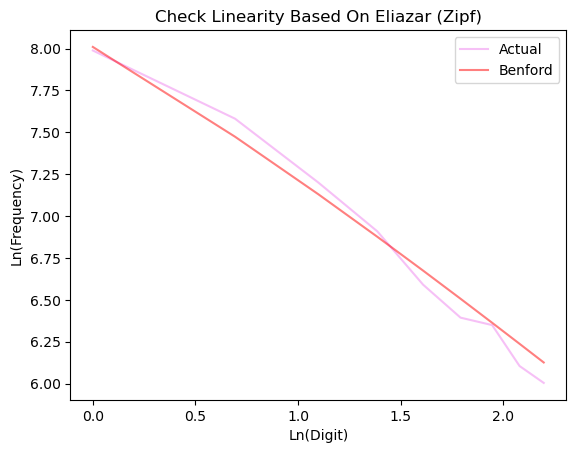

Scaled TTT:


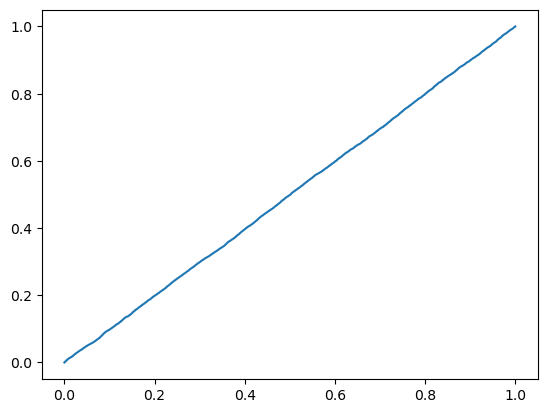

   Check t*h(t):
        Slope (Regression): [0.5]
        Estimated value for p (denoted in eliazar): 0.25025000000000003


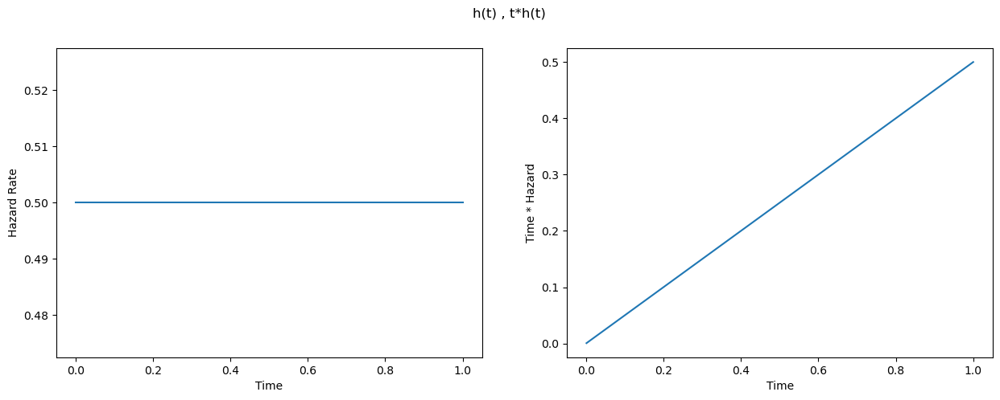

Statistical Tests:
    Chi2 Statistic: 55.699956436090844, Chi2 P-Value: 3.226947837064934e-09
    Lawrence Statistics-> c: 0.00556999564360908, m: 0.01882999566398119
    MAD Statistic: 0.007261943395630573
    MAD result: None
    KS Statistic: 0.035 KS P-Value: 9.552169730167214e-06
    Pearson Statistic: 0.9984552036791634 Pearson P-Value: 4.763584762615175e-10
    J-Divergence: 0.00789445525868607
Benford Check:


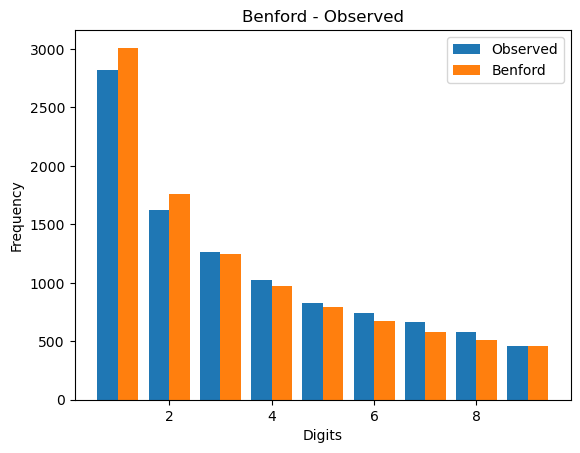

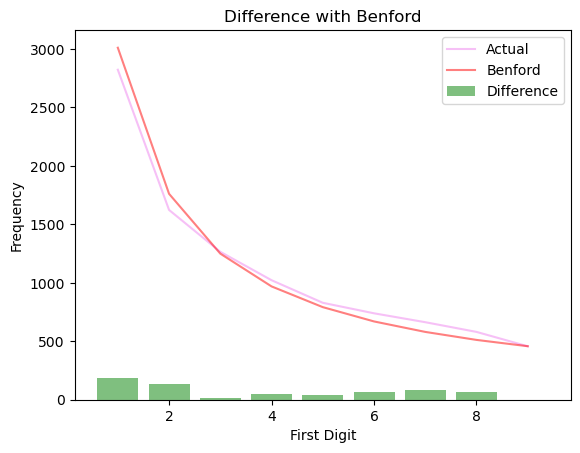

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9991016425788022, P-Value: 0.0
        R-squared: 0.9982


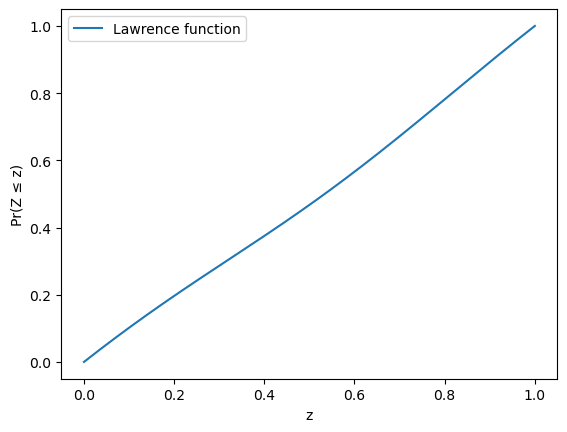

Distribution:


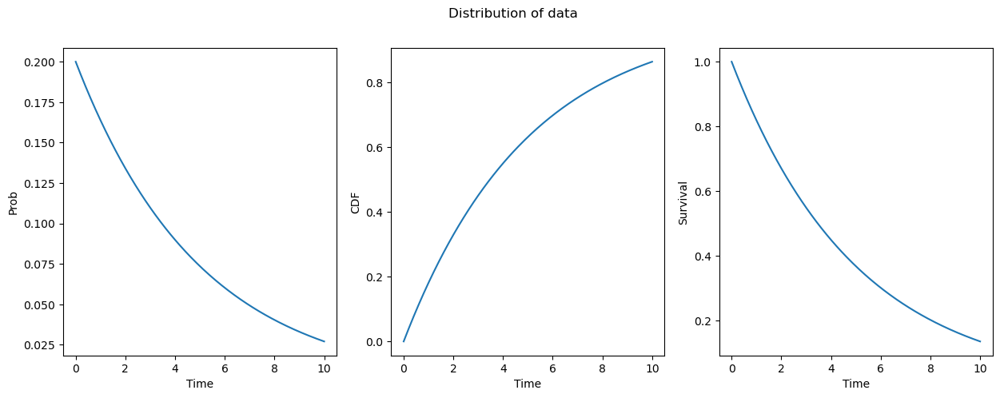

Lorenz Curve:


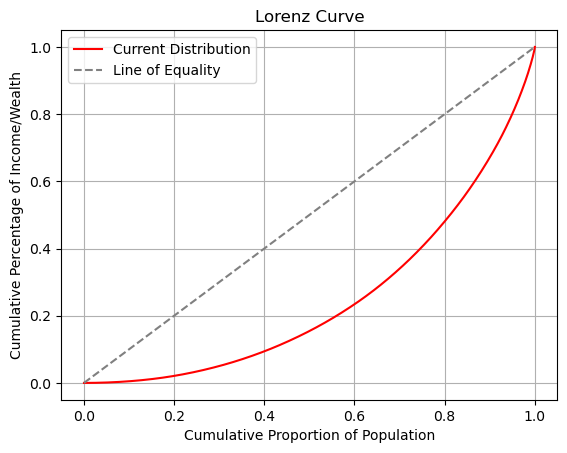

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9902
        Pearson Coefficient: -0.9951
        Slope (Regression): [-0.78099506]


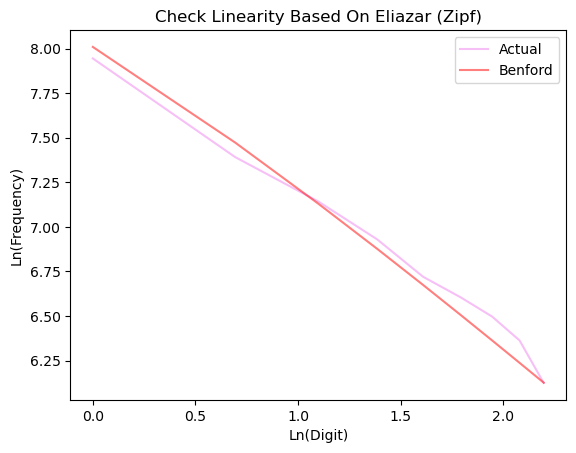

Scaled TTT:


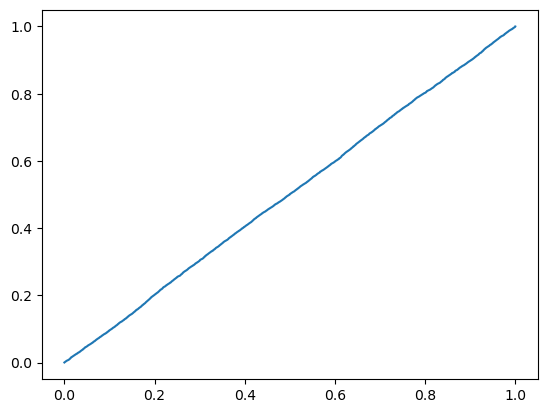

   Check t*h(t):
        Slope (Regression): [0.2]
        Estimated value for p (denoted in eliazar): 0.5000999999999999


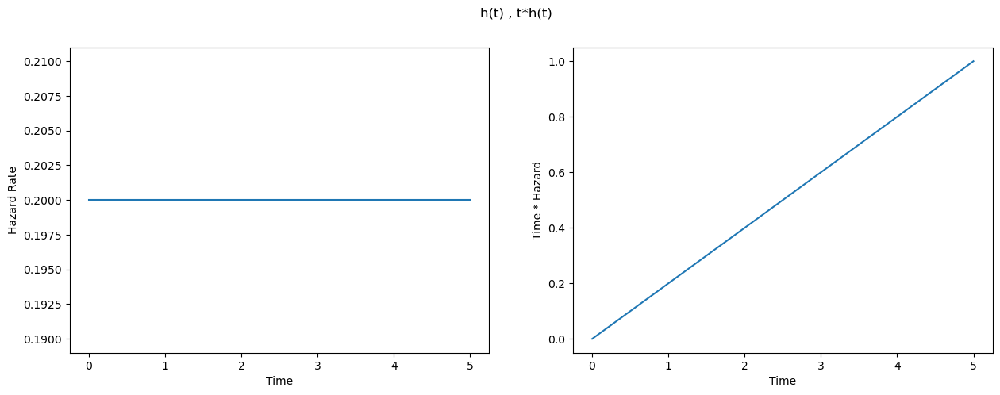

In [45]:
expon_rv = expon(scale=2)
data = expon_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(expon_rv)
analyzer.report()
la = LindyAnalyzer(expon_rv)
la.show_hazard_rate(0, 1, LINDY_PRECISION)

expon_rv = expon(scale=5)
data = expon_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(expon_rv)
analyzer.report()
la = LindyAnalyzer(expon_rv)
la.show_hazard_rate(0, 5, LINDY_PRECISION)

#### - Lognormal

Statistical Tests:
    Chi2 Statistic: 19.884908463825436, Chi2 P-Value: 0.010780361131284529
    Lawrence Statistics-> c: 0.0019884908463825455, m: 0.012570004336018792
    MAD Statistic: 0.004515681510590427
    MAD result: None
    KS Statistic: 0.0124 KS P-Value: 0.42554664596413133
    Pearson Statistic: 0.9979686501507244 Pearson P-Value: 1.2414395497268408e-09
    J-Divergence: 0.002831467311707827
Benford Check:


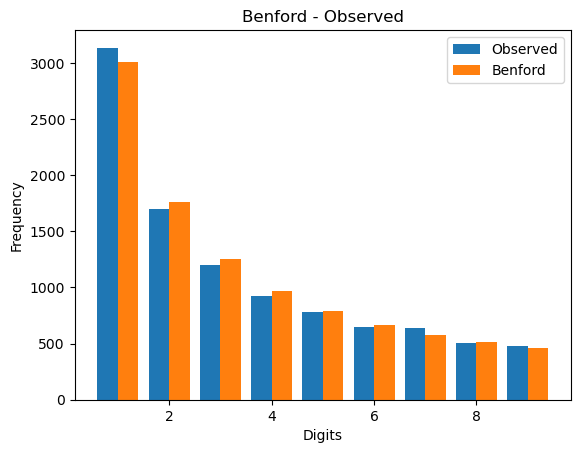

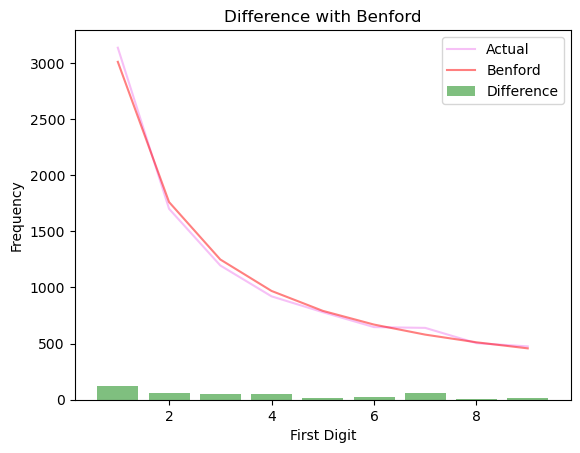

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999282423835549, P-Value: 0.0
        R-squared: 0.9999


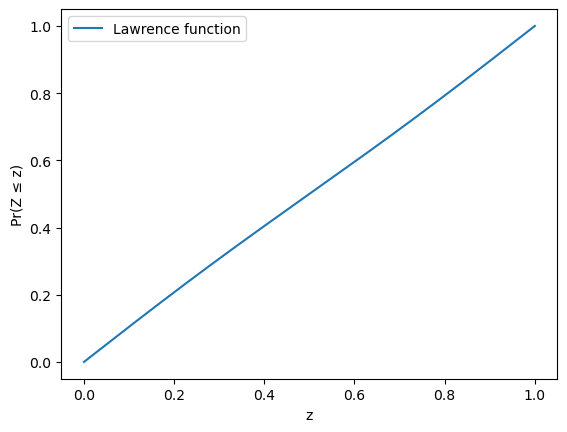

Distribution:


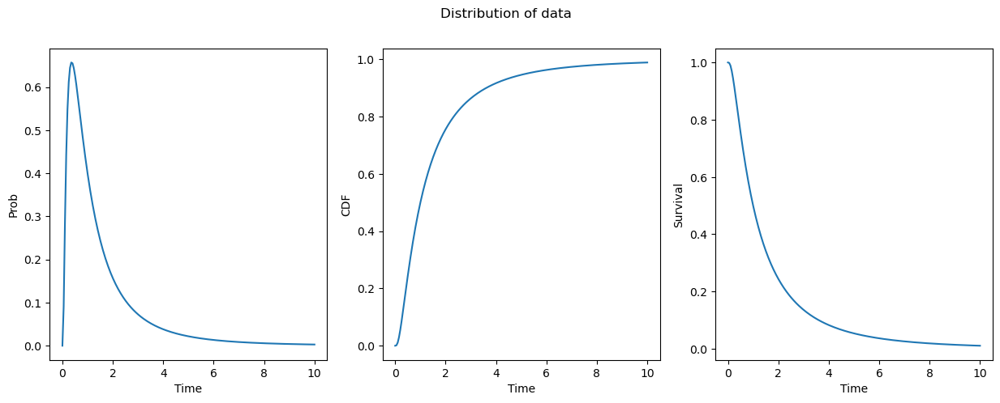

Lorenz Curve:


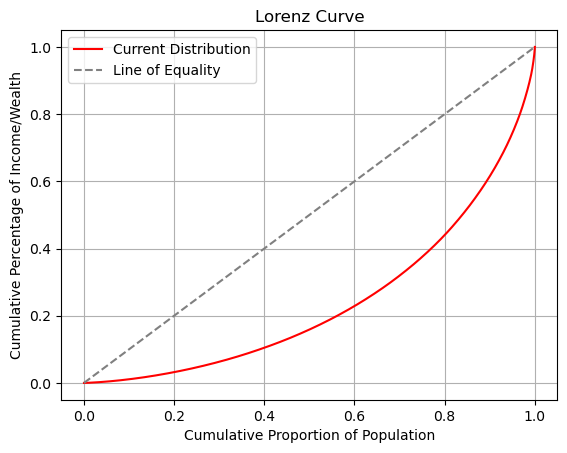

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9963
        Pearson Coefficient: -0.9981
        Slope (Regression): [-0.85437721]


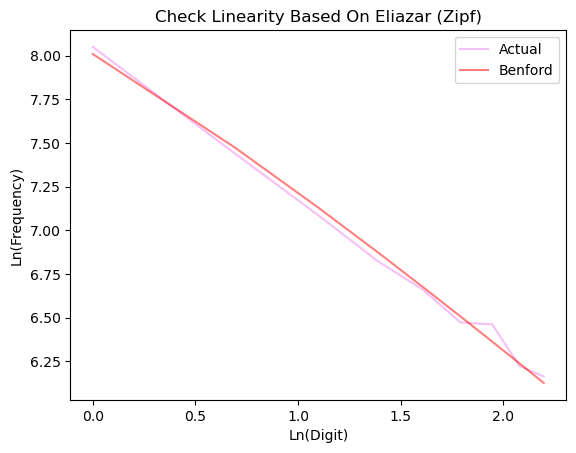

Scaled TTT:


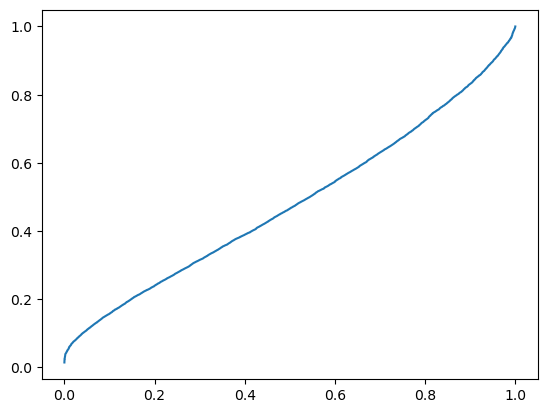

   Check t*h(t):
        Slope (Regression): [0.03676393]
        Estimated value for p (denoted in eliazar): 0.45880280525777833


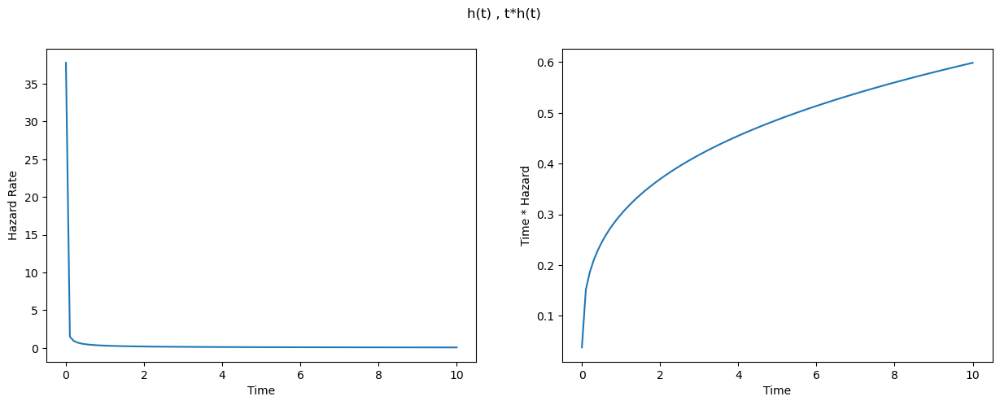

Statistical Tests:
    Chi2 Statistic: 8574.353962346651, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.8574353962346651, m: 0.1928700043360188
    MAD Statistic: 0.09449361215992497
    MAD result: None
    KS Statistic: 0.2349 KS P-Value: 2.657106121555293e-242
    Pearson Statistic: 0.6681862364534521 Pearson P-Value: 0.0491583268415093
    J-Divergence: 2.256945703180615
Benford Check:


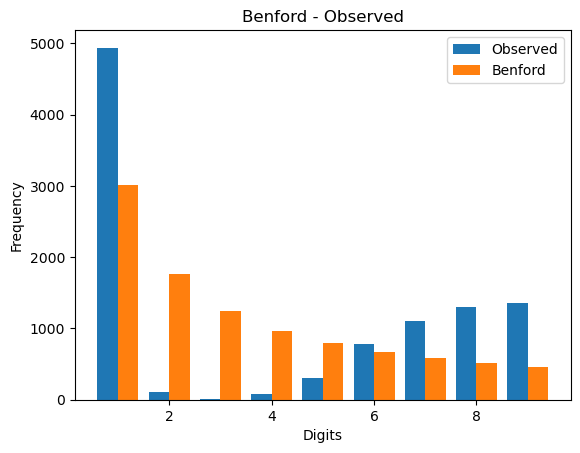

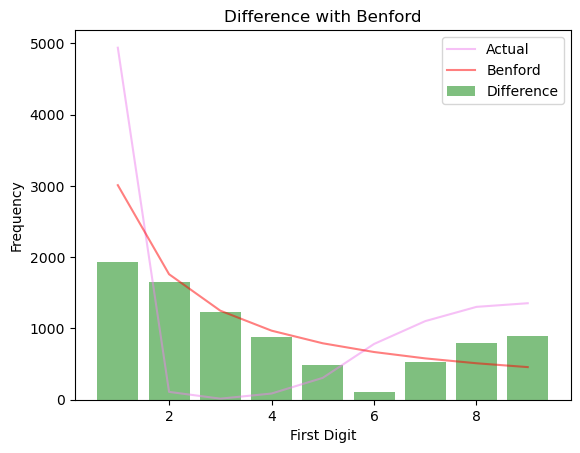

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.8635057128110248, P-Value: 6.067492206445091e-299
        R-squared: 0.7456


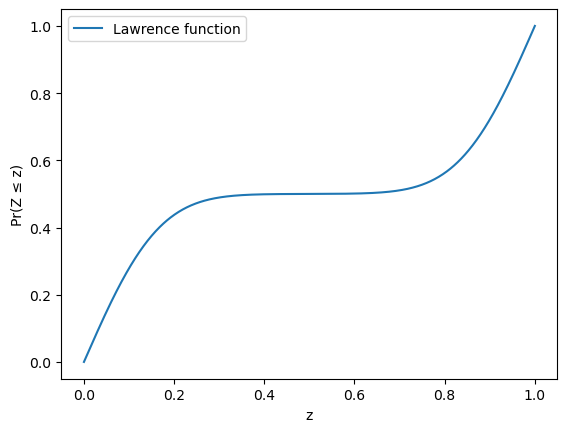

Distribution:


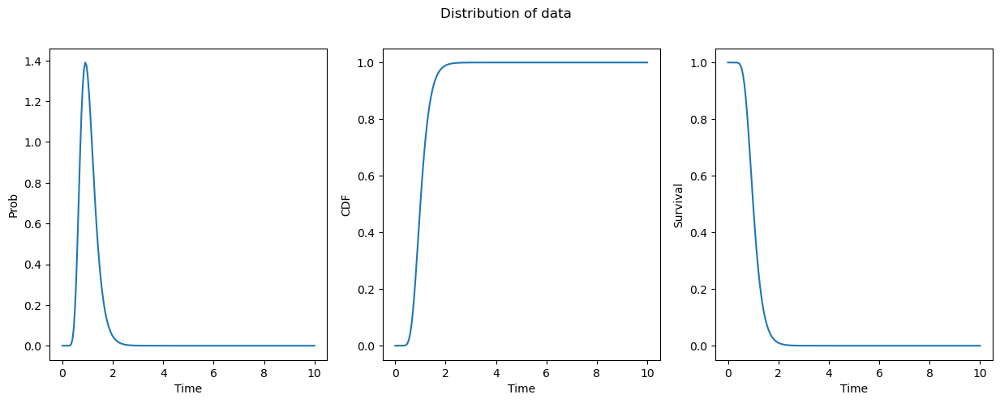

Lorenz Curve:


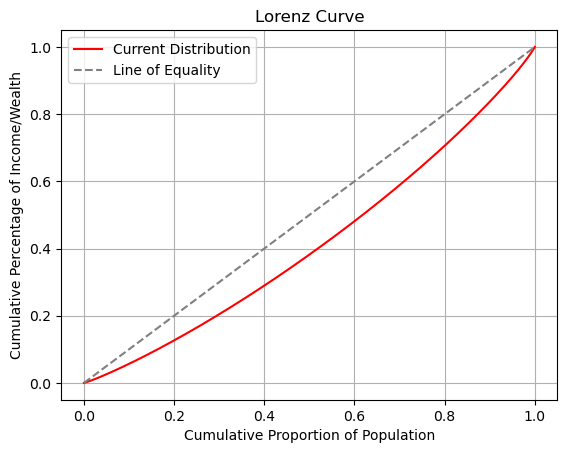

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0083
        Pearson Coefficient: 0.0909
        Slope (Regression): [0.22576588]


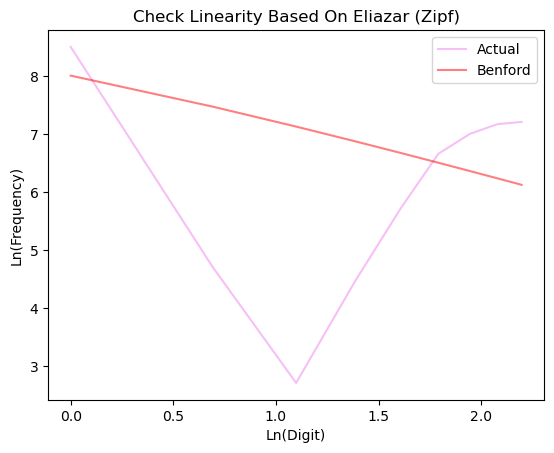

Scaled TTT:


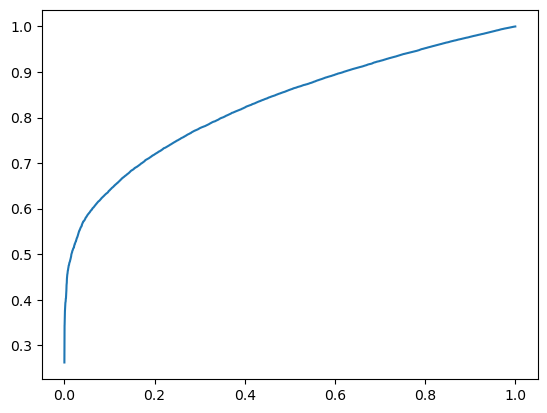

   Check t*h(t):
        Slope (Regression): [2.62277515]
        Estimated value for p (denoted in eliazar): 16.24689304284827


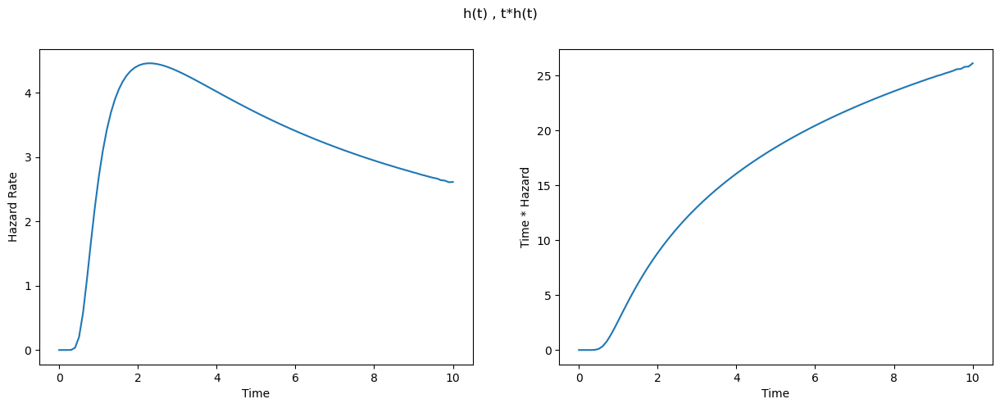

Statistical Tests:
    Chi2 Statistic: 15.449198831880757, Chi2 P-Value: 0.05097751104229577
    Lawrence Statistics-> c: 0.0015449198831880761, m: 0.010029995663981217
    MAD Statistic: 0.003540281717270863
    MAD result: None
    KS Statistic: 0.0106 KS P-Value: 0.6279782033821611
    Pearson Statistic: 0.9993482363880081 Pearson P-Value: 2.3258259121141844e-11
    J-Divergence: 0.002187244723914105
Benford Check:


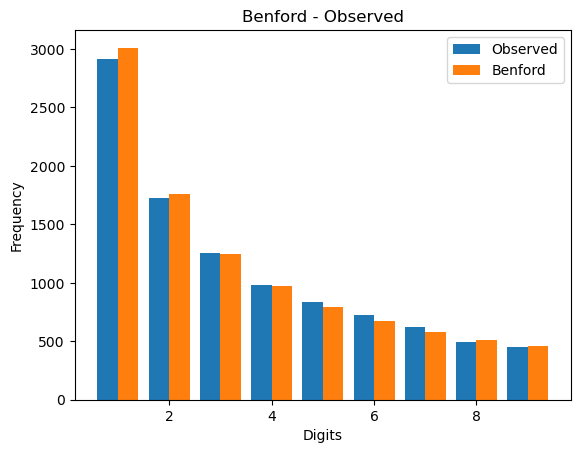

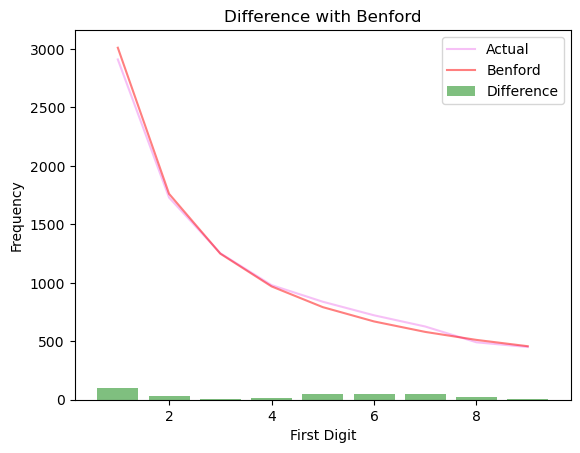

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9998350015249441, P-Value: 0.0
        R-squared: 0.9997


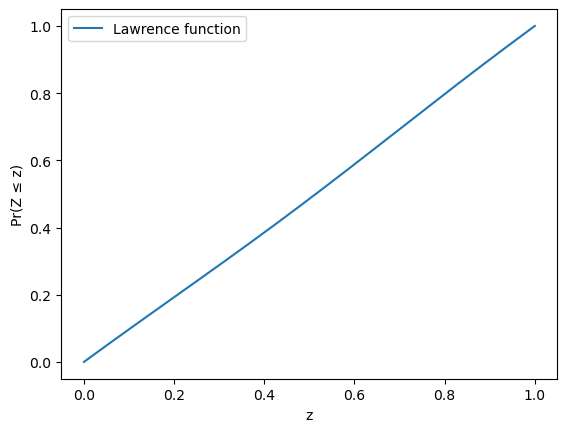

Distribution:


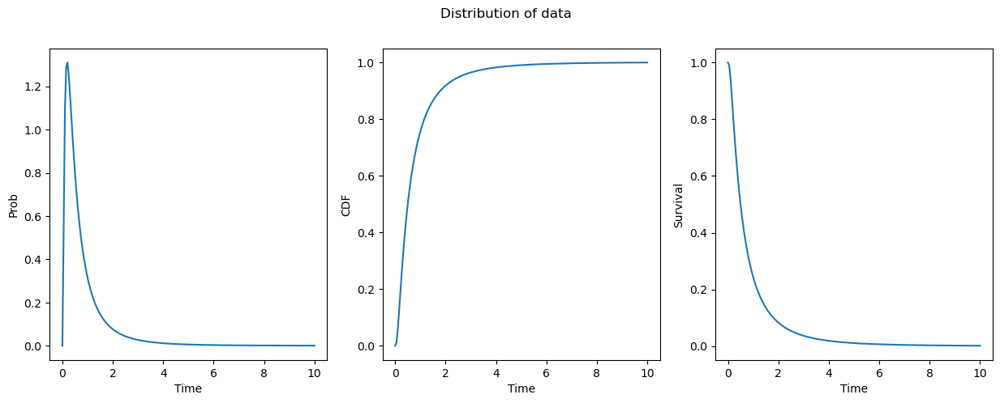

Lorenz Curve:


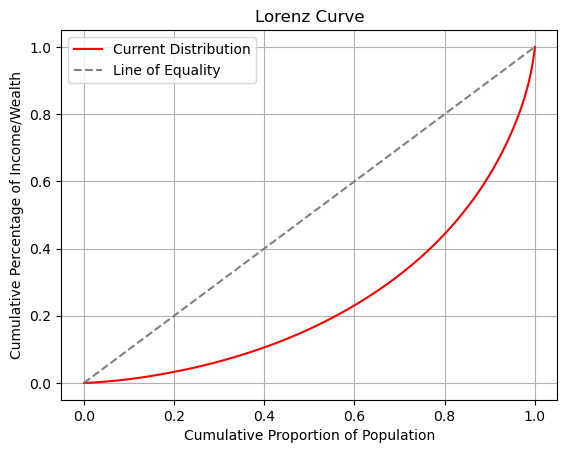

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9915
        Pearson Coefficient: -0.9957
        Slope (Regression): [-0.83935646]


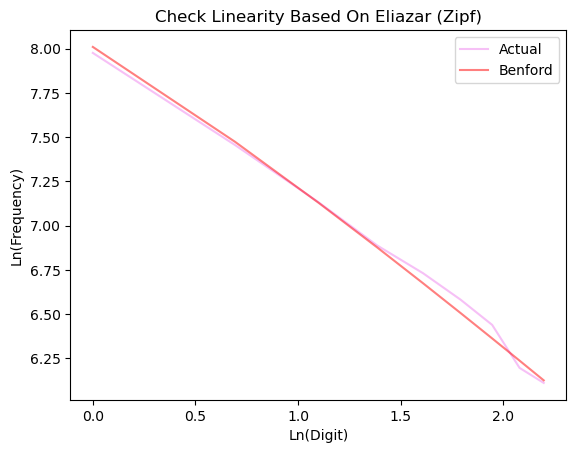

Scaled TTT:


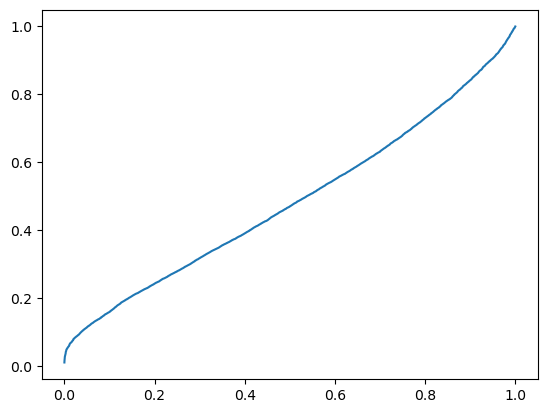

   Check t*h(t):
        Slope (Regression): [0.24602612]
        Estimated value for p (denoted in eliazar): 2.412415650594268


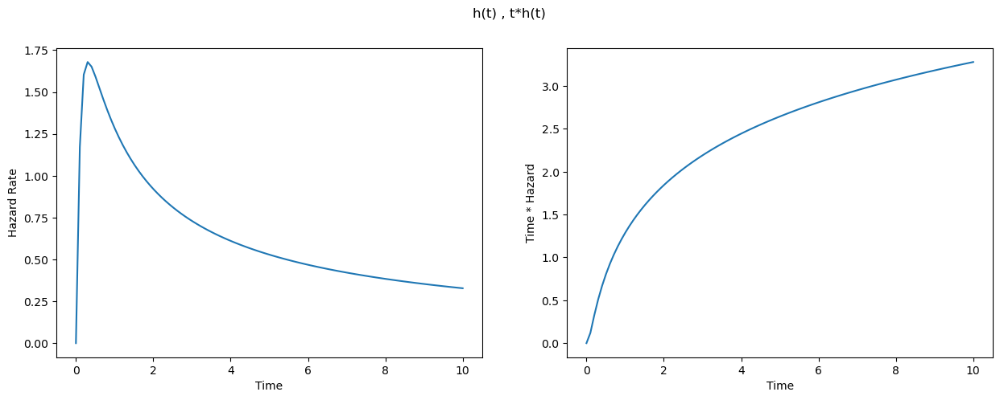

In [46]:
lognorm_rv = lognorm(s=1, scale=1)
data = lognorm_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(lognorm_rv)
analyzer.report()
la = LindyAnalyzer(weibull_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

lognorm_rv = lognorm(s=0.3, scale=1)
data = lognorm_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(lognorm_rv)
analyzer.report()
la = LindyAnalyzer(lognorm_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

lognorm_rv = lognorm(s=1, scale=0.5)
data = lognorm_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(lognorm_rv)
analyzer.report()
la = LindyAnalyzer(lognorm_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

#### - Gamma

Statistical Tests:
    Chi2 Statistic: 52.14673970408674, Chi2 P-Value: 1.5767852765506187e-08
    Lawrence Statistics-> c: 0.005214673970408678, m: 0.022870004336018823
    MAD Statistic: 0.007049167715480539
    MAD result: None
    KS Statistic: 0.0247 KS P-Value: 0.004480286858008985
    Pearson Statistic: 0.9949969710940502 Pearson P-Value: 2.9022729823892762e-08
    J-Divergence: 0.0076324422619372875
Benford Check:


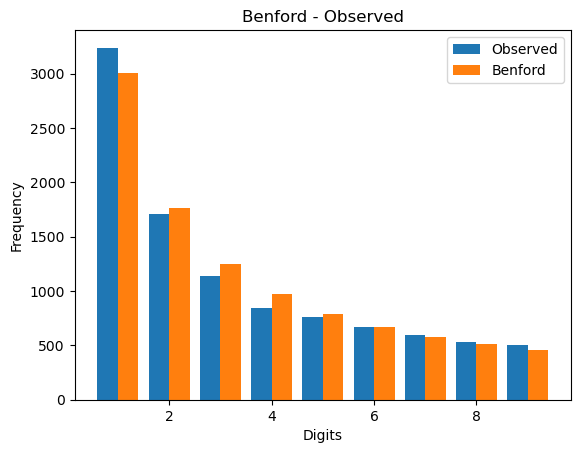

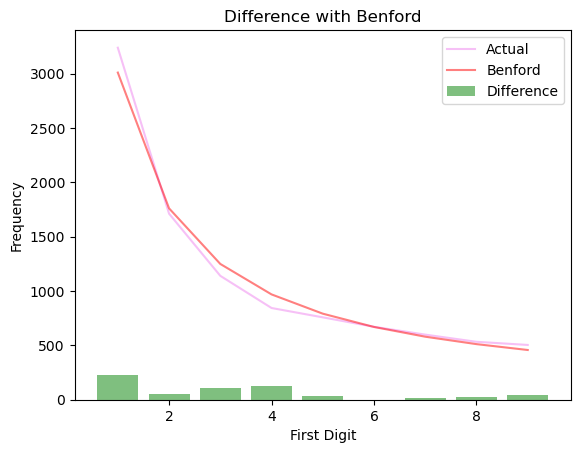

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9992911002602027, P-Value: 0.0
        R-squared: 0.9986


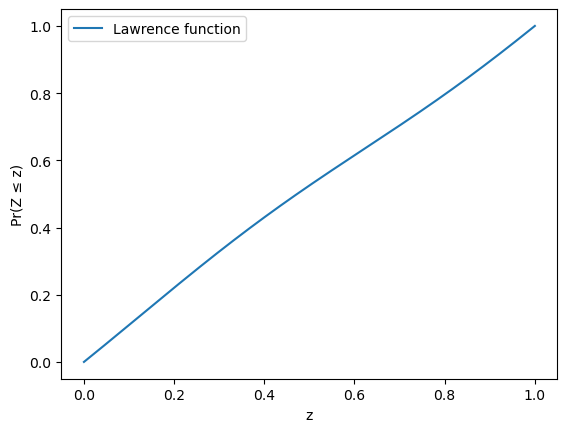

Distribution:


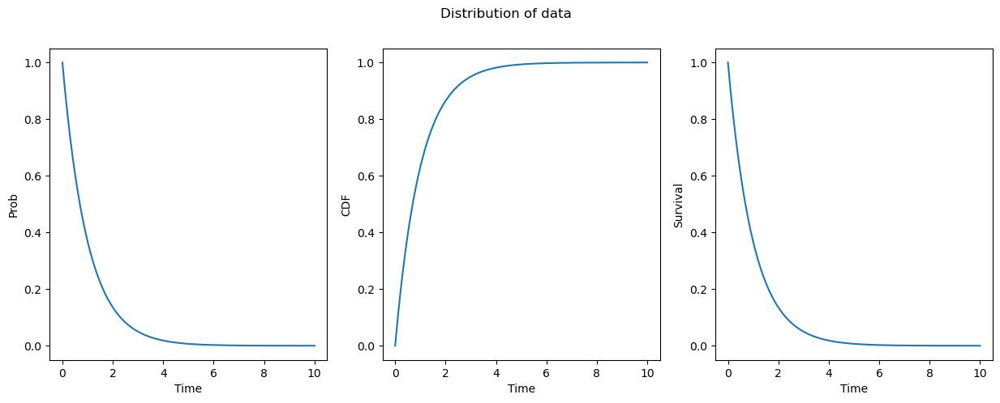

Lorenz Curve:


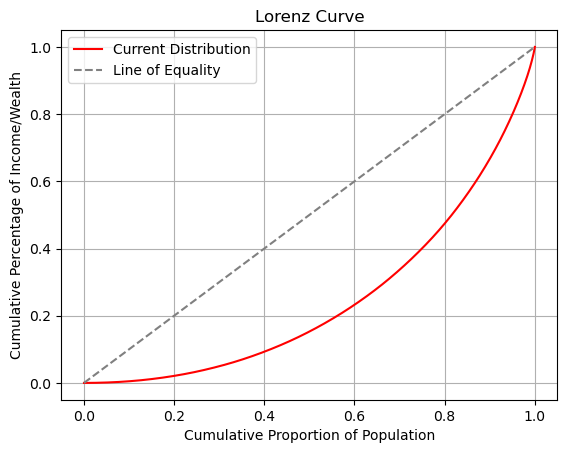

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9920
        Pearson Coefficient: -0.9960
        Slope (Regression): [-0.84854685]


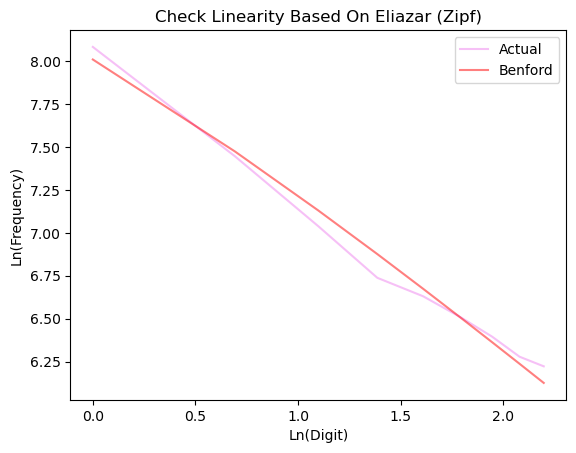

Scaled TTT:


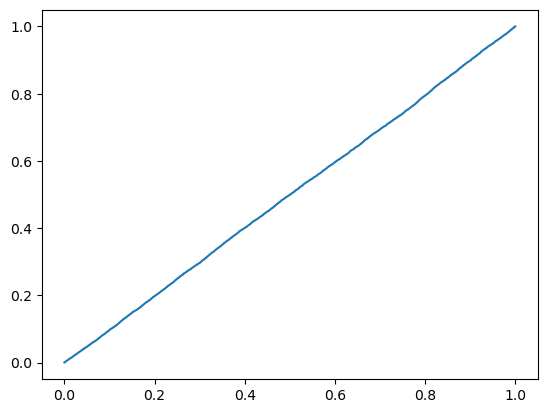

   Check t*h(t):
        Slope (Regression): [1.]
        Estimated value for p (denoted in eliazar): 0.1505


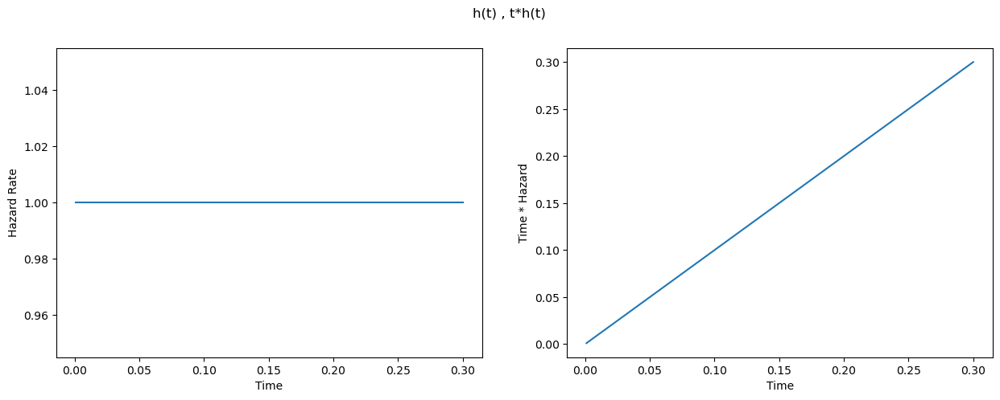

Statistical Tests:
    Chi2 Statistic: 13.433414372114928, Chi2 P-Value: 0.09778184067158234
    Lawrence Statistics-> c: 0.0013433414372114936, m: 0.006042509439324856
    MAD Statistic: 0.0025598432742042813
    MAD result: None
    KS Statistic: 0.0086 KS P-Value: 0.8533882178607826
    Pearson Statistic: 0.999249409729706 Pearson P-Value: 3.811802036874021e-11
    J-Divergence: 0.001885599758452163
Benford Check:


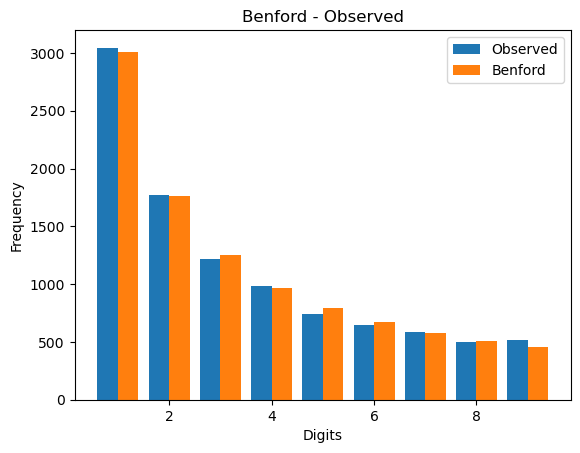

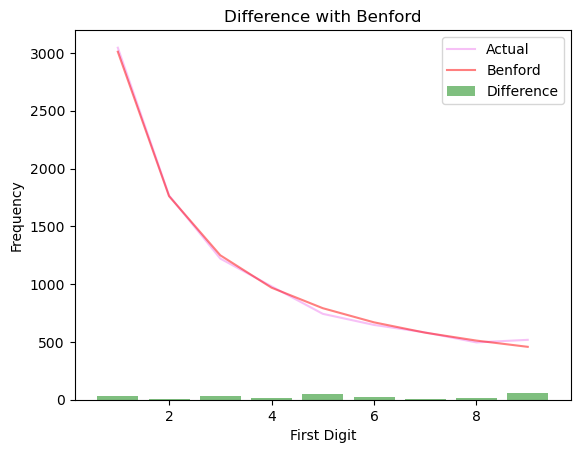

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999877501780179, P-Value: 0.0
        R-squared: 1.0000


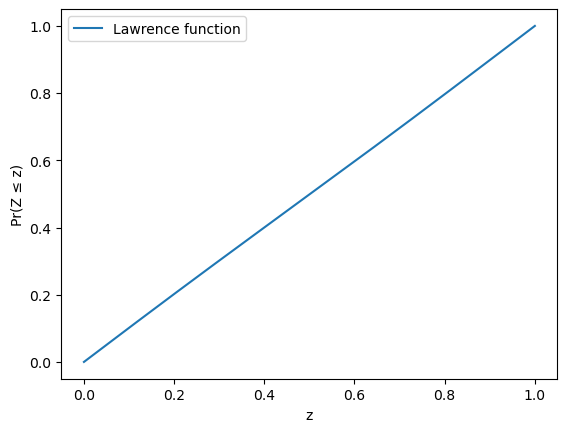

Distribution:


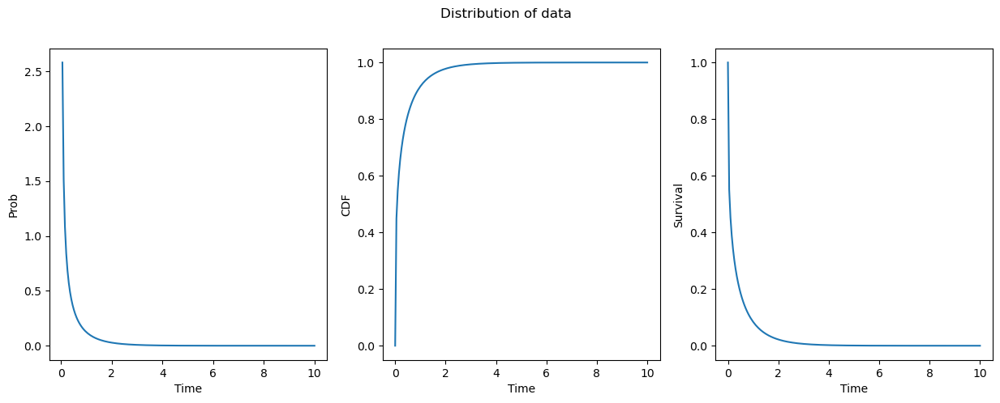

Lorenz Curve:


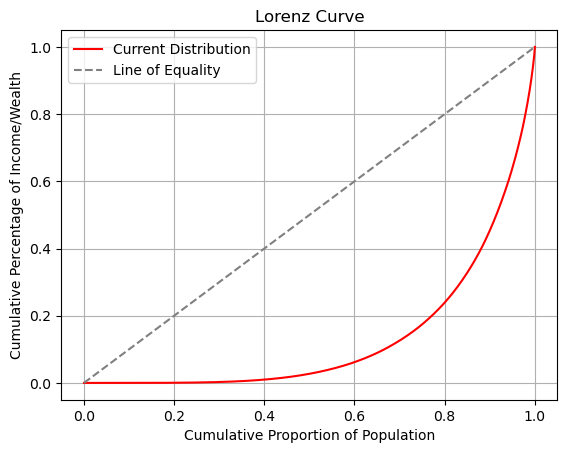

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9942
        Pearson Coefficient: -0.9971
        Slope (Regression): [-0.85366212]


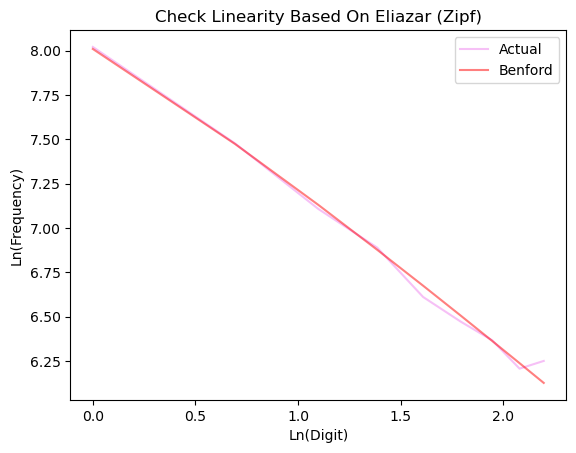

Scaled TTT:


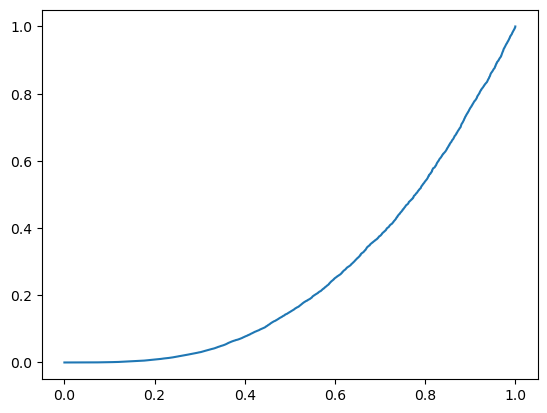

   Check t*h(t):
        Slope (Regression): [1.2783818]
        Estimated value for p (denoted in eliazar): 0.8598733806209702


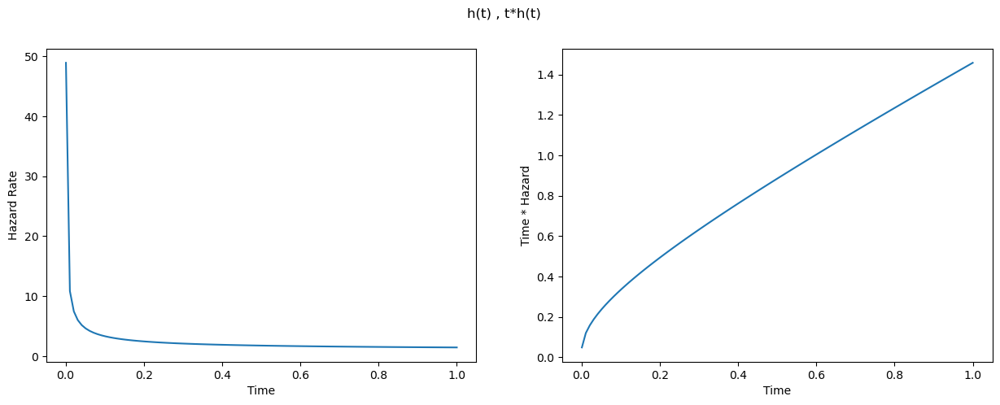

In [47]:
gamma_rv = gamma(a=1, scale=1)
data = gamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(gamma_rv)
analyzer.report()
la = LindyAnalyzer(gamma_rv)
la.show_hazard_rate(0, 0.3, LINDY_PRECISION)

gamma_rv = gamma(a=0.3, scale=1)
data = gamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(gamma_rv)
analyzer.report()
la = LindyAnalyzer(gamma_rv)
la.show_hazard_rate(0, 1, LINDY_PRECISION)


#### - Beta

Statistical Tests:
    Chi2 Statistic: 3912.994217301291, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.3912994217301291, m: 0.1891299956639812
    MAD Statistic: 0.05932444251732497
    MAD result: None
    KS Statistic: 0.2752 KS P-Value: 1e-323
    Pearson Statistic: 0.2463241262801156 Pearson P-Value: 0.5228777400884358
    J-Divergence: 0.5598125960318499
Benford Check:


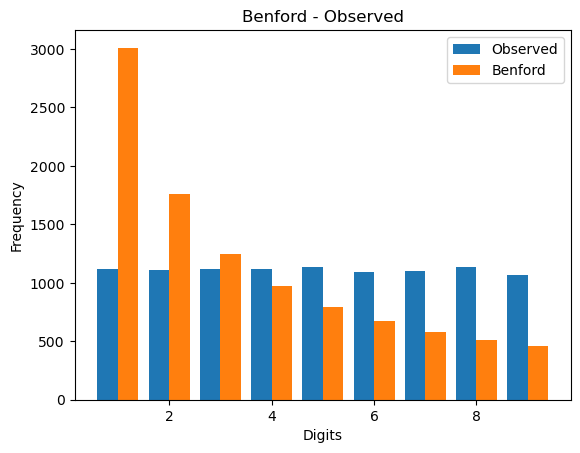

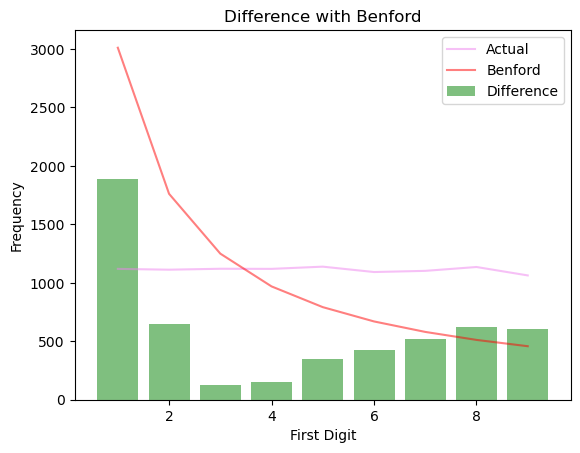

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9598678866780421, P-Value: 0.0
        R-squared: 0.9213


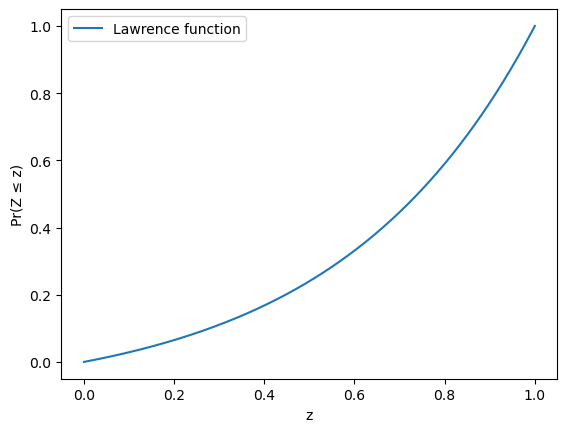

Distribution:


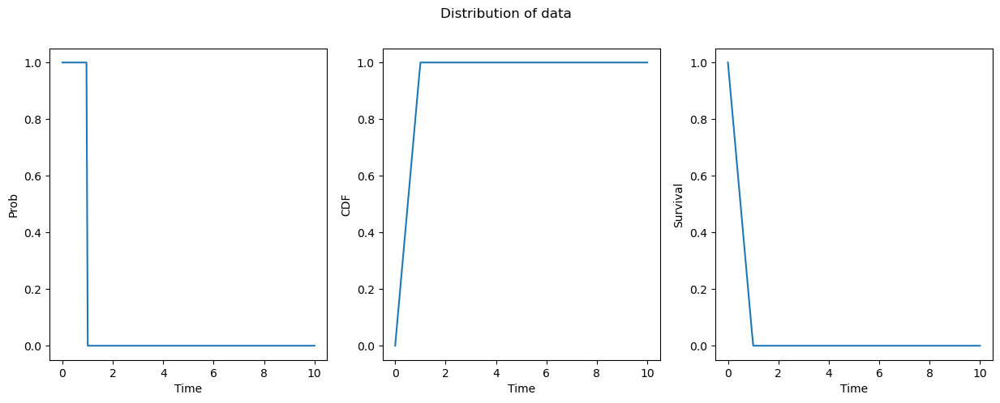

Lorenz Curve:


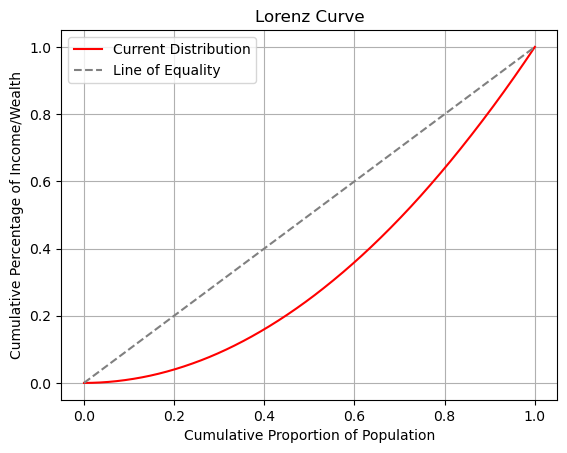

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.1102
        Pearson Coefficient: -0.3320
        Slope (Regression): [-0.00967682]


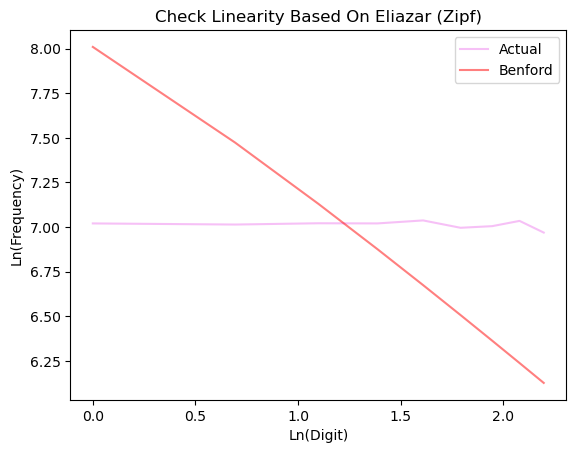

Scaled TTT:


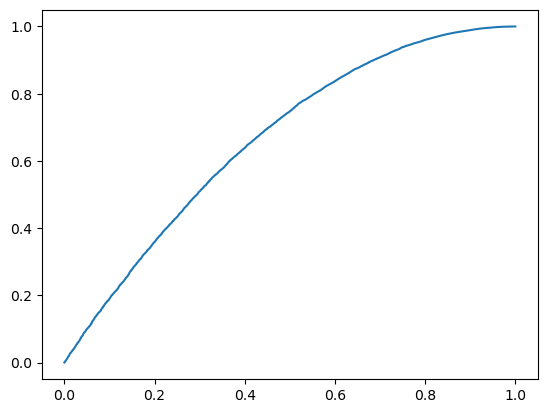

   Check t*h(t):
        Slope (Regression): [10.12759395]
        Estimated value for p (denoted in eliazar): 2.446576823933367


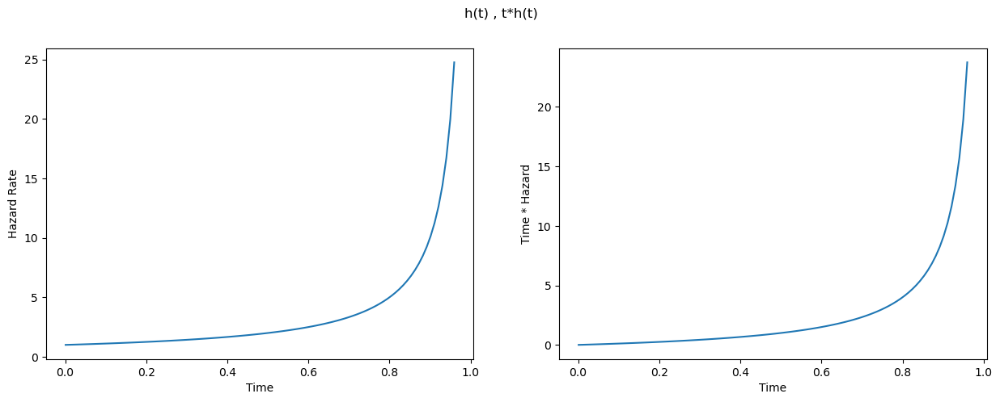

Statistical Tests:
    Chi2 Statistic: 15062.250145600738, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 1.5062250145600742, m: 0.24664250943932486
    MAD Statistic: 0.06856694452969858
    MAD result: None
    KS Statistic: 0.309 KS P-Value: 1e-323
    Pearson Statistic: -0.026823040870201667 Pearson P-Value: 0.9453893014274416
    J-Divergence: 0.978438035992703
Benford Check:


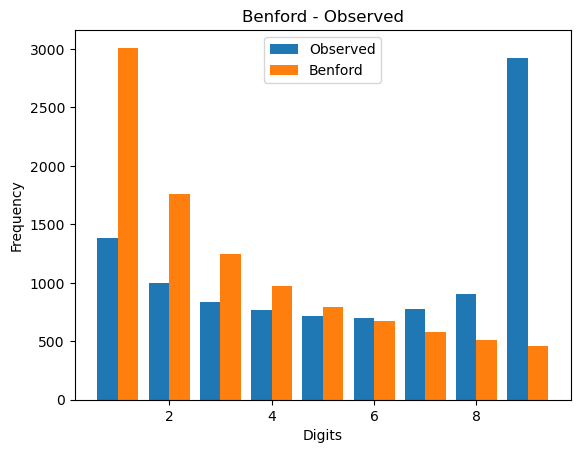

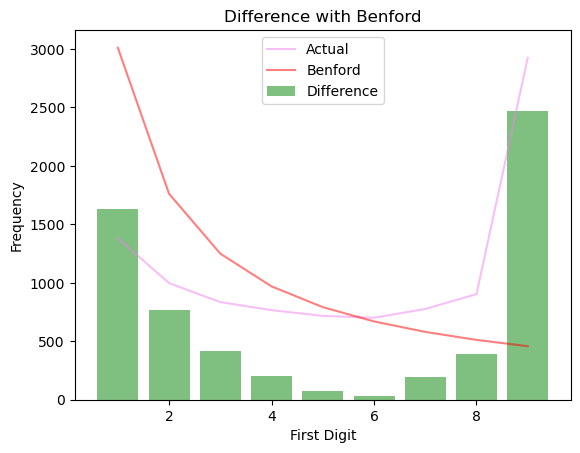

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9743149302629346, P-Value: 0.0
        R-squared: 0.9493


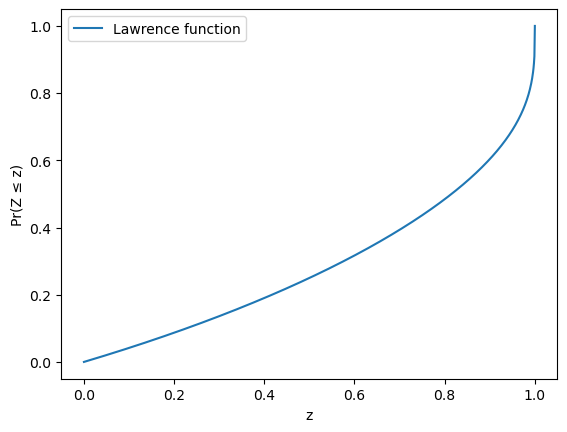

Distribution:


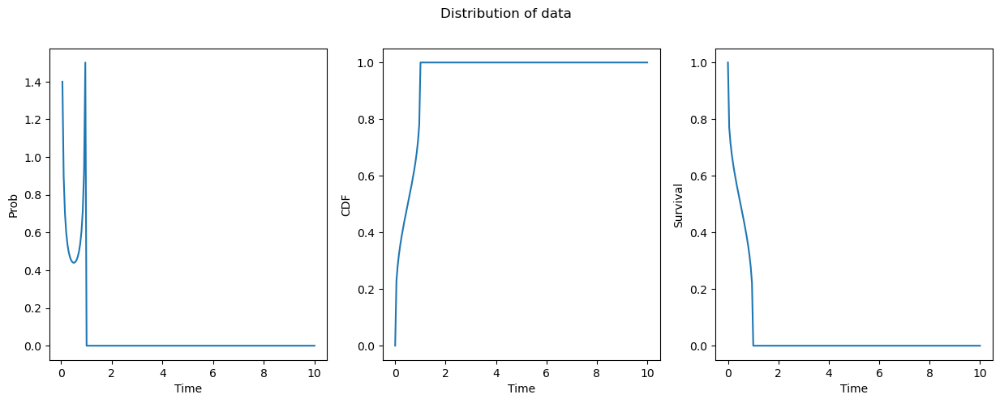

Lorenz Curve:


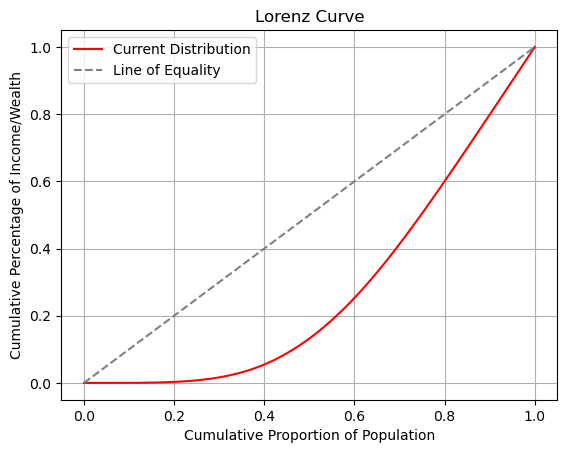

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0003
        Pearson Coefficient: 0.0187
        Slope (Regression): [0.01187617]


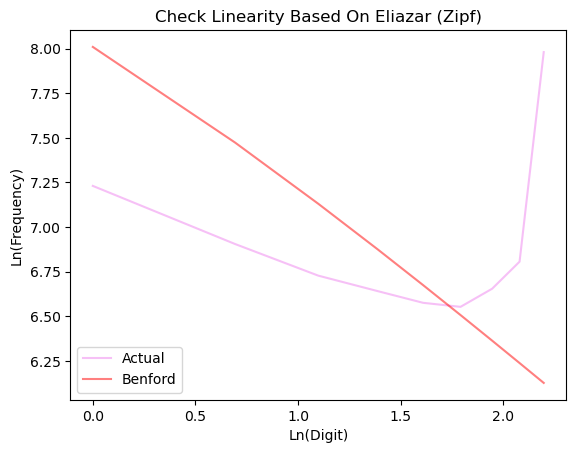

Scaled TTT:


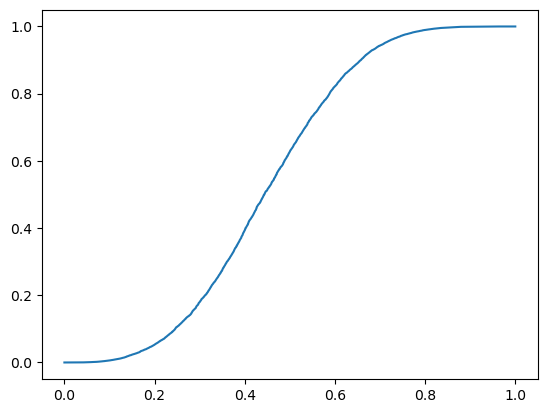

   Check t*h(t):
        Slope (Regression): [3.12923626]
        Estimated value for p (denoted in eliazar): 0.863617165495388


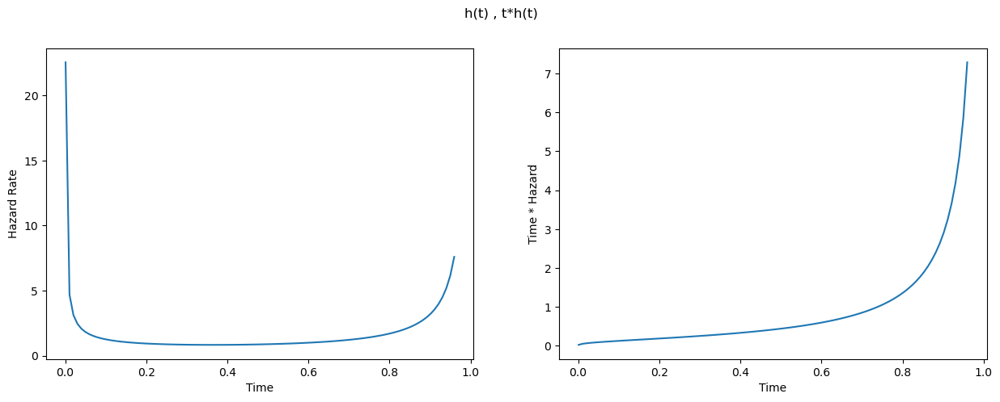

In [48]:
beta_rv = beta(a=1, b=1)
data = beta_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(beta_rv)
analyzer.report()
la = LindyAnalyzer(beta_rv)
la.show_hazard_rate(0, 5, LINDY_PRECISION)

beta_rv = beta(a=0.3, b=0.3)
data = beta_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(beta_rv)
analyzer.report()
la = LindyAnalyzer(beta_rv)
la.show_hazard_rate(0, 5, LINDY_PRECISION)


#### - Triangular

Statistical Tests:
    Chi2 Statistic: 5603.431830481126, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.5603431830481126, m: 0.2400299956639812
    MAD Statistic: 0.07510638784007502
    MAD result: None
    KS Statistic: 0.3187 KS P-Value: 1e-323
    Pearson Statistic: -0.15975873288635048 Pearson P-Value: 0.6813850975171821
    J-Divergence: 0.9579448174699531
Benford Check:


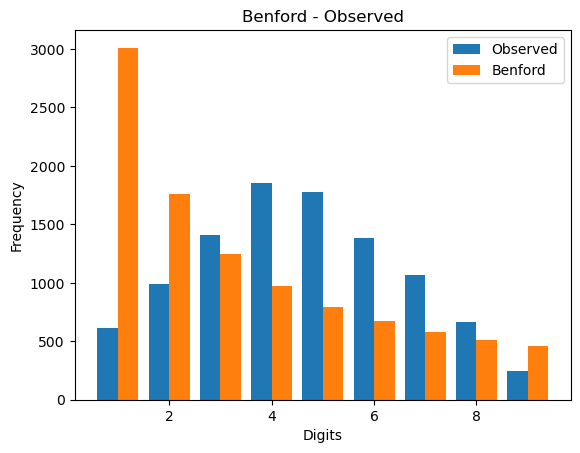

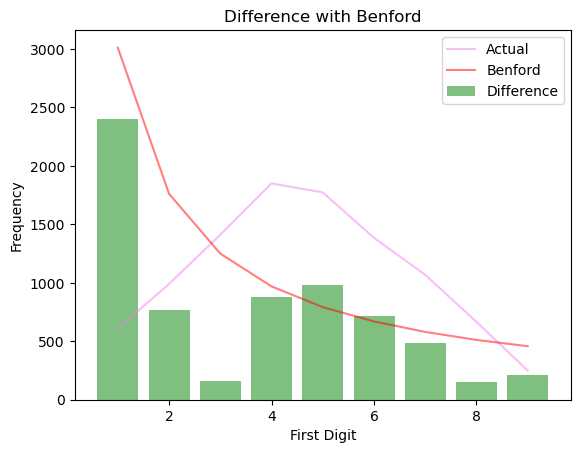

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9409639410954862, P-Value: 0.0
        R-squared: 0.8854


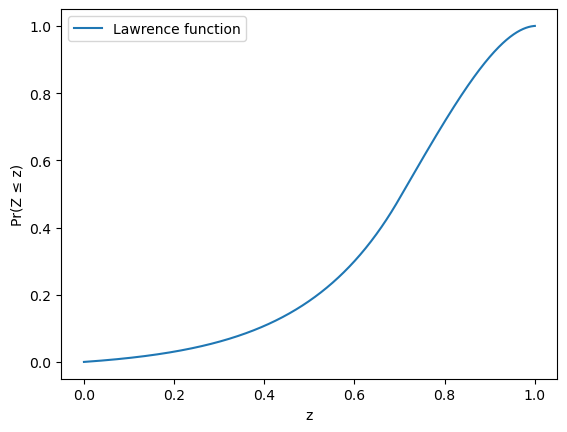

Distribution:


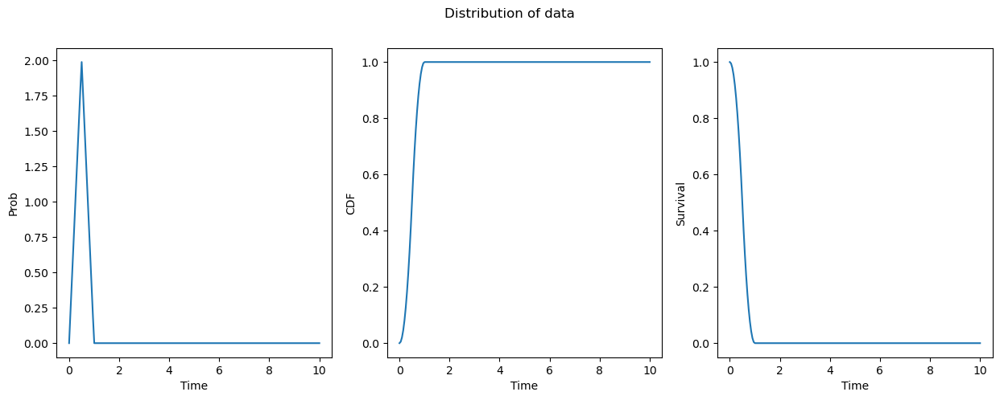

Lorenz Curve:


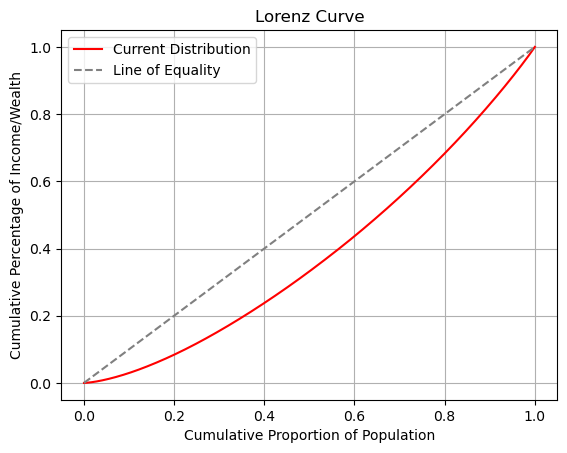

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0190
        Pearson Coefficient: -0.1380
        Slope (Regression): [-0.12249544]


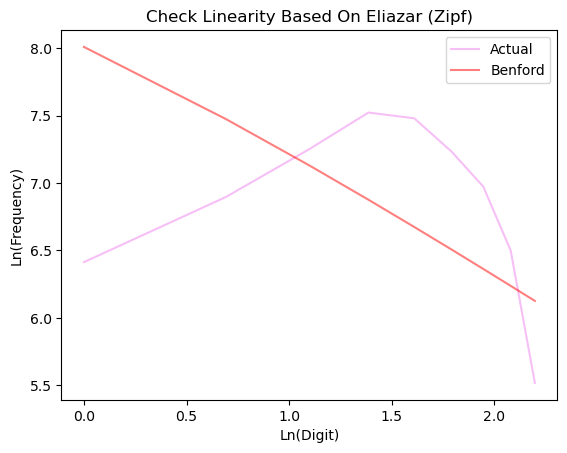

Scaled TTT:


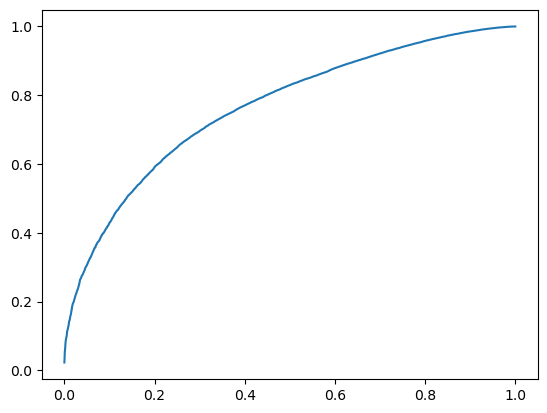

   Check t*h(t):
        Slope (Regression): [49.69320895]
        Estimated value for p (denoted in eliazar): 10.012058782614728


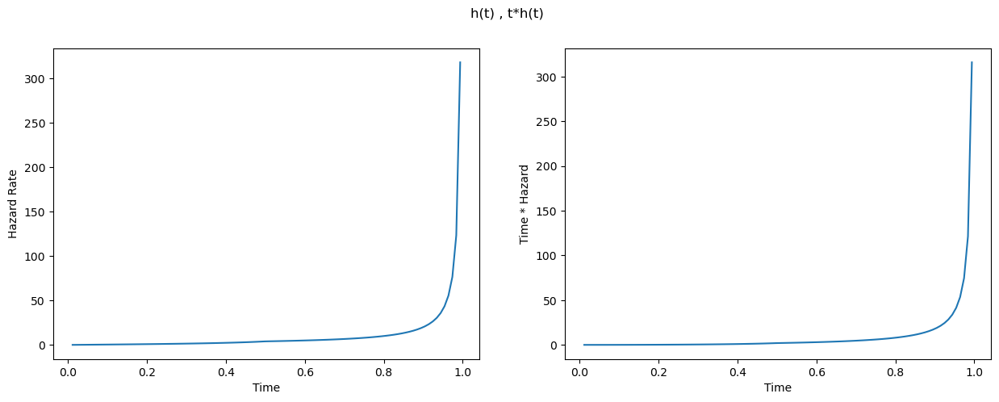

Statistical Tests:
    Chi2 Statistic: 828.7008984865032, Chi2 P-Value: 1.3396356213252464e-173
    Lawrence Statistics-> c: 0.0828700898486503, m: 0.1054299956639812
    MAD Statistic: 0.028661943395630576
    MAD result: None
    KS Statistic: 0.1161 KS P-Value: 4.2883117996909605e-59
    Pearson Statistic: 0.8815087720888723 Pearson P-Value: 0.0016761681804451374
    J-Divergence: 0.12492414383533078
Benford Check:


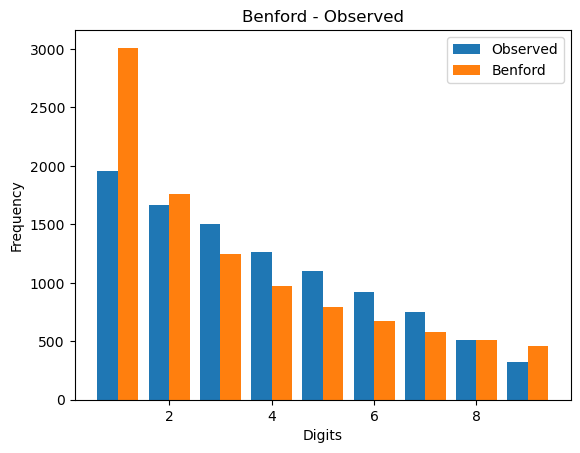

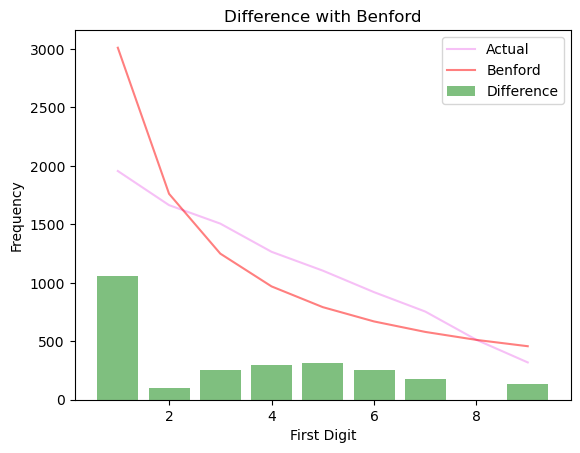

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9917444073255333, P-Value: 0.0
        R-squared: 0.9836


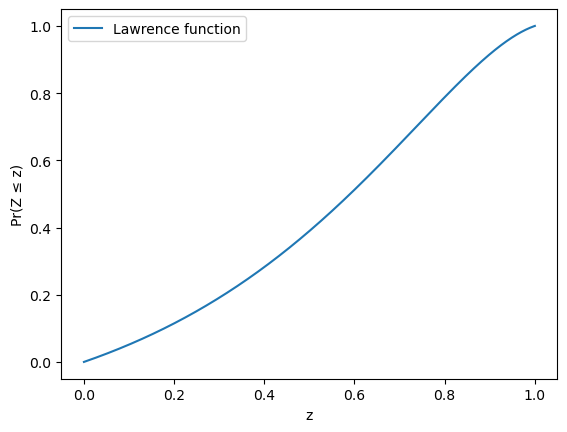

Distribution:


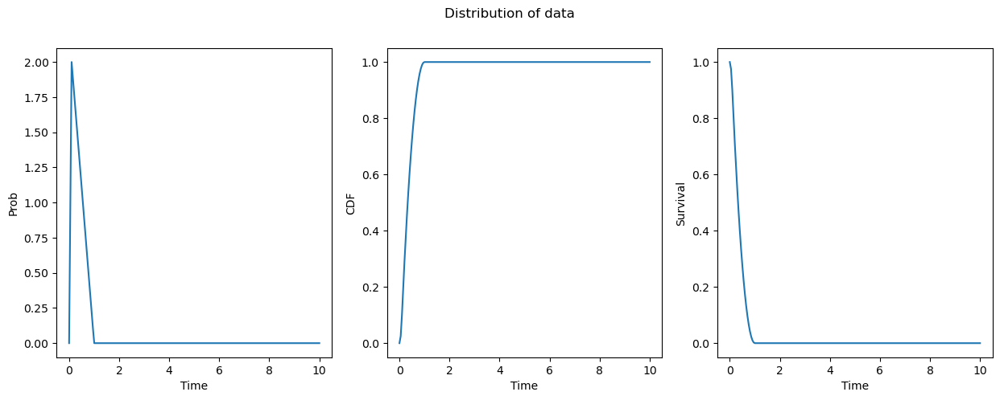

Lorenz Curve:


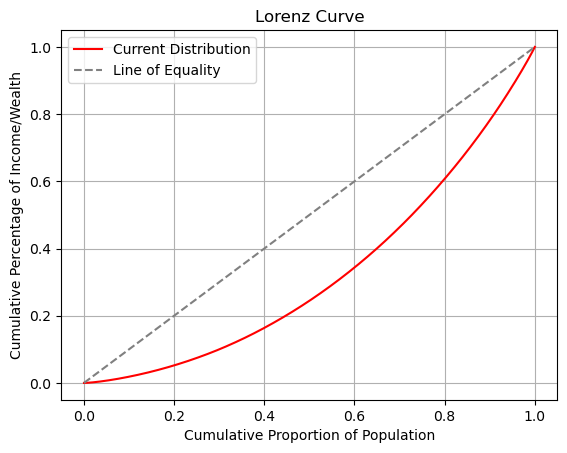

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.7587
        Pearson Coefficient: -0.8710
        Slope (Regression): [-0.71325358]


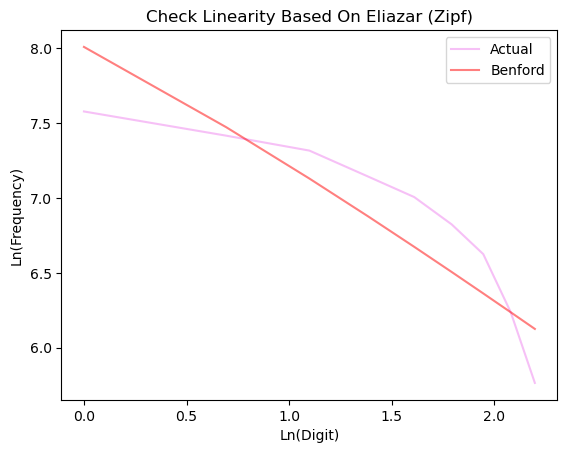

Scaled TTT:


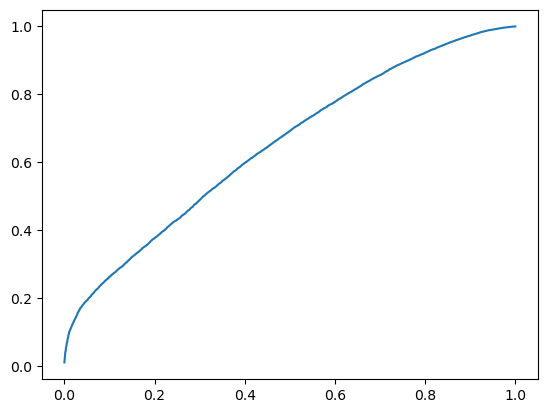

   Check t*h(t):
        Slope (Regression): [41.325851]
        Estimated value for p (denoted in eliazar): 8.787928314293849


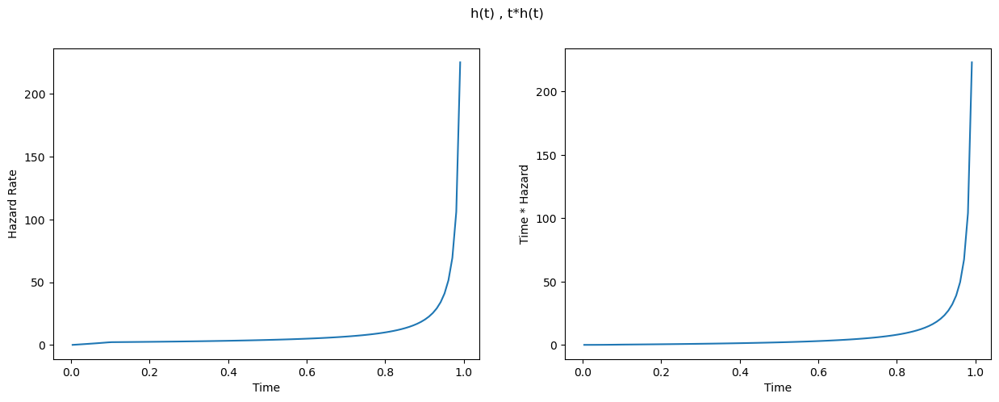

In [49]:
triang_rv = triang(c=0.5)
data = triang_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(triang_rv)
analyzer.report()
la = LindyAnalyzer(triang_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

triang_rv = triang(c=0.1)
data = triang_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(triang_rv)
analyzer.report()
la = LindyAnalyzer(triang_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

#### - Loggamma

Statistical Tests:
    Chi2 Statistic: 128.10967200551613, Chi2 P-Value: 6.971666313823107e-24
    Lawrence Statistics-> c: 0.012810967200551615, m: 0.027570004336018805
    MAD Statistic: 0.011560278826591646
    MAD result: None
    KS Statistic: 0.0285 KS P-Value: 0.0005931599389177483
    Pearson Statistic: 0.985624728912795 Pearson P-Value: 1.1563993104665814e-06
    J-Divergence: 0.01868493992271031
Benford Check:


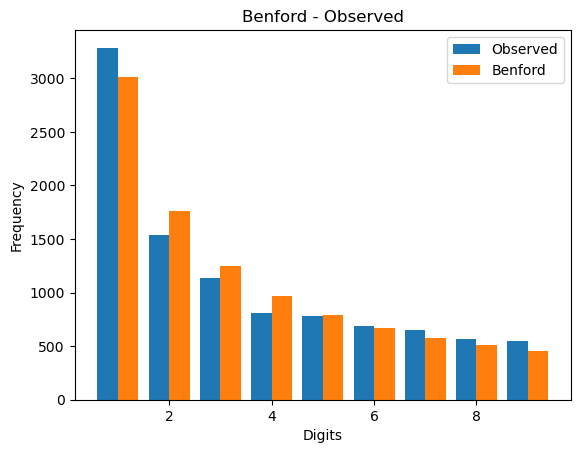

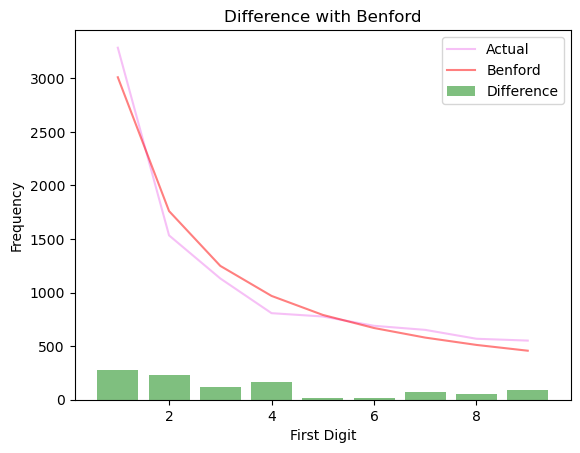

Lawrence Check:


/Users/treant/anaconda3/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:5504: RuntimeWarning: overflow encountered in exp
  return sc.gammainc(c, np.exp(x))


    Linearity Check:
        Pearson Coefficient: 0.9902115849421613, P-Value: 0.0
        R-squared: 0.9805


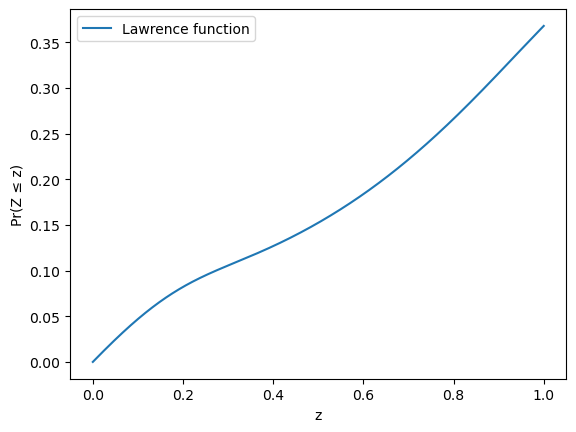

Distribution:


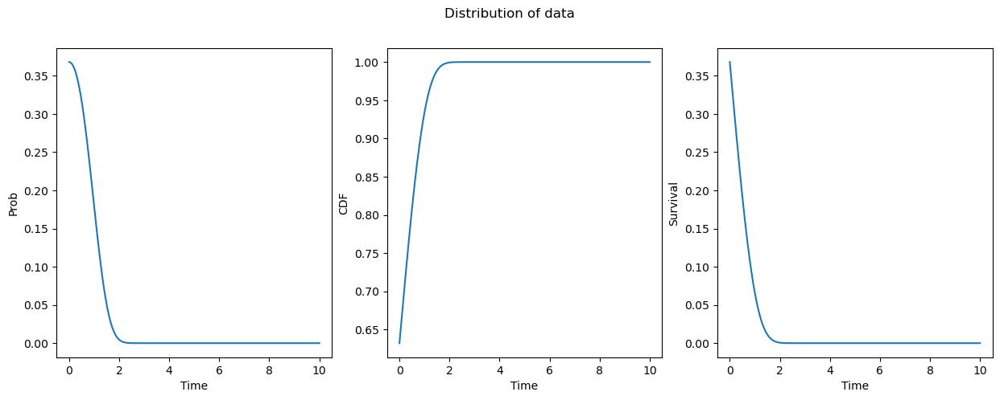

Lorenz Curve:


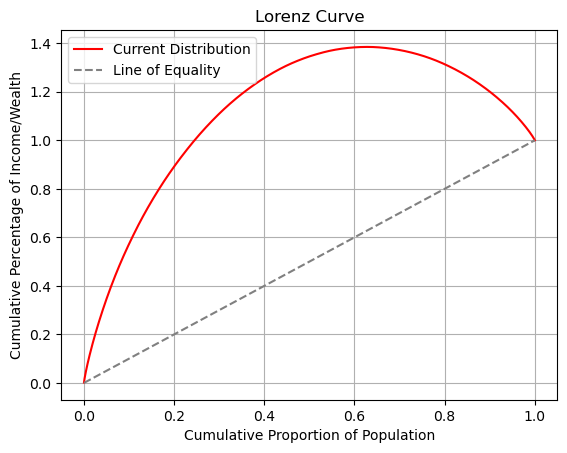

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9736
        Pearson Coefficient: -0.9867
        Slope (Regression): [-0.79148112]


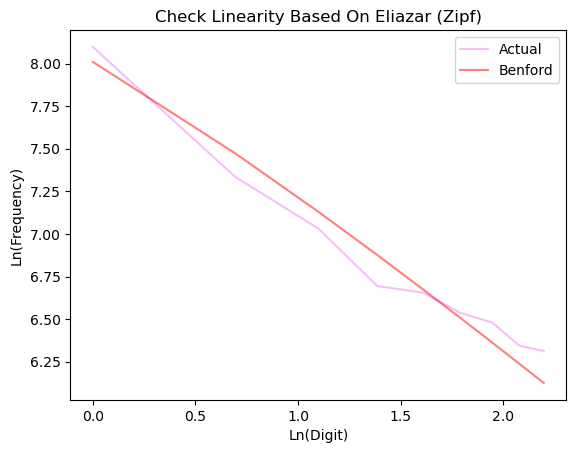

Scaled TTT:


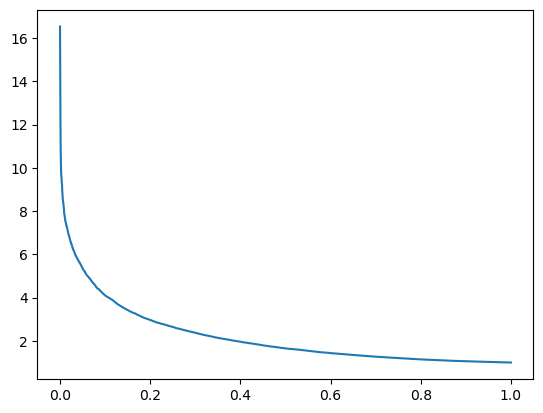

   Check t*h(t):
        Slope (Regression): [0.51159375]
        Estimated value for p (denoted in eliazar): 1.0586832828827997


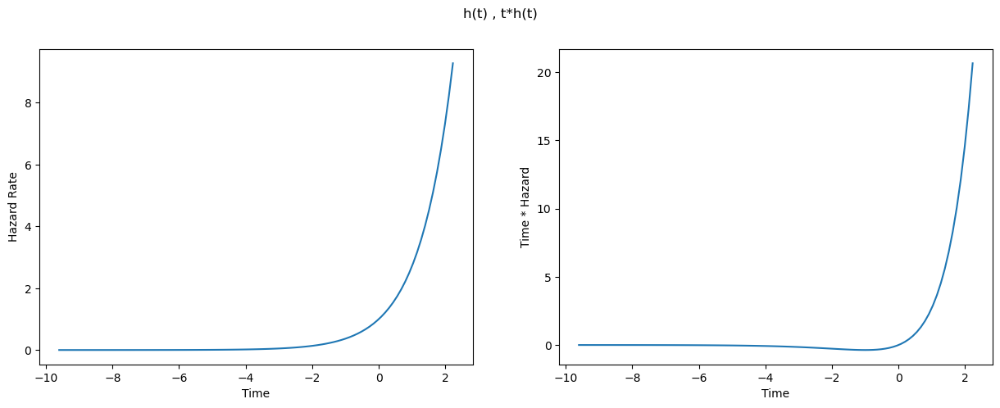

Statistical Tests:
    Chi2 Statistic: 159.33509442182924, Chi2 P-Value: 2.2027793315827504e-30
    Lawrence Statistics-> c: 0.015933509442182924, m: 0.04982999566398122
    MAD Statistic: 0.012608890816008364
    MAD result: None
    KS Statistic: 0.052 KS P-Value: 3.5727044438965934e-12
    Pearson Statistic: 0.9781652938683848 Pearson P-Value: 4.9578939146648024e-06
    J-Divergence: 0.02344717244083302
Benford Check:


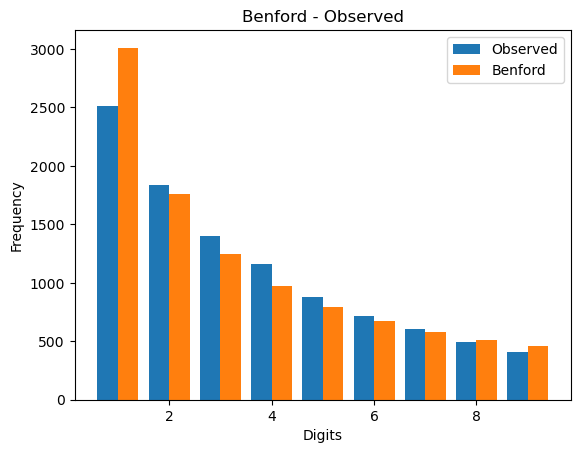

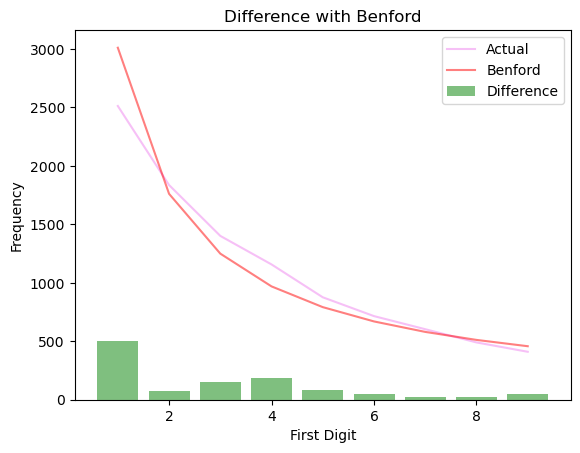

Lawrence Check:


/Users/treant/anaconda3/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:5504: RuntimeWarning: overflow encountered in exp
  return sc.gammainc(c, np.exp(x))


    Linearity Check:
        Pearson Coefficient: 0.9928410725746288, P-Value: 0.0
        R-squared: 0.9857


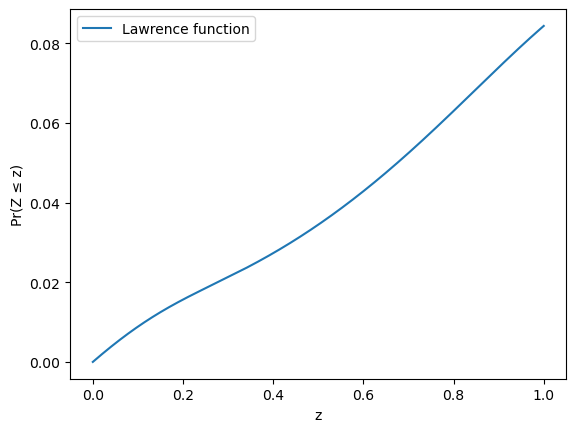

Distribution:


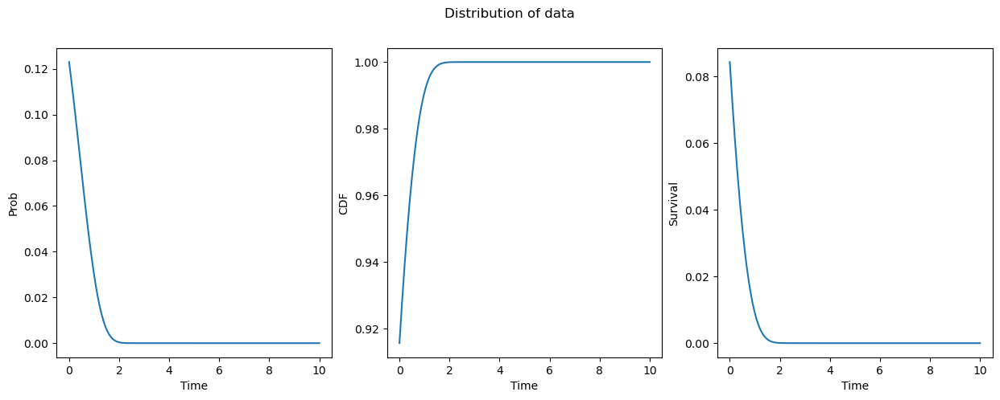

Lorenz Curve:


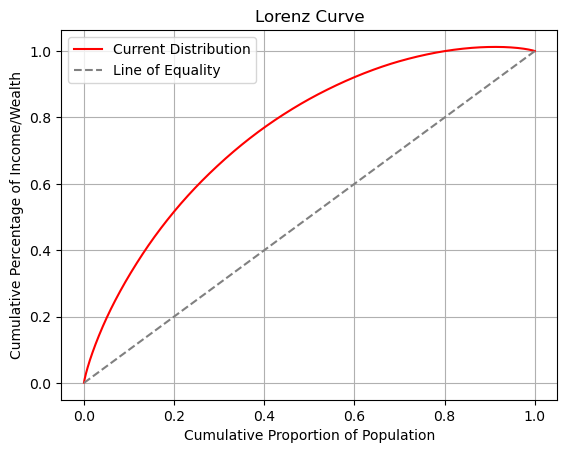

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9514
        Pearson Coefficient: -0.9754
        Slope (Regression): [-0.83134092]


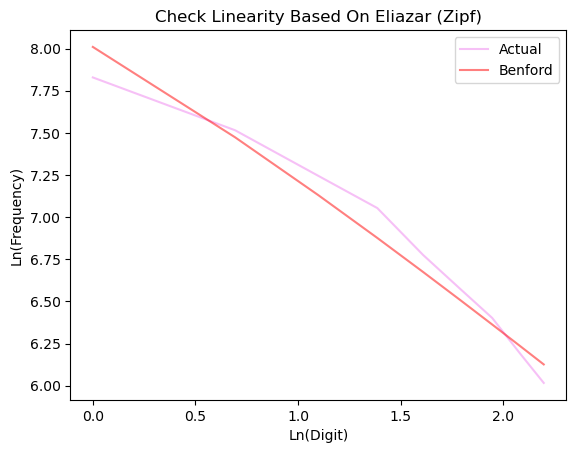

Scaled TTT:


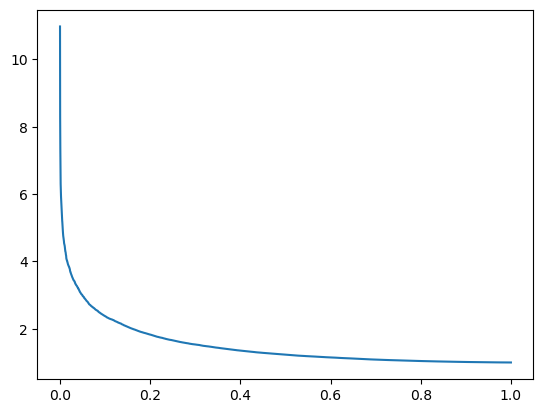

   Check t*h(t):
        Slope (Regression): [0.04453135]
        Estimated value for p (denoted in eliazar): 0.24935389785514717


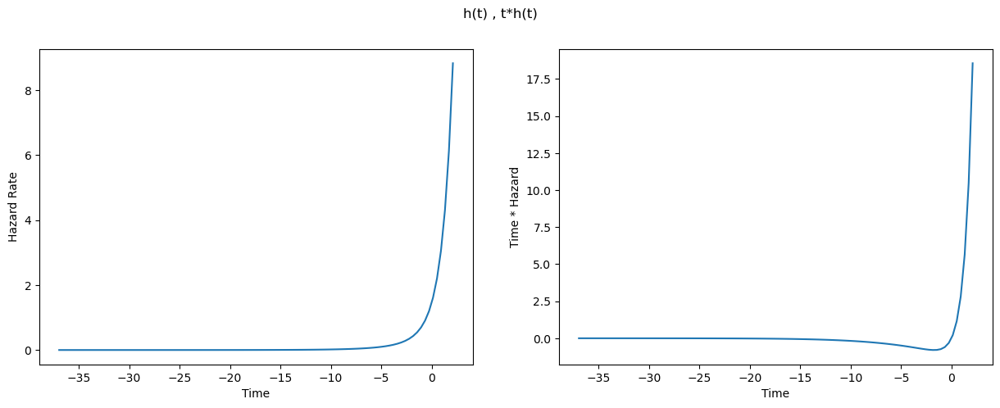

In [50]:
loggamma_rv = loggamma(c=1)
data = loggamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(loggamma_rv)
analyzer.report()
analyzer.set_dist_of_data(loggamma_rv)
la = LindyAnalyzer(loggamma_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

loggamma_rv = loggamma(c=0.3)
data = loggamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(loggamma_rv)
analyzer.report()
la = LindyAnalyzer(loggamma_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

#### - Pareto

Statistical Tests:
    Chi2 Statistic: 6863.035398769705, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.6863035398769706, m: 0.36467000433601876
    MAD Statistic: 0.08103777874133751
    MAD result: None
    KS Statistic: 0.3742 KS P-Value: 0.0
    Pearson Statistic: 0.9528393226123381 Pearson P-Value: 7.161176666911645e-05
    J-Divergence: 1.07177527543381
Benford Check:


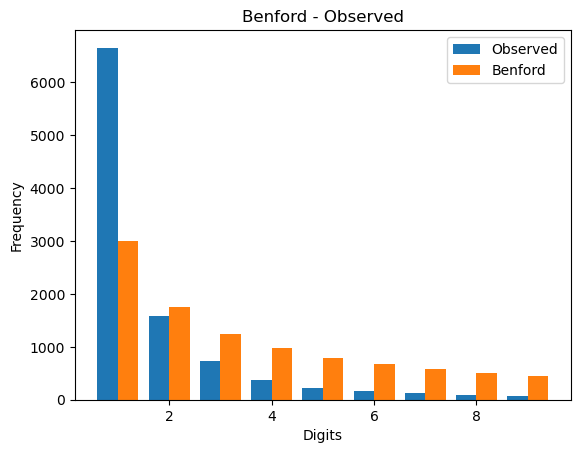

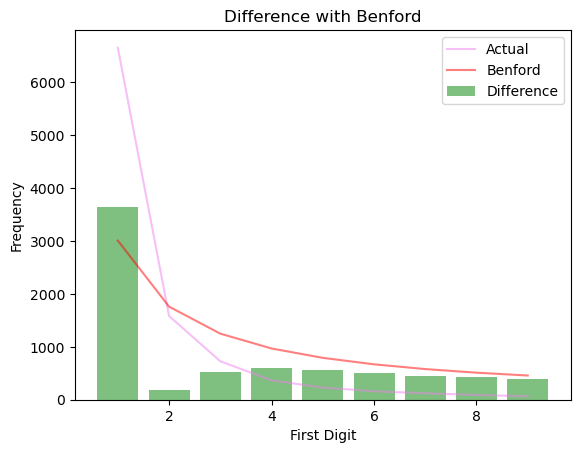

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9189463826519, P-Value: 0.0
        R-squared: 0.8445


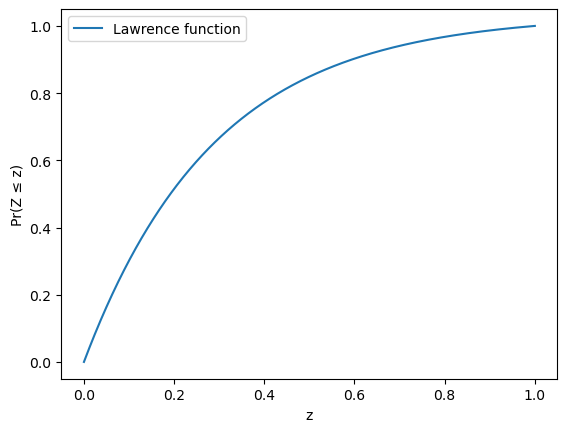

Distribution:


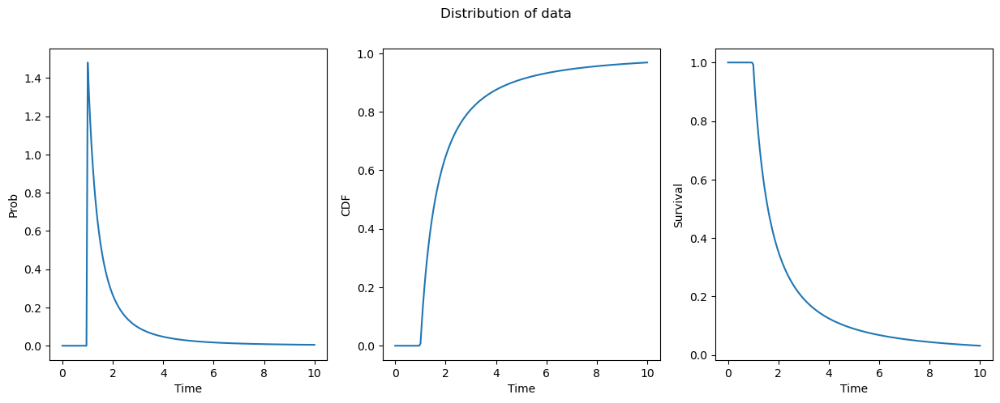

Lorenz Curve:


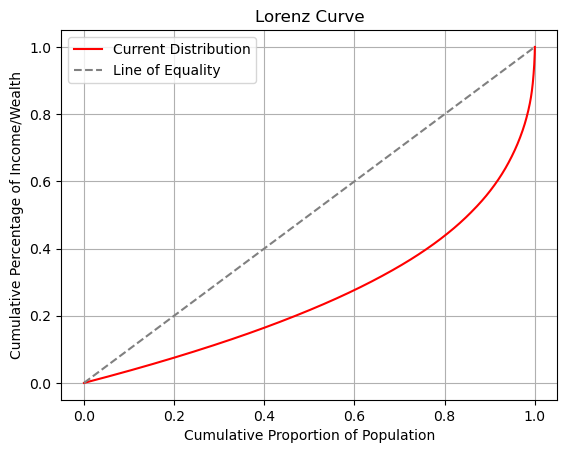

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9991
        Pearson Coefficient: -0.9995
        Slope (Regression): [-2.09295197]


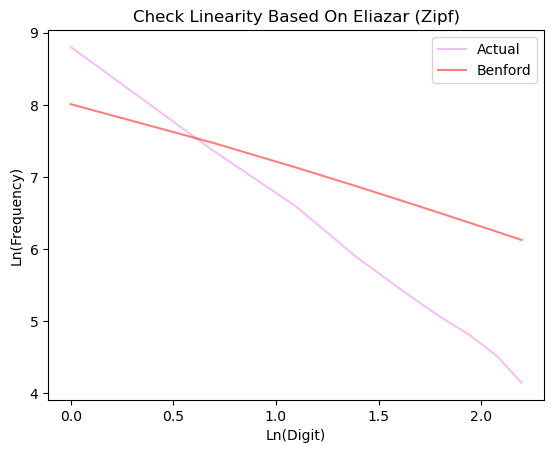

Scaled TTT:


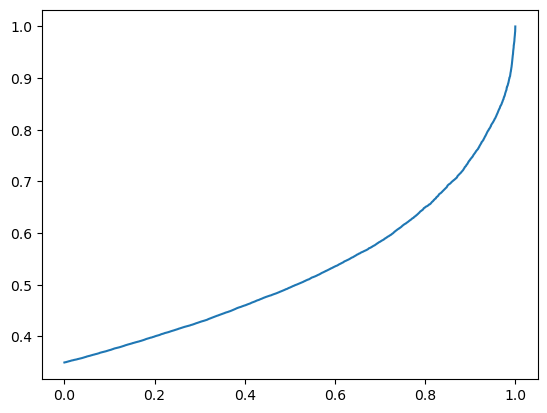

   Check t*h(t):
        Slope (Regression): [0.08020604]
        Estimated value for p (denoted in eliazar): 1.35


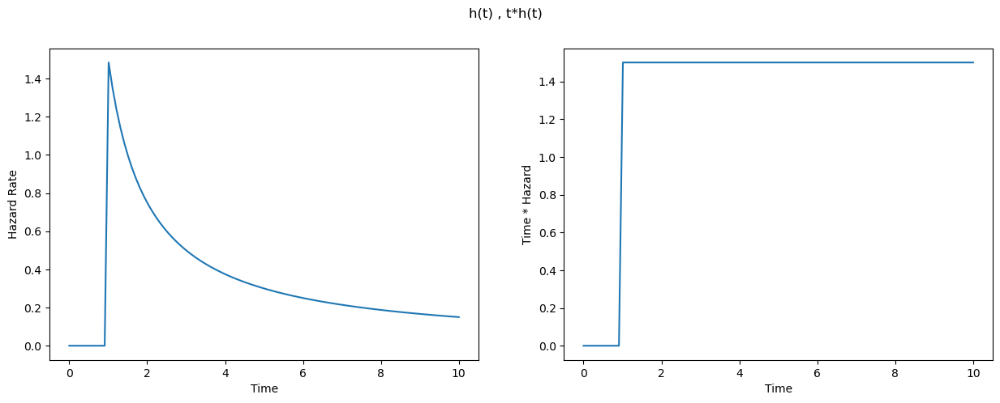

Statistical Tests:
    Chi2 Statistic: 100.60101289575235, Chi2 P-Value: 3.217233108034701e-18
    Lawrence Statistics-> c: 0.010060101289575244, m: 0.02987000433601883
    MAD Statistic: 0.00995083228451946
    MAD result: None
    KS Statistic: 0.0421 KS P-Value: 3.996326012053762e-08
    Pearson Statistic: 0.9996642492792215 Pearson P-Value: 2.282730340132238e-12
    J-Divergence: 0.014999759480369445
Benford Check:


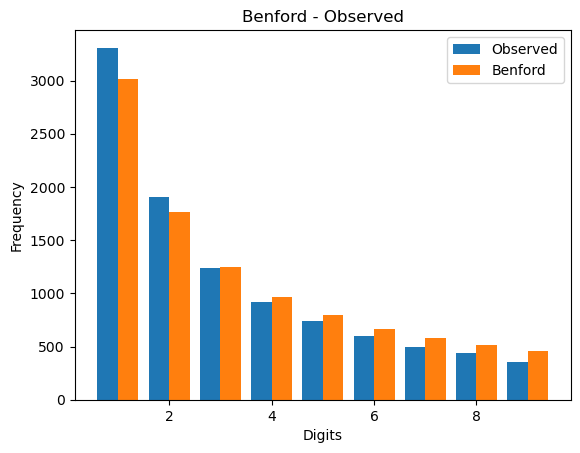

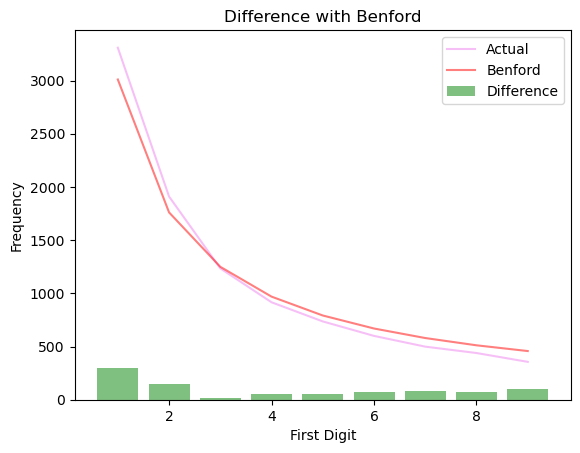

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9995577533933138, P-Value: 0.0
        R-squared: 0.9991


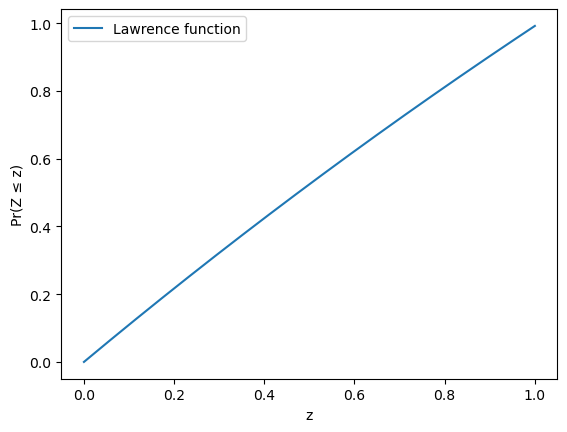

Distribution:


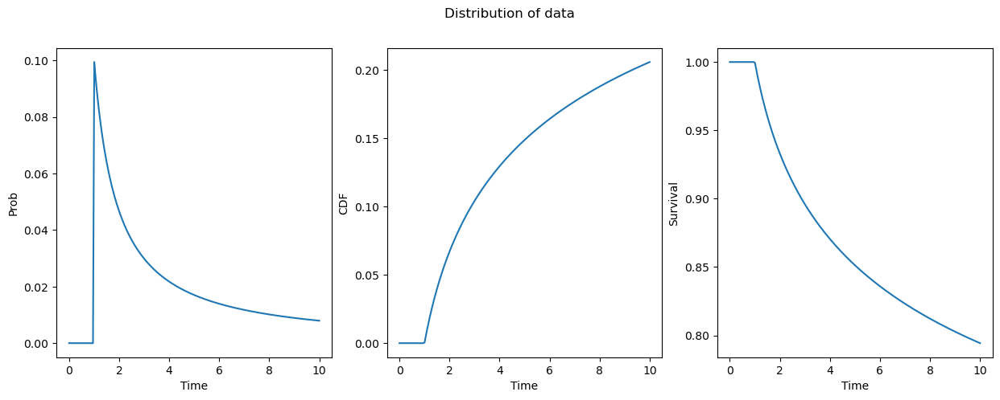

Lorenz Curve:


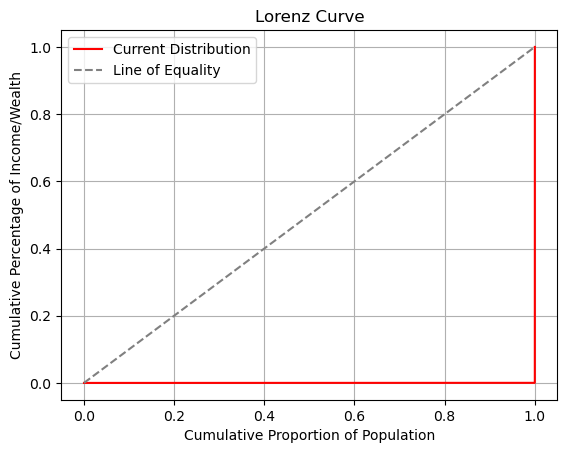

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9942
        Pearson Coefficient: -0.9971
        Slope (Regression): [-1.01245469]


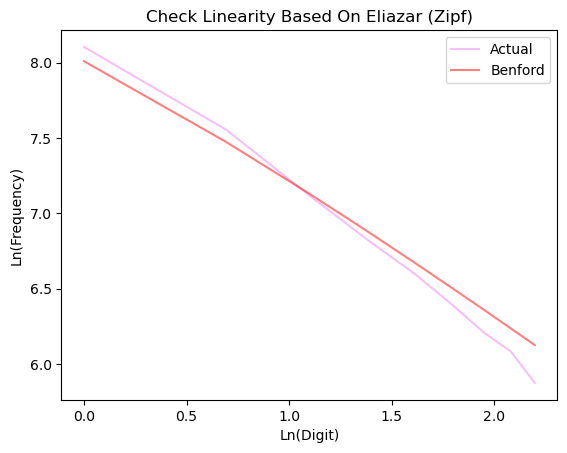

Scaled TTT:


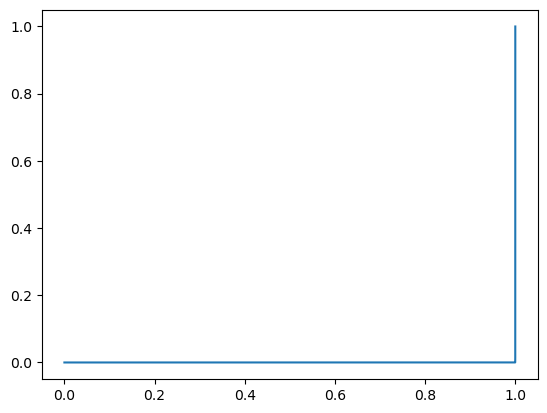

   Check t*h(t):
        Slope (Regression): [0.00534707]
        Estimated value for p (denoted in eliazar): 0.08999999999999997


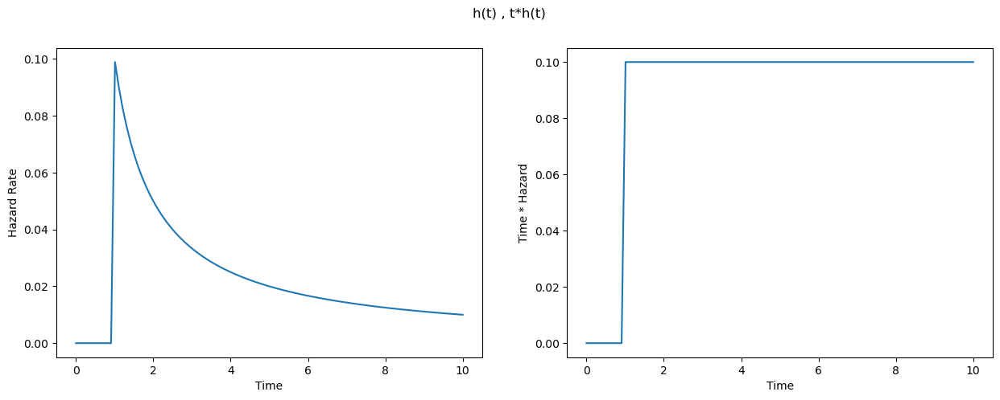

In [51]:
pareto_rv = pareto(b = 1.5)
data = pareto_rv.rvs(size = SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(pareto_rv)
analyzer.report()
la = LindyAnalyzer(pareto_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

pareto_rv = pareto(b = 0.1)
data = pareto_rv.rvs(size = SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(pareto_rv)
analyzer.report()
la = LindyAnalyzer(pareto_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)


#### - Burr

Statistical Tests:
    Chi2 Statistic: 10.359013583623193, Chi2 P-Value: 0.24072633474373728
    Lawrence Statistics-> c: 0.0010359013583623202, m: 0.006738736608299933
    MAD Statistic: 0.0029644463715639124
    MAD result: None
    KS Statistic: 0.0081 KS P-Value: 0.898195296299018
    Pearson Statistic: 0.9991328777522536 Pearson P-Value: 6.316143889181185e-11
    J-Divergence: 0.001511780970492791
Benford Check:


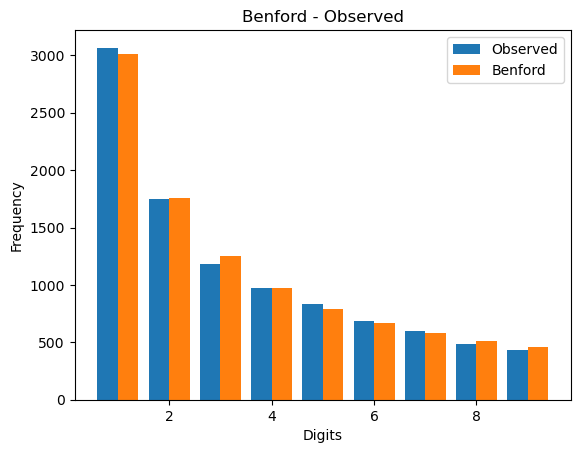

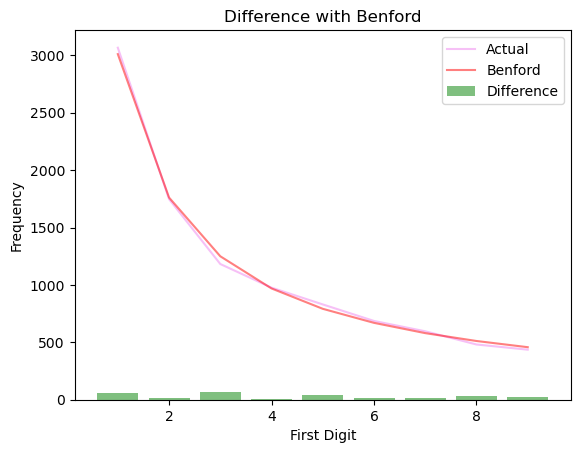

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999987390969097, P-Value: 0.0
        R-squared: 1.0000


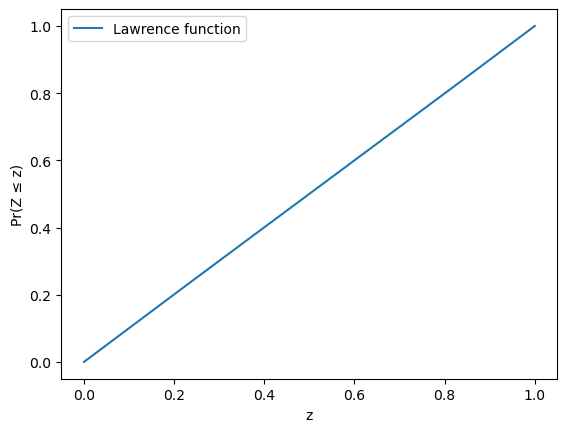

Distribution:


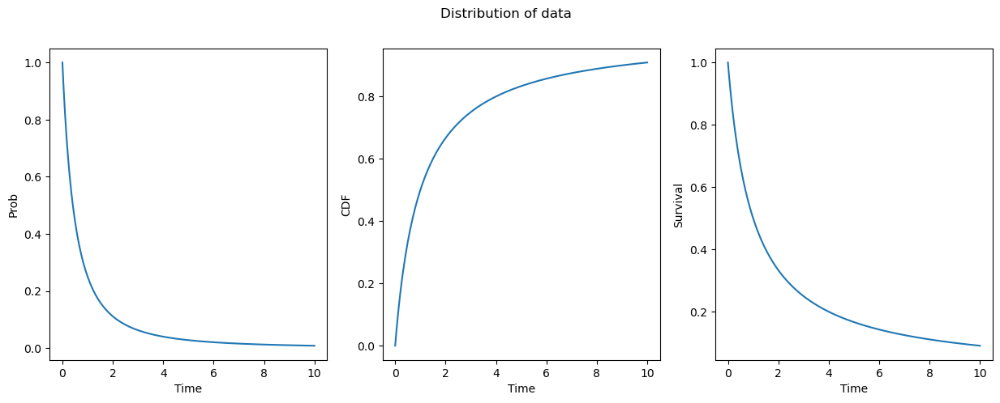

Lorenz Curve:


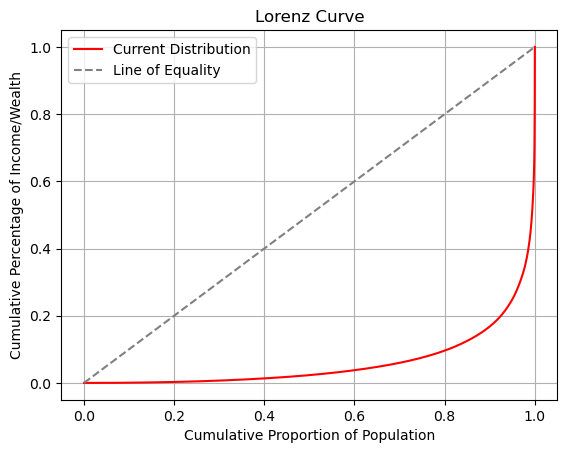

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9943
        Pearson Coefficient: -0.9971
        Slope (Regression): [-0.87533777]


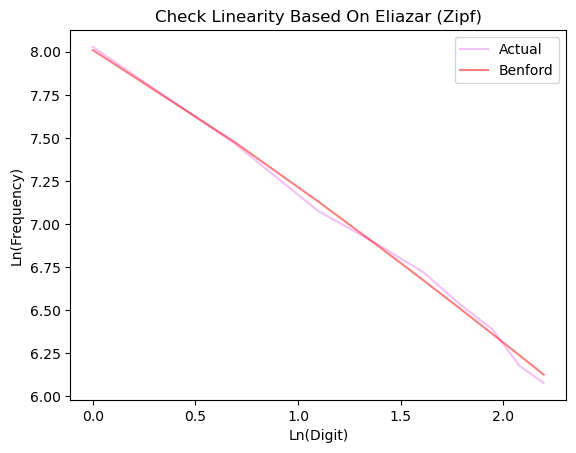

Scaled TTT:


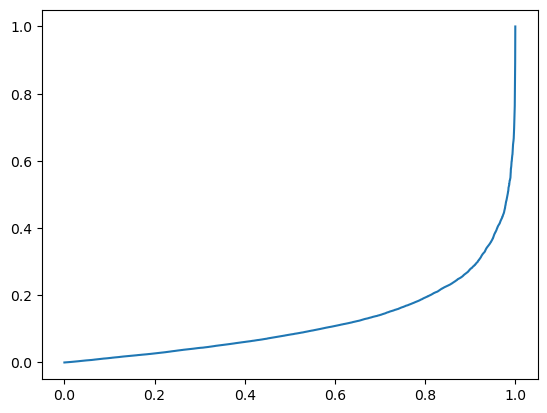

   Check t*h(t):
        Slope (Regression): [0.05379028]
        Estimated value for p (denoted in eliazar): 0.7571508185416178


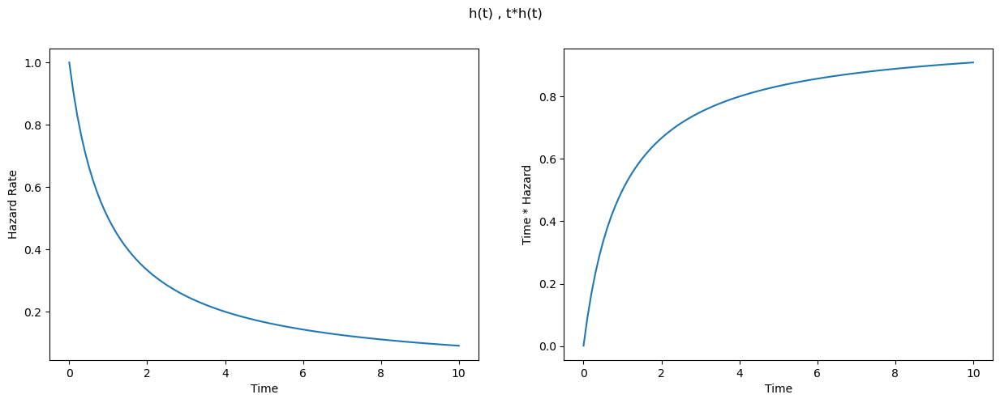

Statistical Tests:
    Chi2 Statistic: 10.61125286971944, Chi2 P-Value: 0.22471355077391908
    Lawrence Statistics-> c: 0.0010611252869719462, m: 0.011370004336018813
    MAD Statistic: 0.0032765086362946585
    MAD result: None
    KS Statistic: 0.0192 KS P-Value: 0.05012122567386552
    Pearson Statistic: 0.9987277249865187 Pearson P-Value: 2.415645621701273e-10
    J-Divergence: 0.0015365835104015262
Benford Check:


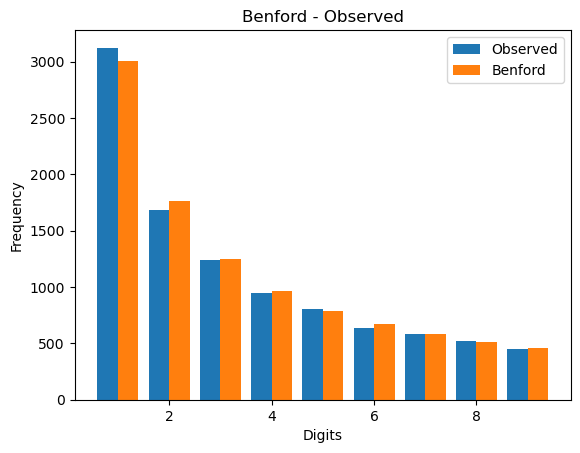

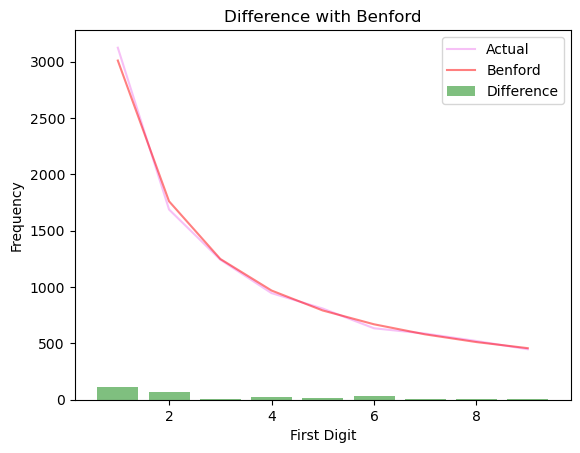

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999999071701045, P-Value: 0.0
        R-squared: 1.0000


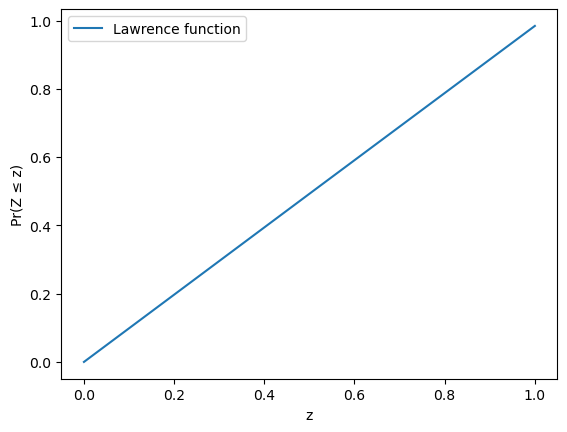

Distribution:


/Users/treant/anaconda3/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:1013: RuntimeWarning: divide by zero encountered in power
  lambda x_, c_, d_: c_ * d_ * (x_**(c_*d_-1)) / (1 + x_**c_),


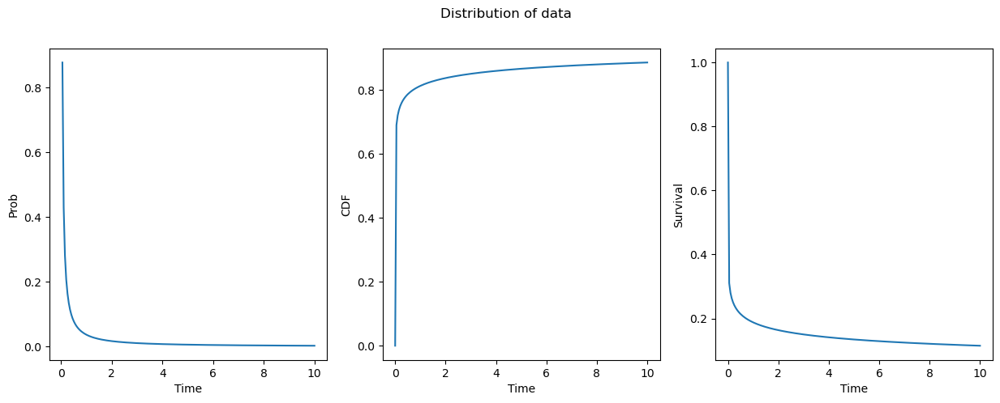

Lorenz Curve:


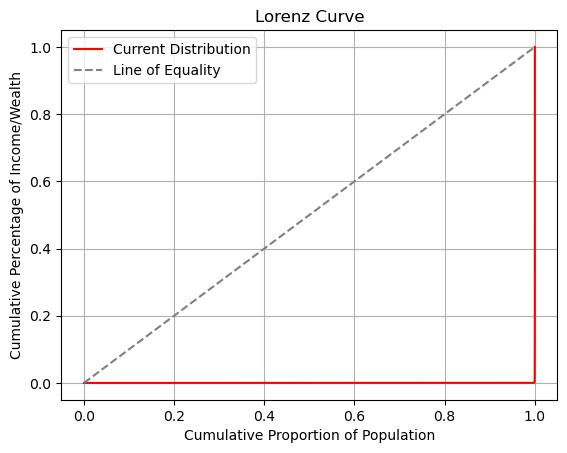

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9979
        Pearson Coefficient: -0.9990
        Slope (Regression): [-0.87174229]


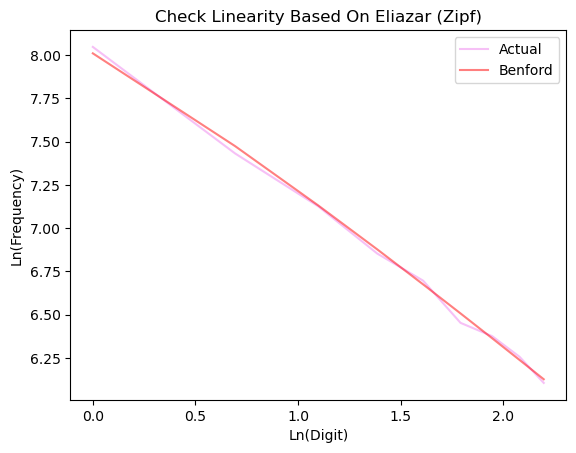

Scaled TTT:


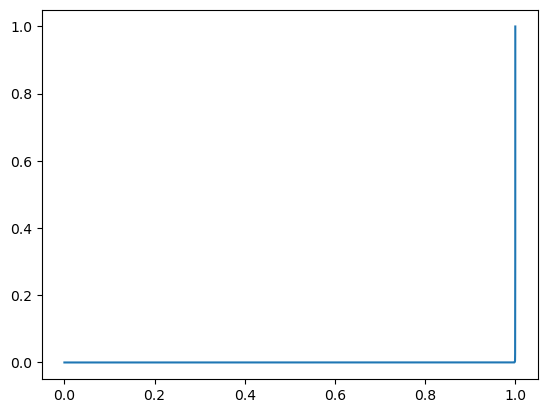

   Check t*h(t):
        Slope (Regression): [0.00529467]
        Estimated value for p (denoted in eliazar): 0.2153021603761339


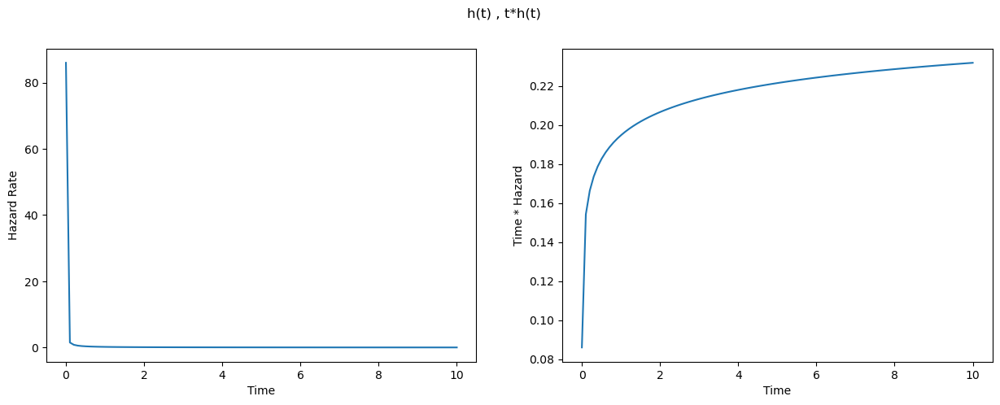

In [52]:
burr_rv = burr(c=1, d=1)
data = burr_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(burr_rv)
analyzer.report()
la = LindyAnalyzer(burr_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)


burr_rv = burr(c=0.3, d=0.3)
data = burr_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(burr_rv)
analyzer.report()
la = LindyAnalyzer(burr_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)


#### - Inverse Gamma

Statistical Tests:
    Chi2 Statistic: 55.67057565463635, Chi2 P-Value: 3.269715371809347e-09
    Lawrence Statistics-> c: 0.005567057565463636, m: 0.019591259055681237
    MAD Statistic: 0.0065399990364402635
    MAD result: None
    KS Statistic: 0.0315 KS P-Value: 9.800441299350962e-05
    Pearson Statistic: 0.9946083298136792 Pearson P-Value: 3.769553637915507e-08
    J-Divergence: 0.00807729480333074
Benford Check:


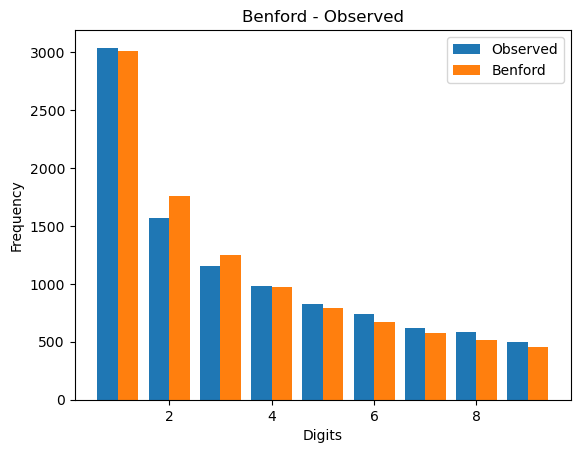

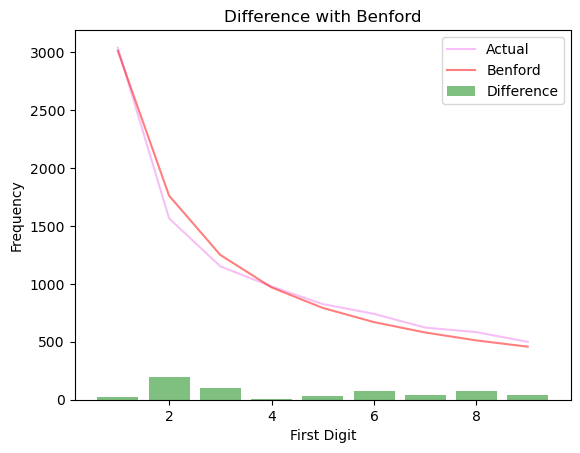

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9992911002602028, P-Value: 0.0
        R-squared: 0.9986


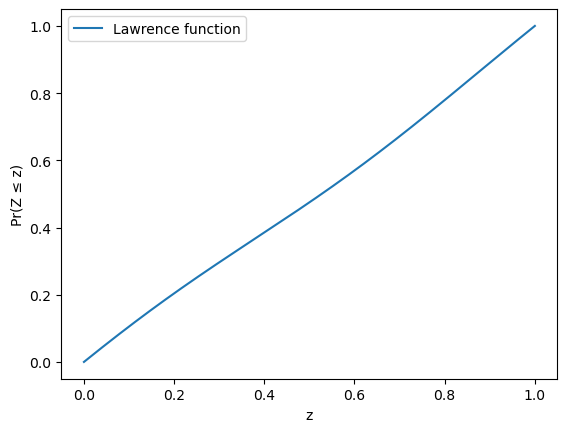

Distribution:


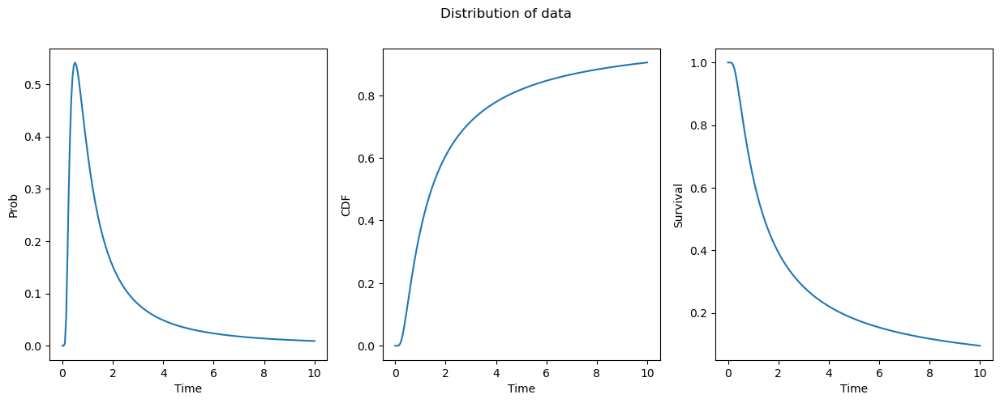

Lorenz Curve:


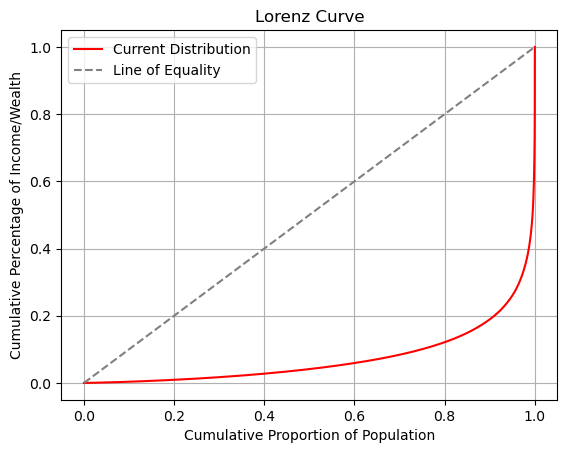

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9942
        Pearson Coefficient: -0.9971
        Slope (Regression): [-0.78280832]


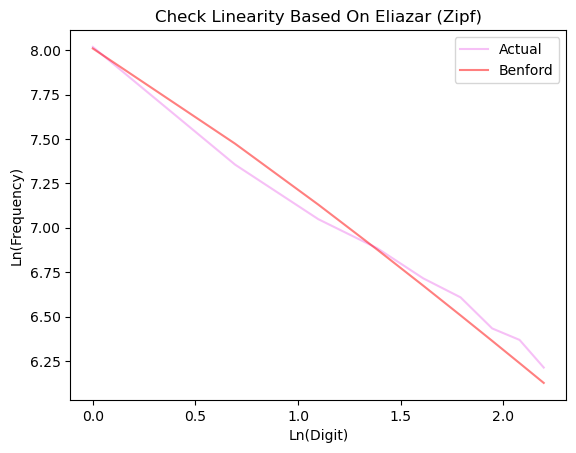

Scaled TTT:


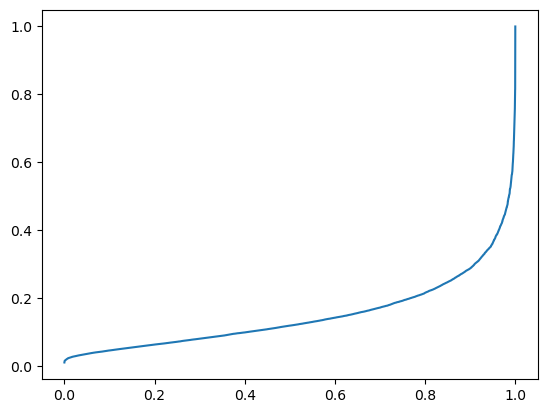

   Check t*h(t):
        Slope (Regression): [0.00144011]
        Estimated value for p (denoted in eliazar): 0.9656990295374875


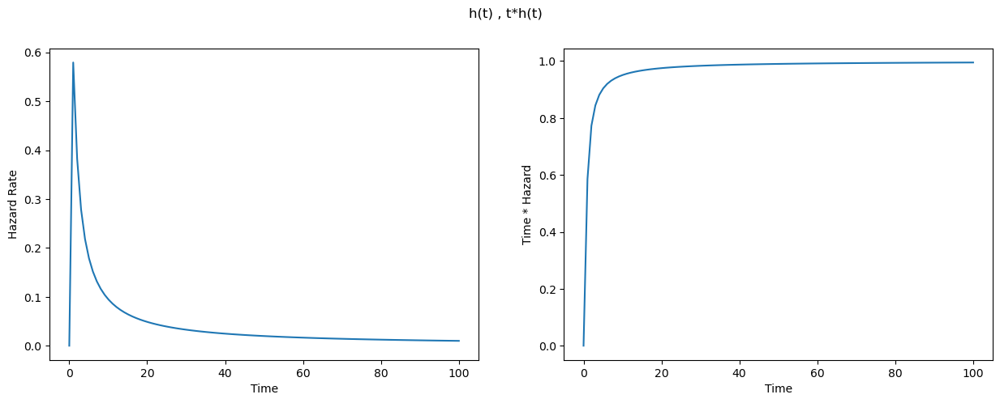

Statistical Tests:
    Chi2 Statistic: 10.361092707351537, Chi2 P-Value: 0.2405908039142562
    Lawrence Statistics-> c: 0.0010361092707351551, m: 0.007338736608299937
    MAD Statistic: 0.0027094513598708656
    MAD result: None
    KS Statistic: 0.0115 KS P-Value: 0.5228883388356883
    Pearson Statistic: 0.9990639028469154 Pearson P-Value: 8.255910310898277e-11
    J-Divergence: 0.001501627470409878
Benford Check:


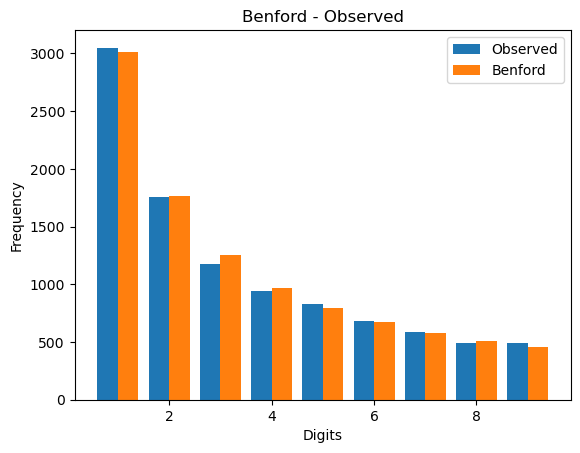

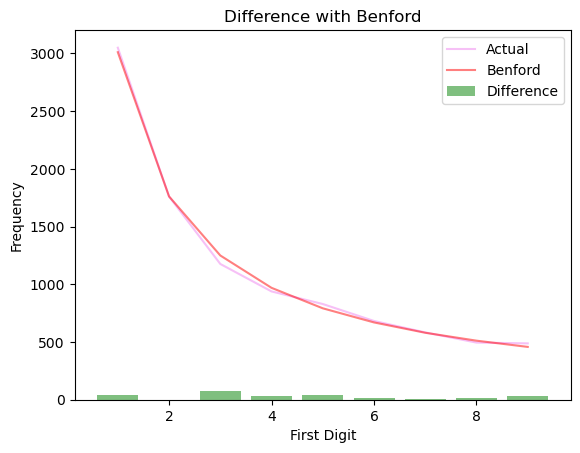

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.999987750076683, P-Value: 0.0
        R-squared: 1.0000


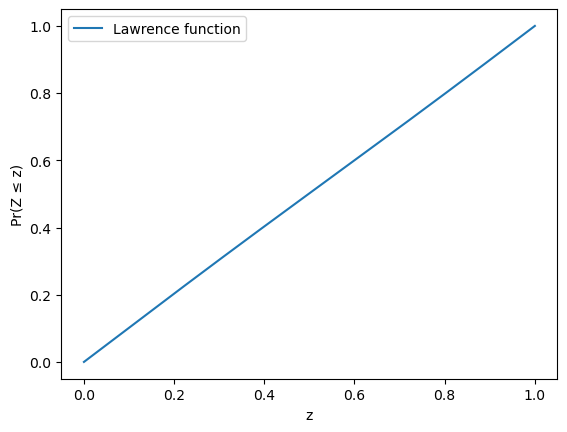

Distribution:


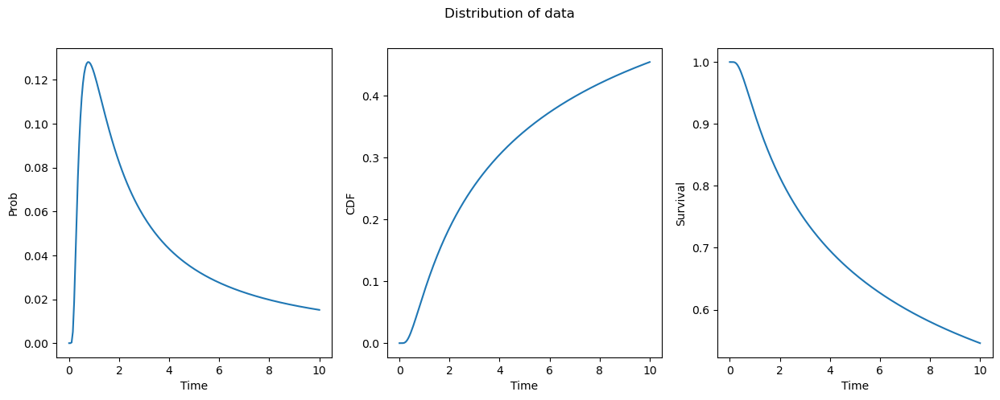

Lorenz Curve:


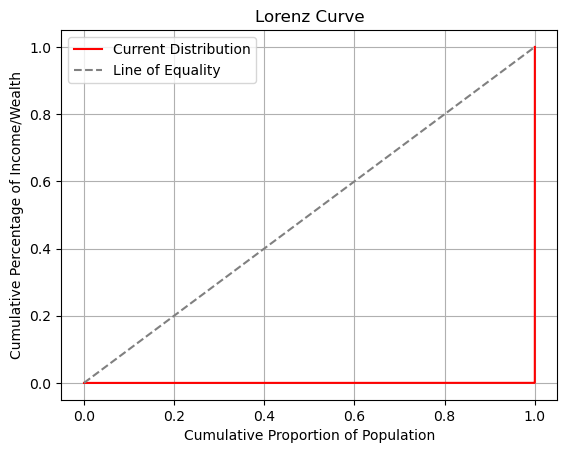

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9968
        Pearson Coefficient: -0.9984
        Slope (Regression): [-0.85170618]


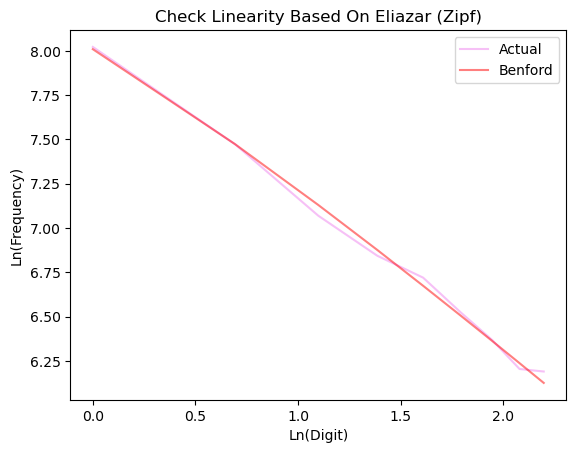

Scaled TTT:


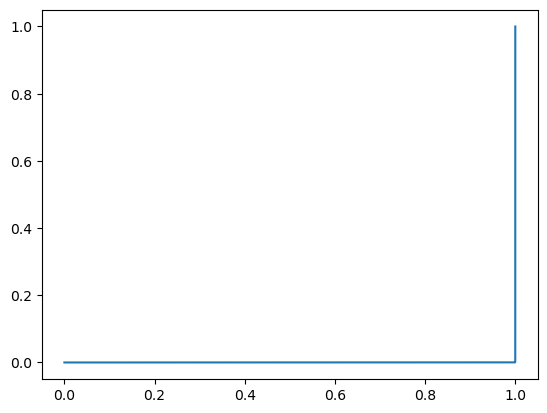

   Check t*h(t):
        Slope (Regression): [0.00054329]
        Estimated value for p (denoted in eliazar): 0.2862685189954099


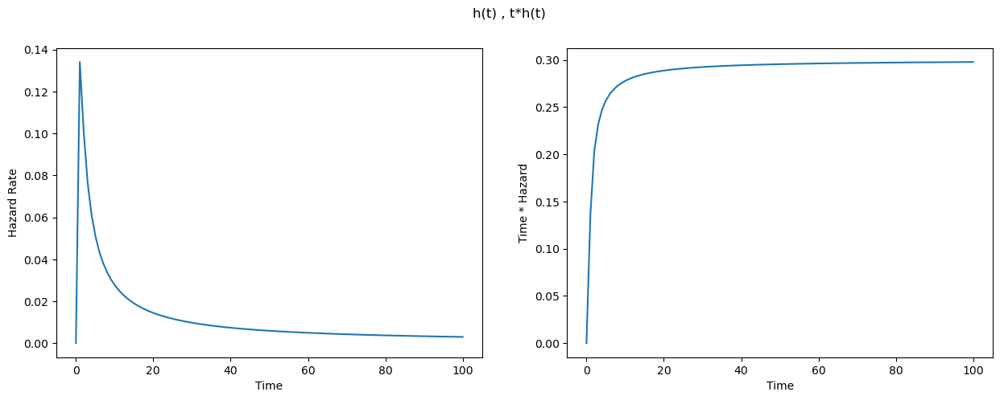

In [53]:
invgamma_rv = invgamma(a=1)
data = invgamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invgamma_rv)
analyzer.report()
la = LindyAnalyzer(invgamma_rv)
la.show_hazard_rate(0, 100, LINDY_PRECISION)

invgamma_rv = invgamma(a=0.3)
data = invgamma_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invgamma_rv)
analyzer.report()
la = LindyAnalyzer(invgamma_rv)
la.show_hazard_rate(0, 100, LINDY_PRECISION)

#### - Levy

Statistical Tests:
    Chi2 Statistic: 23.78772217719563, Chi2 P-Value: 0.0024872775504310722
    Lawrence Statistics-> c: 0.0023787722177195645, m: 0.011029995663981218
    MAD Statistic: 0.004980558616743047
    MAD result: None
    KS Statistic: 0.0154 KS P-Value: 0.186515593263376
    Pearson Statistic: 0.9977839013961979 Pearson P-Value: 1.683304752620394e-09
    J-Divergence: 0.0033780552972229364
Benford Check:


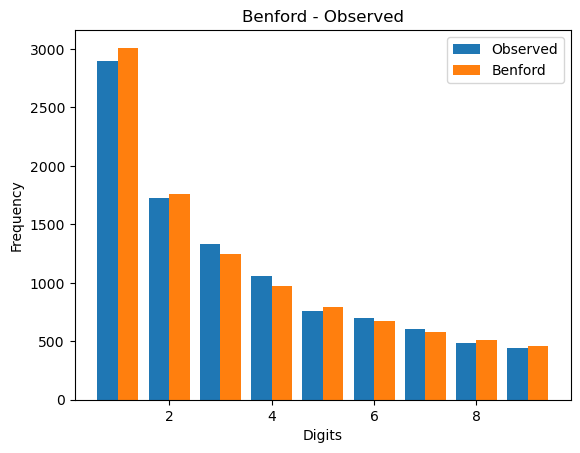

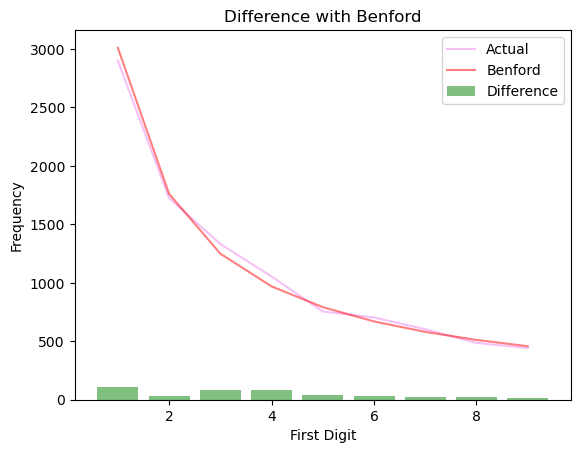

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9998939471736836, P-Value: 0.0
        R-squared: 0.9998


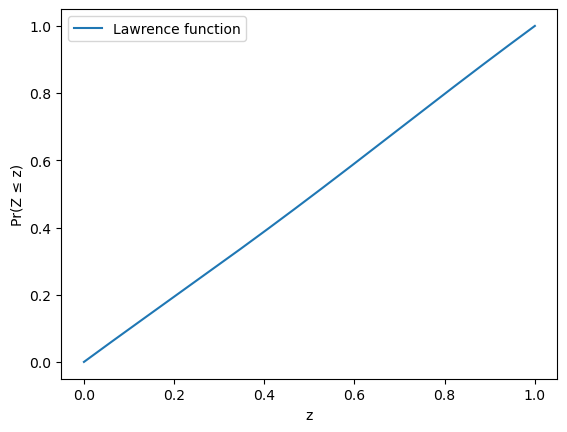

Distribution:


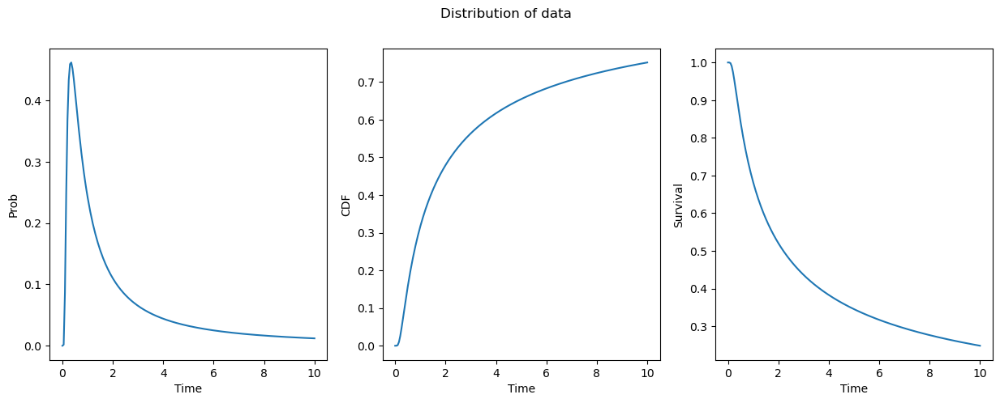

Lorenz Curve:


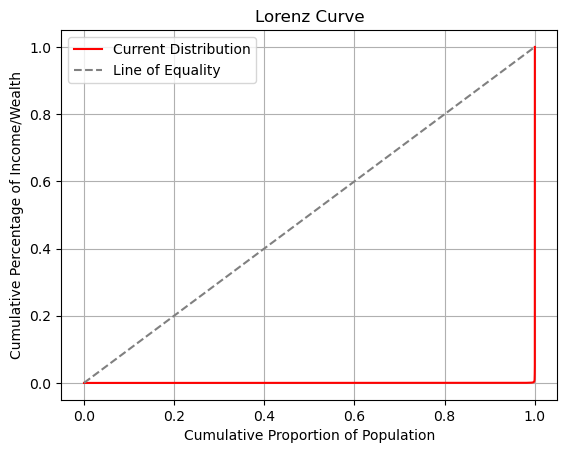

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9873
        Pearson Coefficient: -0.9937
        Slope (Regression): [-0.86041048]


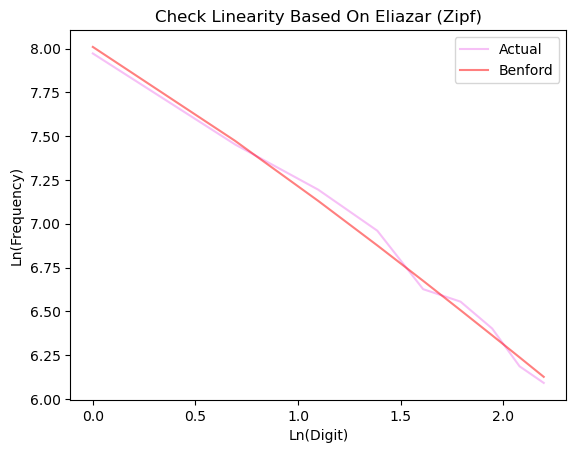

Scaled TTT:


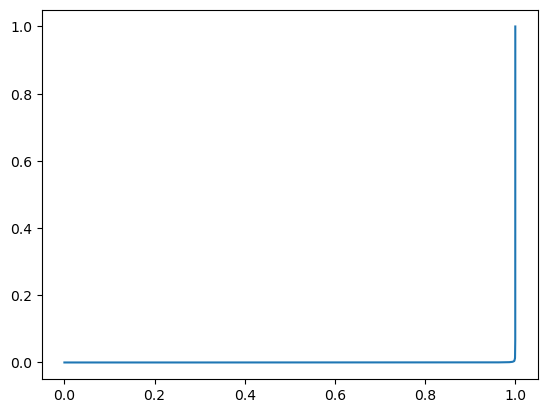

   Check t*h(t):
        Slope (Regression): [0.02129173]
        Estimated value for p (denoted in eliazar): 0.4327352546950991


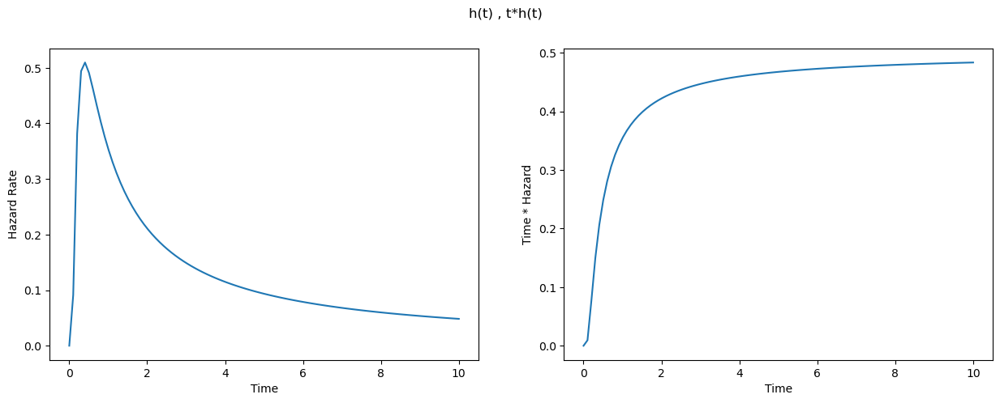

Statistical Tests:
    Chi2 Statistic: 20.786618379638323, Chi2 P-Value: 0.0077363845066649
    Lawrence Statistics-> c: 0.0020786618379638345, m: 0.017070004336018796
    MAD Statistic: 0.004660153835116509
    MAD result: None
    KS Statistic: 0.0218 KS P-Value: 0.01725950480602568
    Pearson Statistic: 0.9980806957743771 Pearson P-Value: 1.0179577332740724e-09
    J-Divergence: 0.002987110449130936
Benford Check:


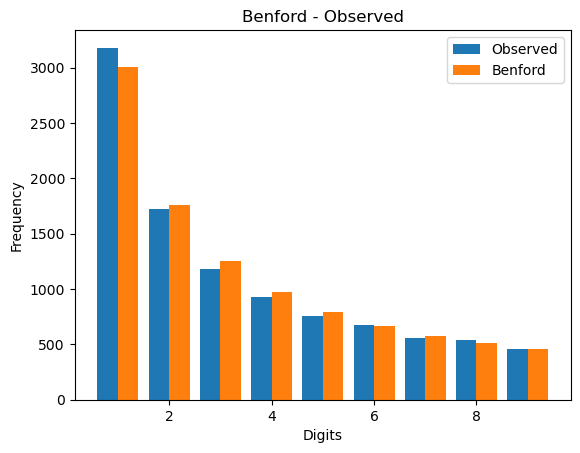

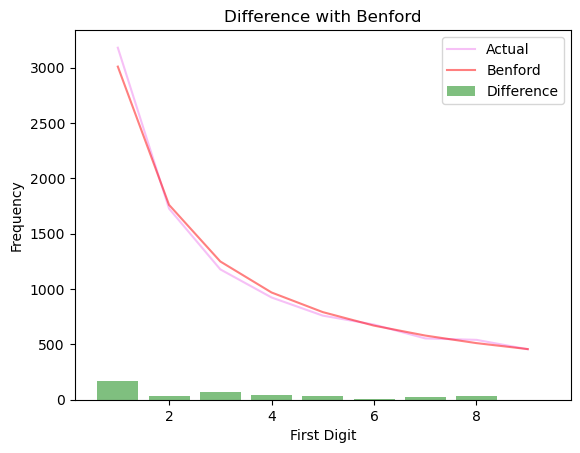

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9998994426718586, P-Value: 0.0
        R-squared: 0.9998


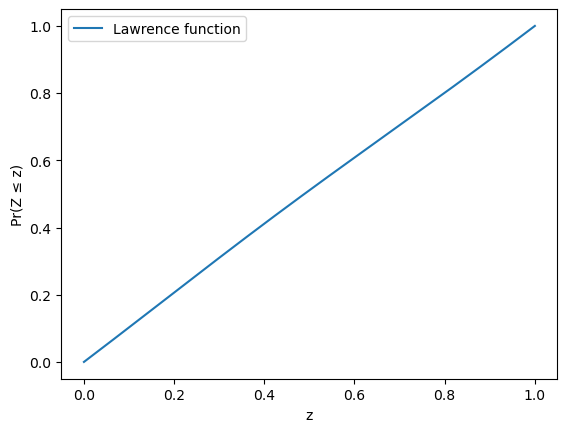

Distribution:


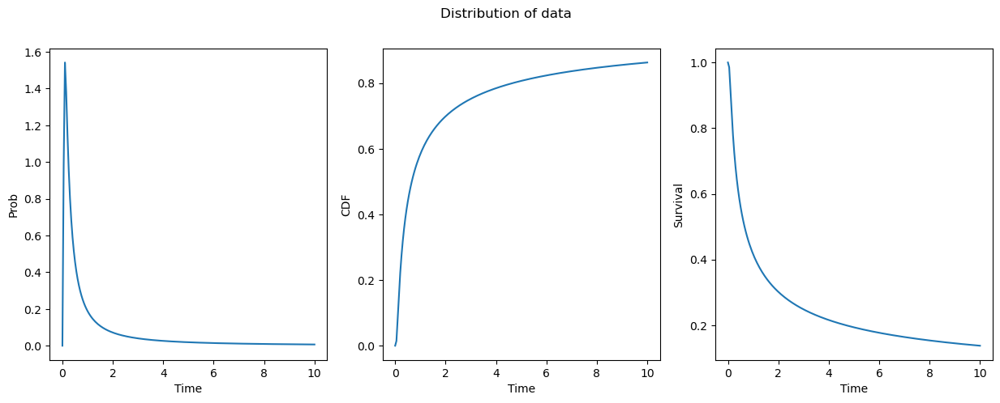

Lorenz Curve:


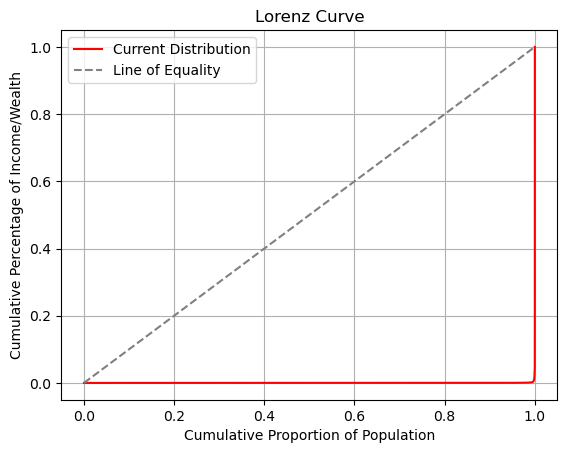

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9979
        Pearson Coefficient: -0.9989
        Slope (Regression): [-0.87230277]


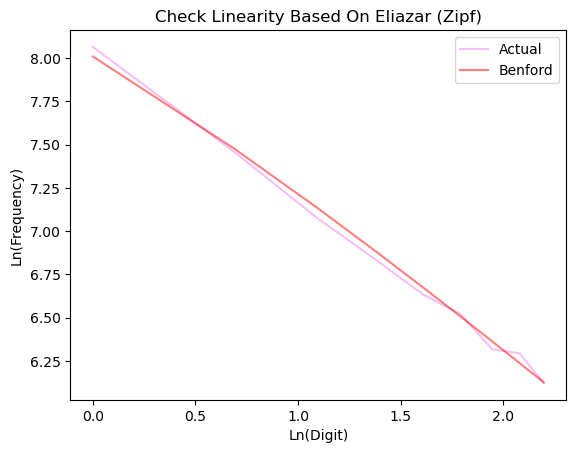

Scaled TTT:


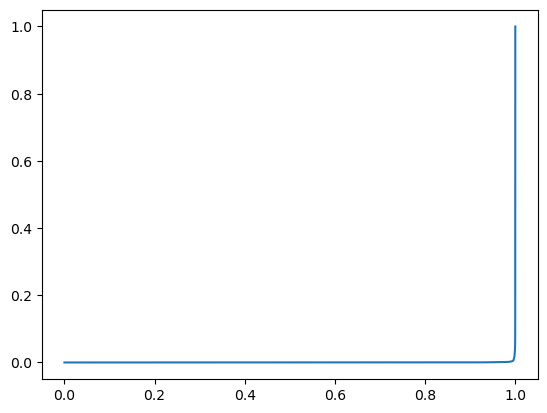

   Check t*h(t):
        Slope (Regression): [0.01061567]
        Estimated value for p (denoted in eliazar): 0.4722497466634767


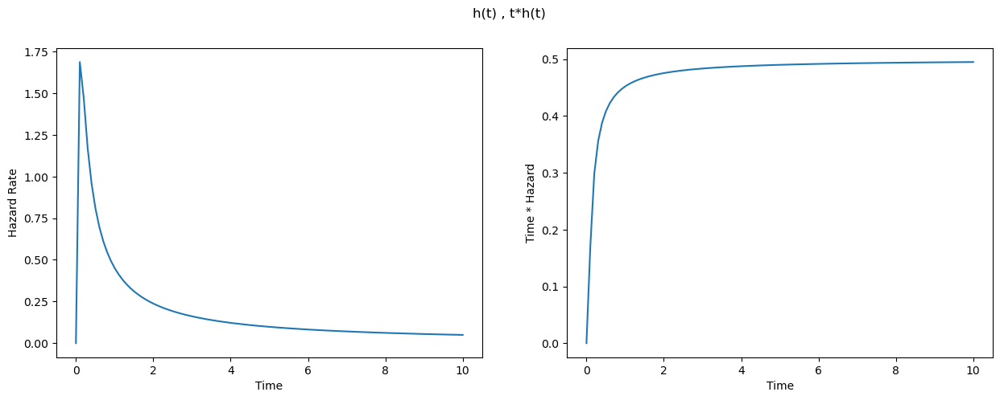

In [54]:
levy_rv = levy()
data = levy_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(levy_rv)
analyzer.report()
la = LindyAnalyzer(levy_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

levy_rv = levy(loc=0, scale=0.3)
data = levy_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(levy_rv)
analyzer.report()
la = LindyAnalyzer(levy_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)


#### - Inverse Gaussian

Statistical Tests:
    Chi2 Statistic: 56.170191687285374, Chi2 P-Value: 2.613549355044224e-09
    Lawrence Statistics-> c: 0.005617019168728537, m: 0.02712999566398122
    MAD Statistic: 0.007706387840075022
    MAD result: None
    KS Statistic: 0.0249 KS P-Value: 0.00405711323877029
    Pearson Statistic: 0.9967554959284685 Pearson P-Value: 6.385360942688518e-09
    J-Divergence: 0.008106312828707045
Benford Check:


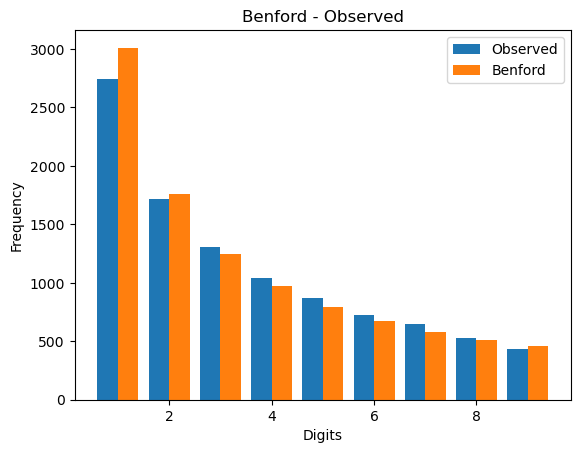

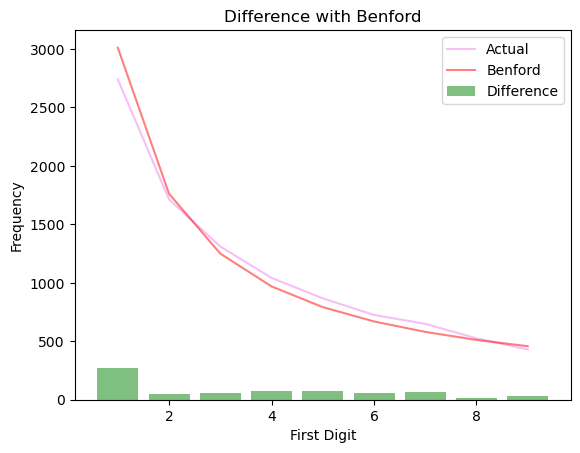

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9993351589602906, P-Value: 0.0
        R-squared: 0.9987


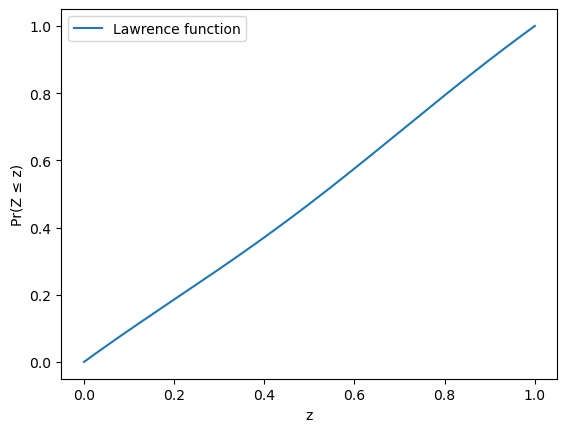

Distribution:


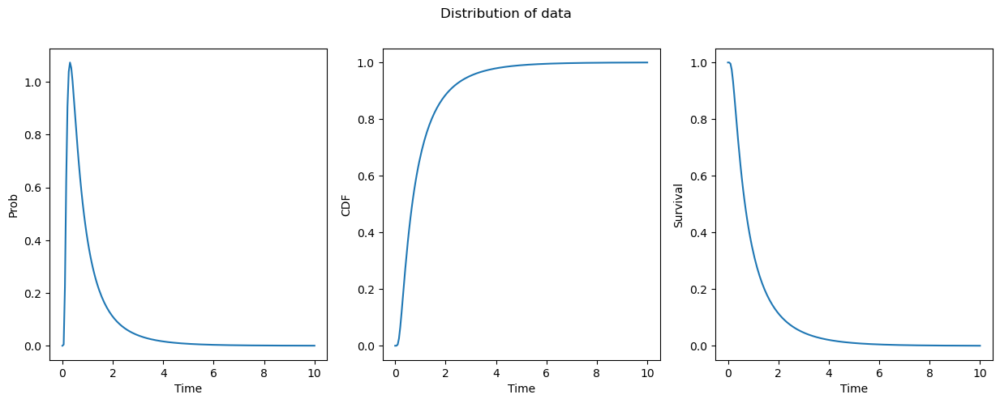

Lorenz Curve:


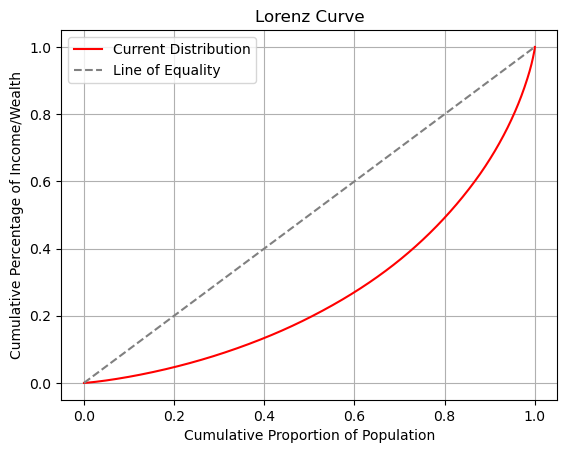

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9810
        Pearson Coefficient: -0.9905
        Slope (Regression): [-0.81274693]


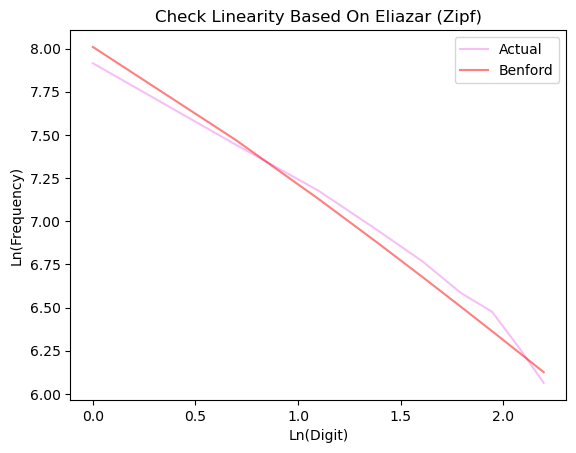

Scaled TTT:


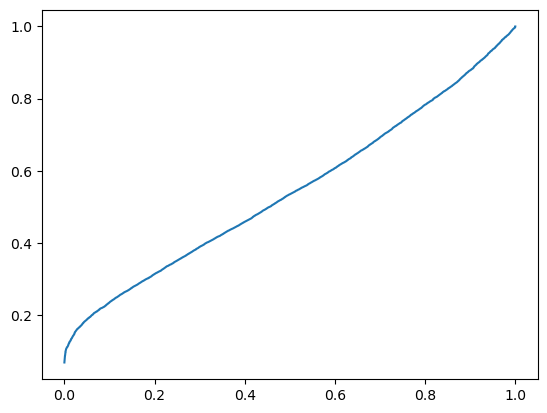

   Check t*h(t):
        Slope (Regression): [0.52315402]
        Estimated value for p (denoted in eliazar): 7.659257139258228


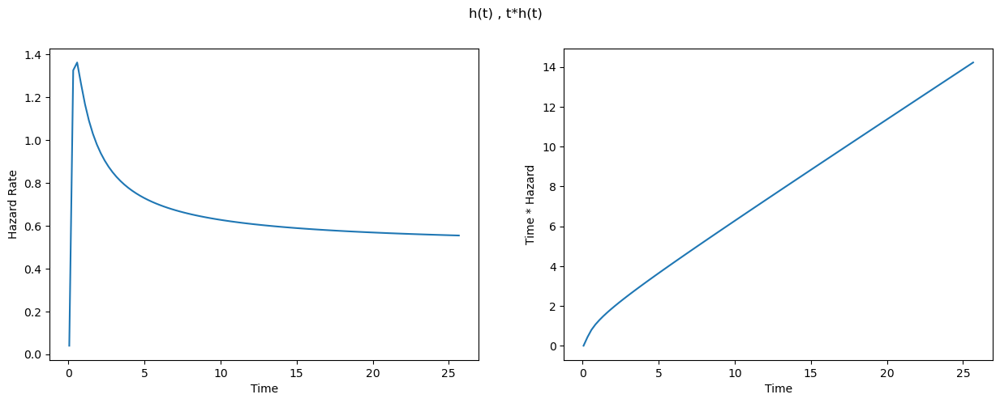

Statistical Tests:
    Chi2 Statistic: 2199.5197321114147, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.21995197321114143, m: 0.12480874094431876
    MAD Statistic: 0.04190222029510275
    MAD result: None
    KS Statistic: 0.1611 KS P-Value: 1.2609635443689802e-113
    Pearson Statistic: 0.890741092703011 Pearson P-Value: 0.0012737325081073675
    J-Divergence: 0.3671434220470212
Benford Check:


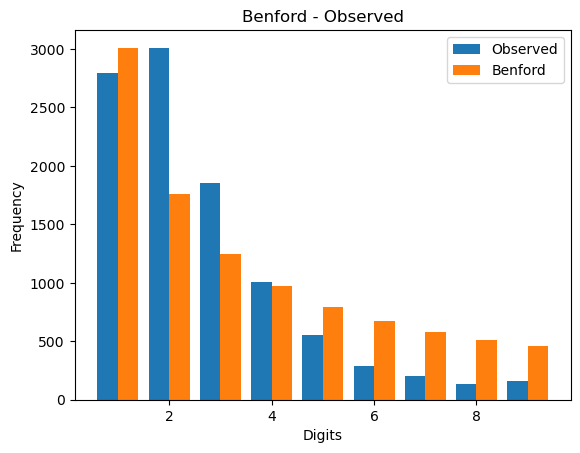

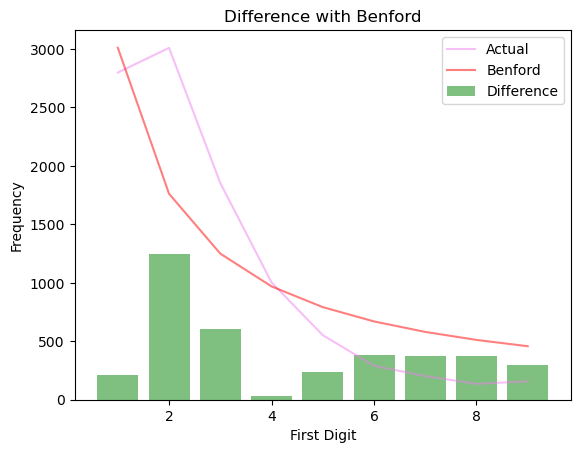

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9848404806595547, P-Value: 0.0
        R-squared: 0.9699


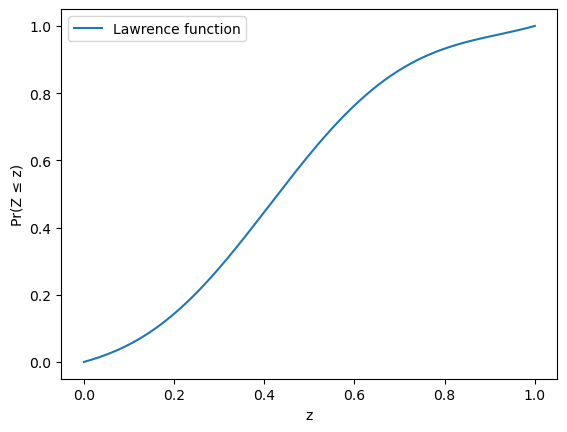

Distribution:


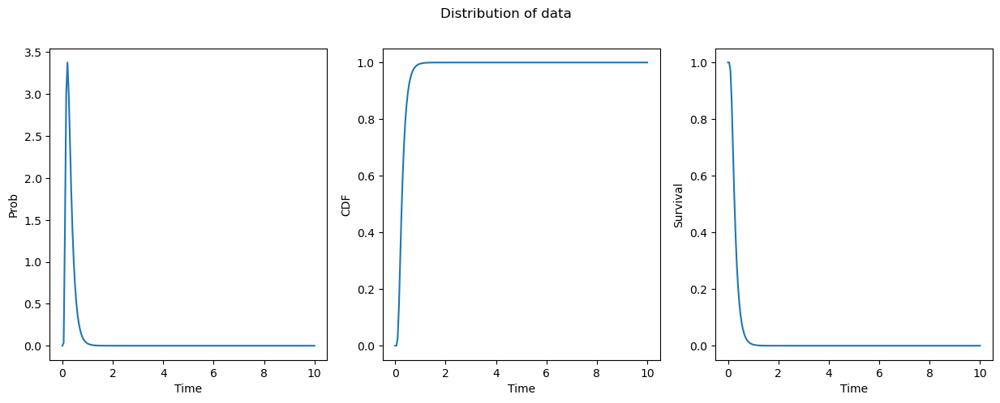

Lorenz Curve:


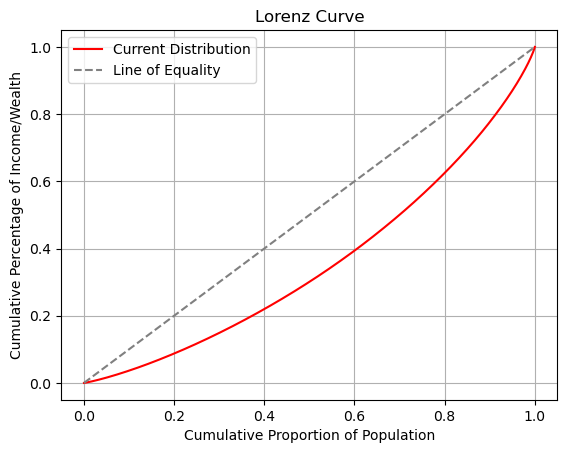

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.8654
        Pearson Coefficient: -0.9303
        Slope (Regression): [-1.59898886]


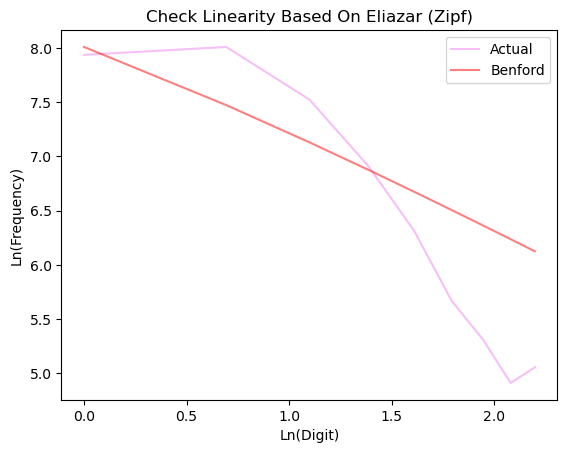

Scaled TTT:


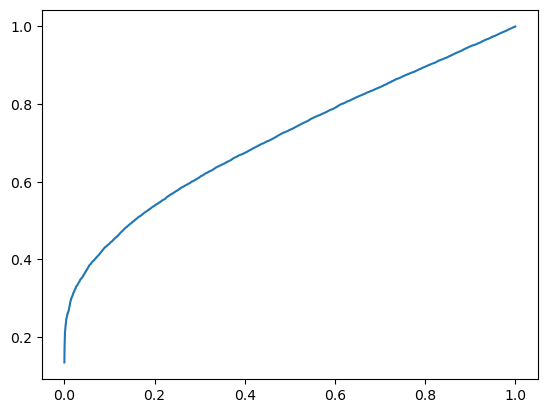

   Check t*h(t):
        Slope (Regression): [6.33975789]
        Estimated value for p (denoted in eliazar): 5.886419161931939


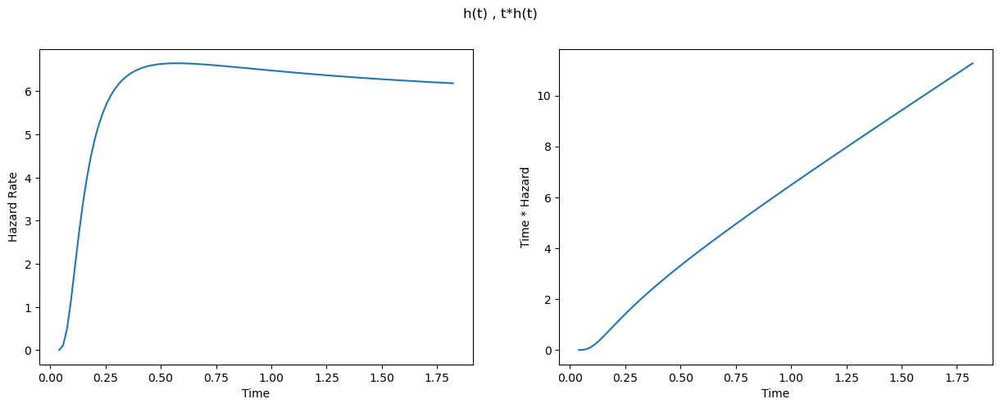

In [55]:
invgauss_rv = invgauss(mu=1)
data = invgauss_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invgauss_rv)
analyzer.report()
la = LindyAnalyzer(invgauss_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

invgauss_rv = invgauss(mu=0.3)
data = invgauss_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invgauss_rv)
analyzer.report()
la = LindyAnalyzer(invgauss_rv)
la.show_hazard_rate(np.min(data), np.max(data), LINDY_PRECISION)

#### - Inverse Weibull

Statistical Tests:
    Chi2 Statistic: 85.51869704054565, Chi2 P-Value: 3.763590788269844e-15
    Lawrence Statistics-> c: 0.008551869704054568, m: 0.02209125905568124
    MAD Statistic: 0.008813331406213864
    MAD result: None
    KS Statistic: 0.0343 KS P-Value: 1.5518585074250996e-05
    Pearson Statistic: 0.9948334514251085 Pearson P-Value: 3.247546338088662e-08
    J-Divergence: 0.012158317298423486
Benford Check:


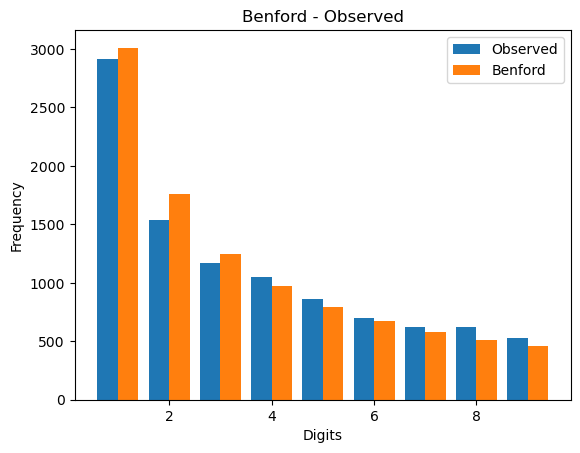

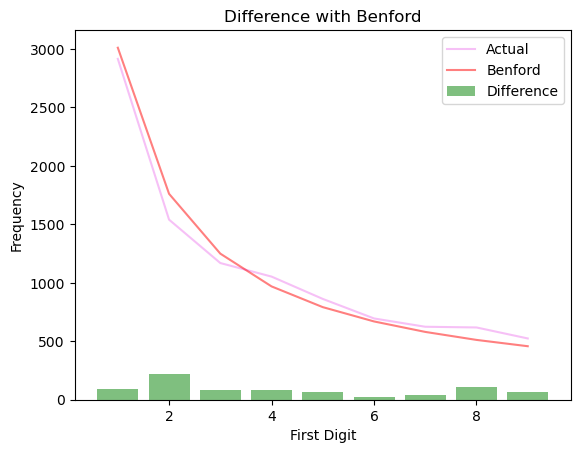

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.999291100260203, P-Value: 0.0
        R-squared: 0.9986


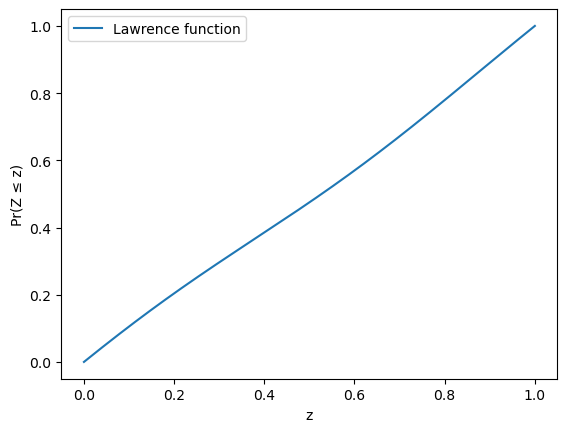

Distribution:


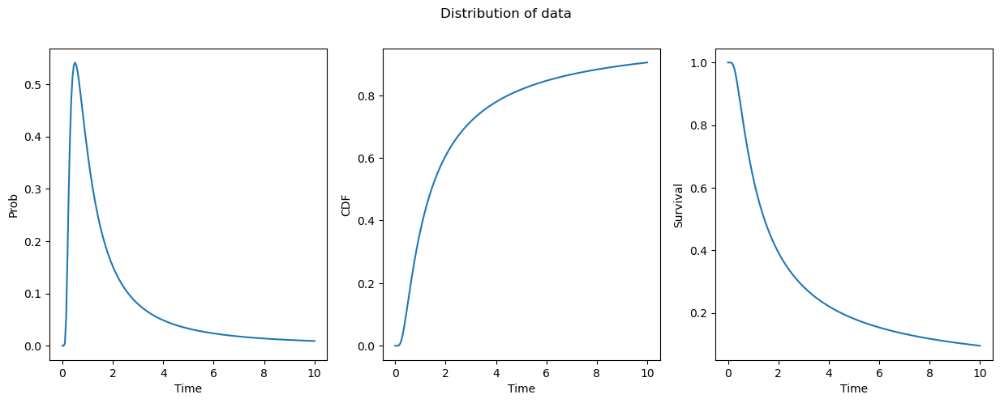

Lorenz Curve:


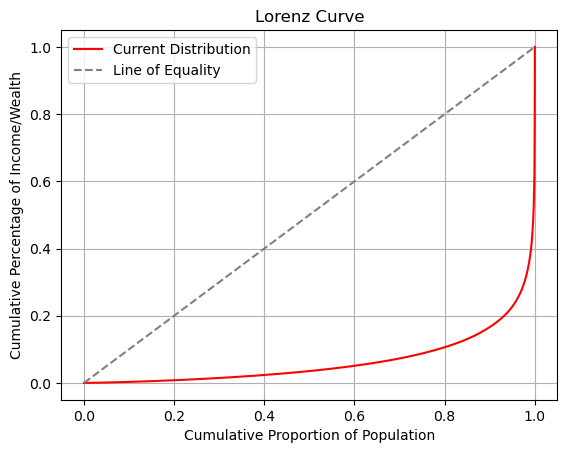

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9909
        Pearson Coefficient: -0.9954
        Slope (Regression): [-0.75267116]


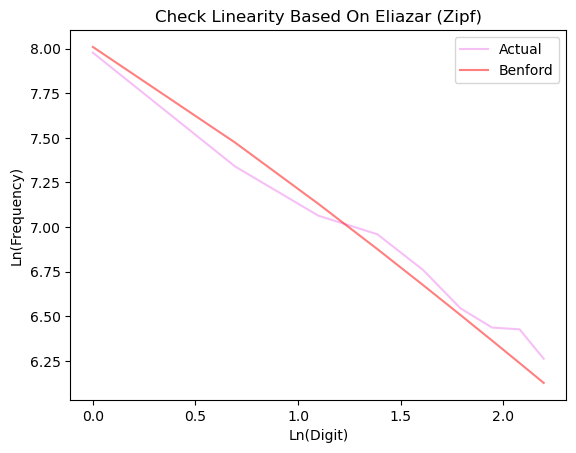

Scaled TTT:


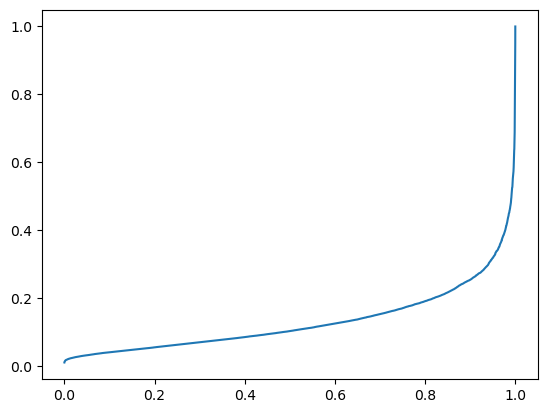

   Check t*h(t):
        Slope (Regression): [0.05333813]
        Estimated value for p (denoted in eliazar): 0.8176310051740113


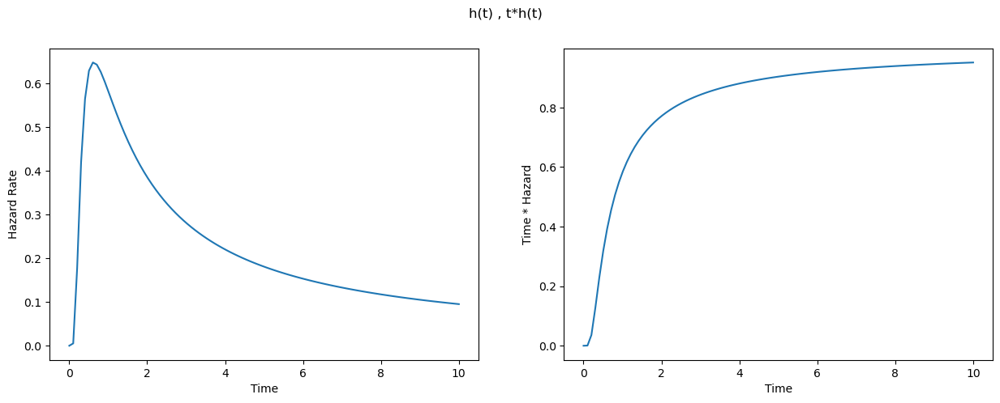

Statistical Tests:
    Chi2 Statistic: 6.577893784456913, Chi2 P-Value: 0.5827811721032803
    Lawrence Statistics-> c: 0.0006577893784456925, m: 0.003989986991943584
    MAD Statistic: 0.0021891667519208075
    MAD result: marginally
    KS Statistic: 0.0107 KS P-Value: 0.6160853764303585
    Pearson Statistic: 0.9995435425656227 Pearson P-Value: 6.687215164000443e-12
    J-Divergence: 0.0009380753867545915
Benford Check:


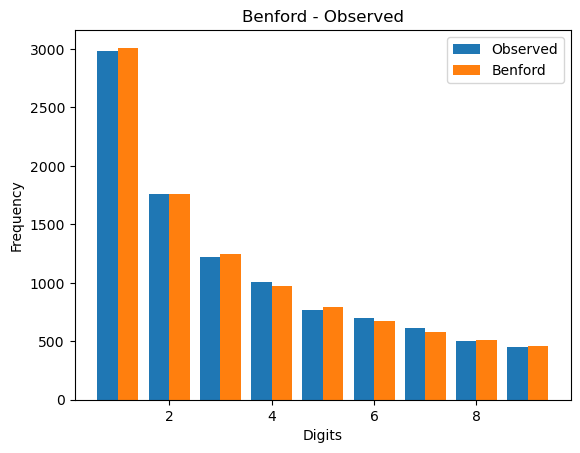

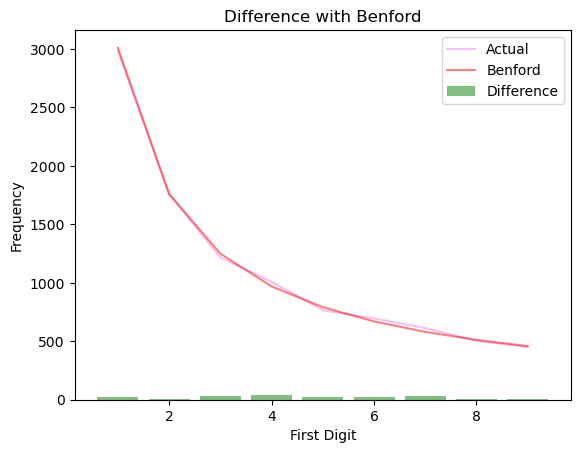

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.99999999999534, P-Value: 0.0
        R-squared: 1.0000


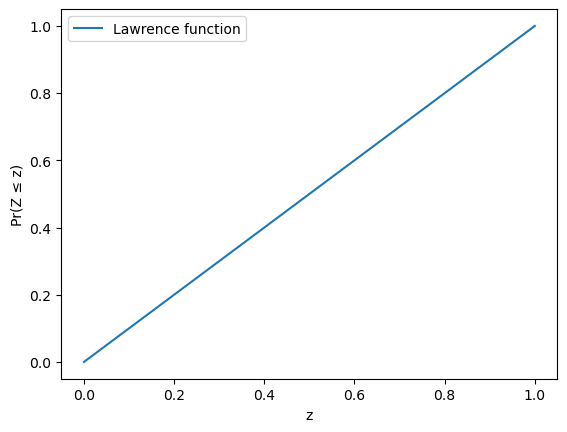

Distribution:


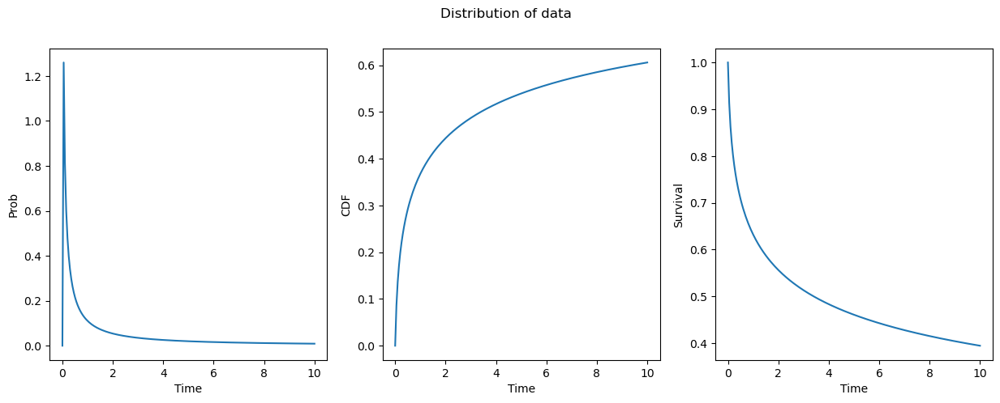

Lorenz Curve:


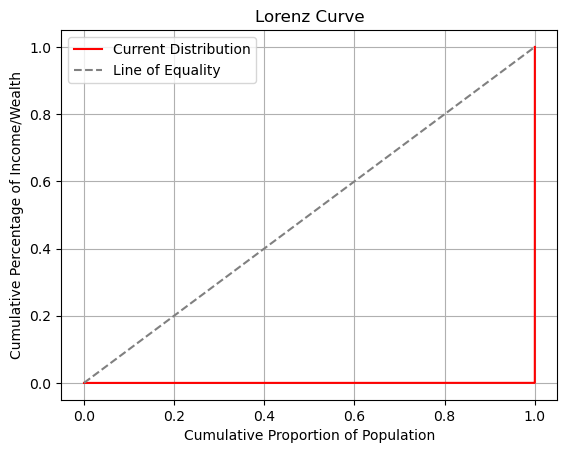

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9956
        Pearson Coefficient: -0.9978
        Slope (Regression): [-0.85465893]


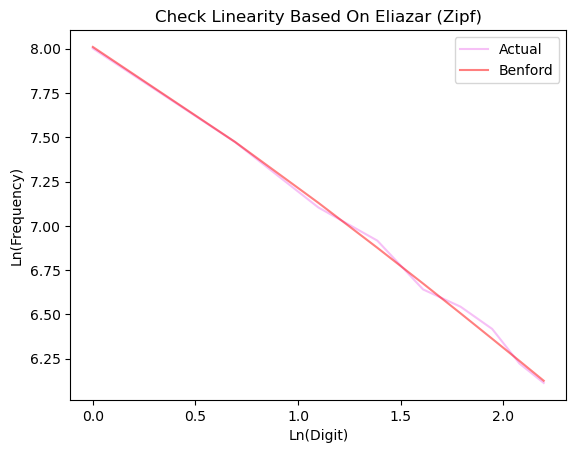

Scaled TTT:


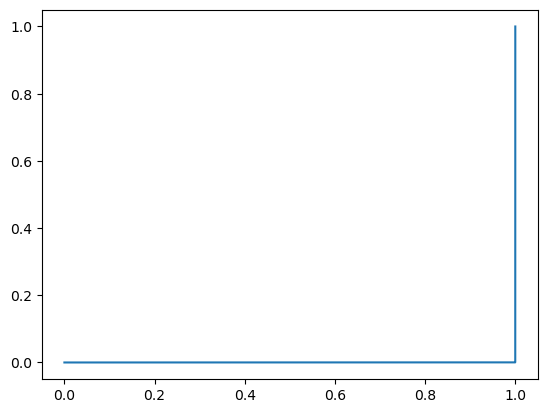

   Check t*h(t):
        Slope (Regression): [0.00831365]
        Estimated value for p (denoted in eliazar): 0.20643955559156563


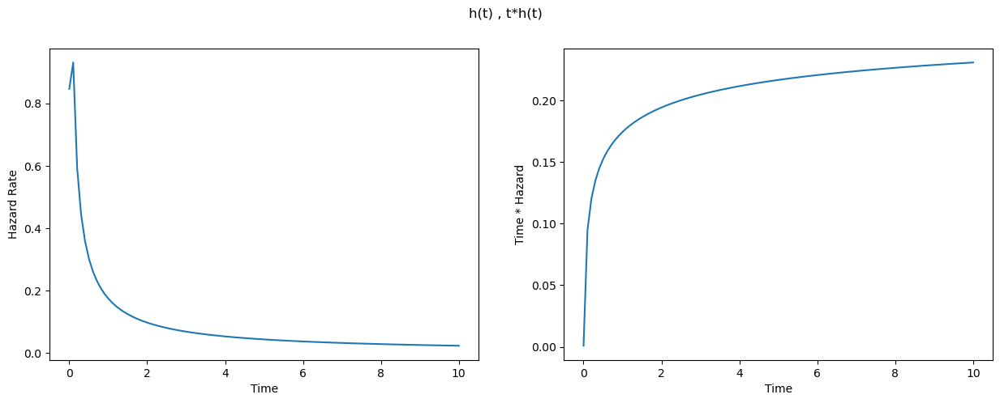

In [56]:
invweibull_rv = invweibull(c=1)
data = invweibull_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invweibull_rv)
analyzer.report()
la = LindyAnalyzer(invweibull_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

invweibull_rv = invweibull(c=0.3)
data = invweibull_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(invweibull_rv)
analyzer.report()
la = LindyAnalyzer(invweibull_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)


#### - Cauchy

Statistical Tests:
    Chi2 Statistic: 11.935085693810308, Chi2 P-Value: 0.1541237855614329
    Lawrence Statistics-> c: 0.00119350856938103, m: 0.008291259055681233
    MAD Statistic: 0.002873767922160962
    MAD result: None
    KS Statistic: 0.009 KS P-Value: 0.8127749152563353
    Pearson Statistic: 0.9988934603338602 Pearson P-Value: 1.4823617213192705e-10
    J-Divergence: 0.0017024515290649253
Benford Check:


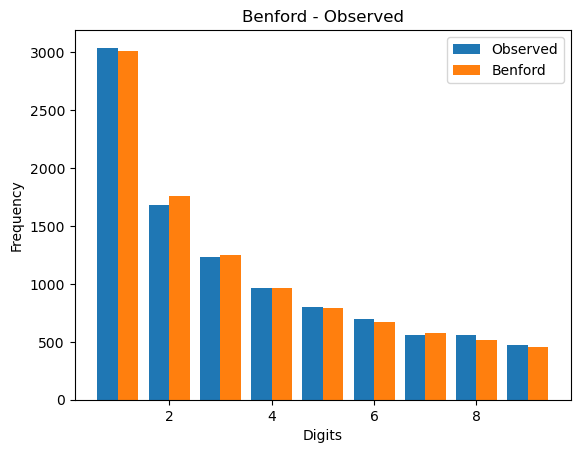

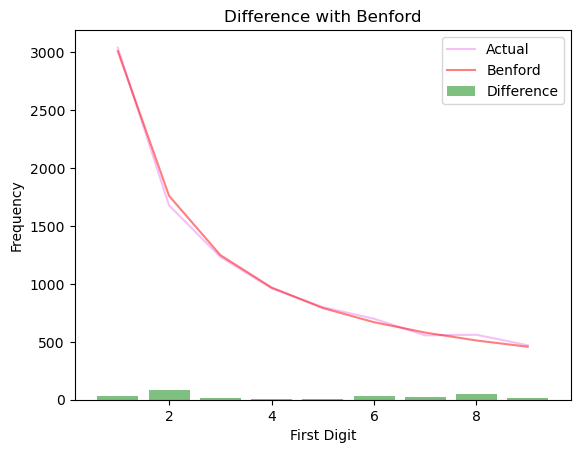

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999075854369182, P-Value: 0.0
        R-squared: 0.9998


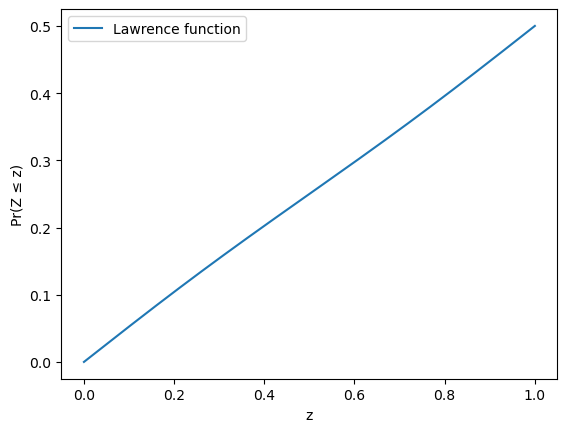

Distribution:


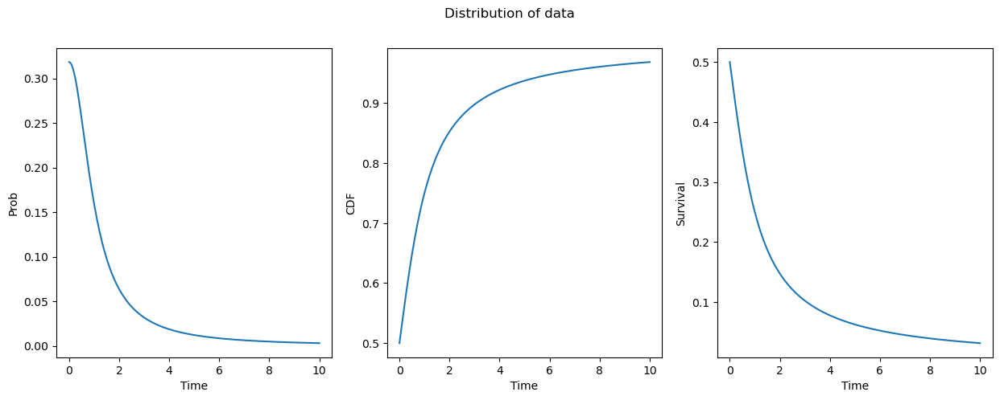

Lorenz Curve:


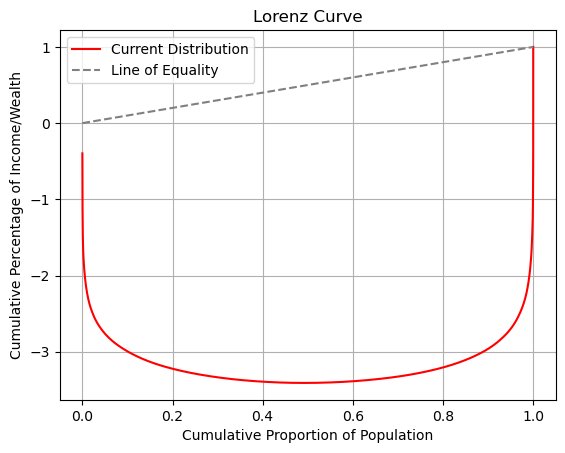

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9966
        Pearson Coefficient: -0.9983
        Slope (Regression): [-0.8388461]


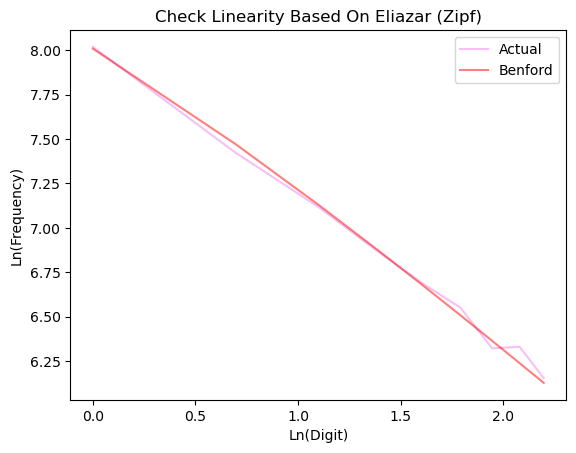

Scaled TTT:


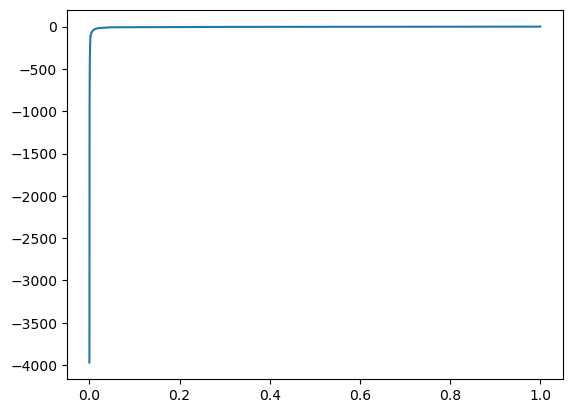

   Check t*h(t):
        Slope (Regression): [0.04987382]
        Estimated value for p (denoted in eliazar): 0.8833929274090393


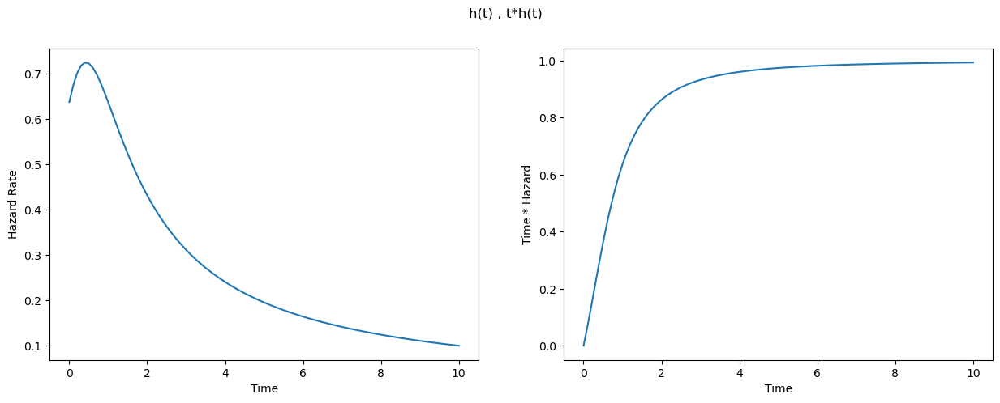

Statistical Tests:
    Chi2 Statistic: 15.394668270258355, Chi2 P-Value: 0.051910677761855935
    Lawrence Statistics-> c: 0.0015394668270258328, m: 0.005408740944318757
    MAD Statistic: 0.003431548590617953
    MAD result: None
    KS Statistic: 0.0109 KS P-Value: 0.5924073621556236
    Pearson Statistic: 0.9988582960635292 Pearson P-Value: 1.653834812856595e-10
    J-Divergence: 0.0022635367034166405
Benford Check:


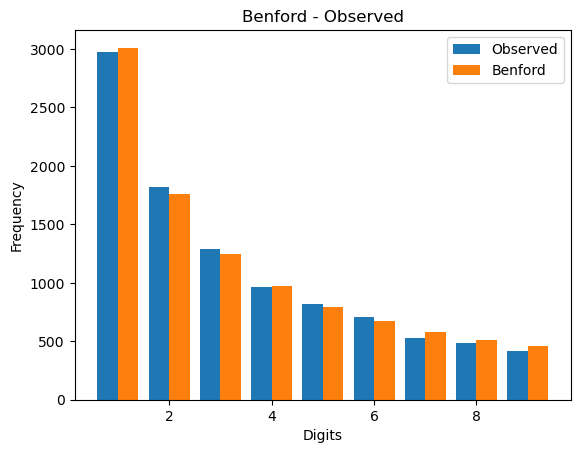

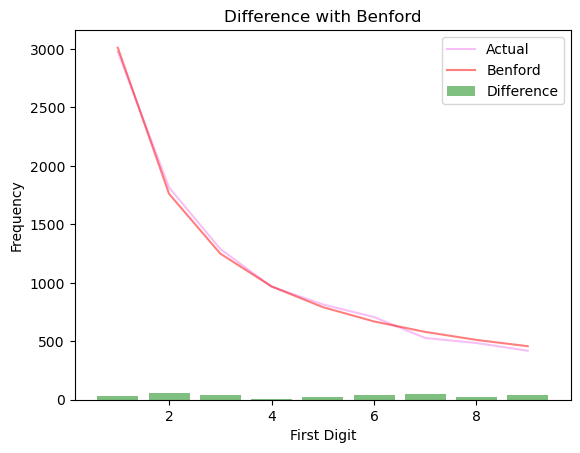

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9999089462071126, P-Value: 0.0
        R-squared: 0.9998


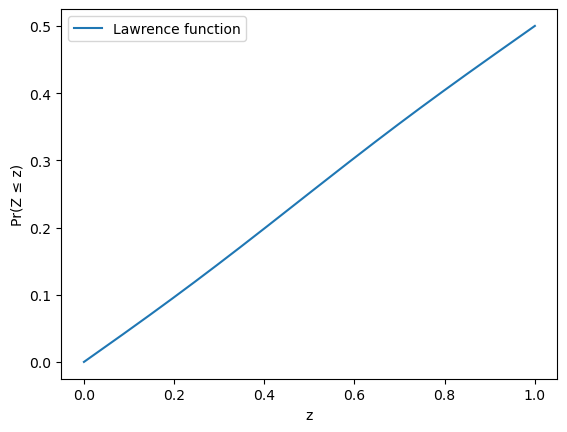

Distribution:


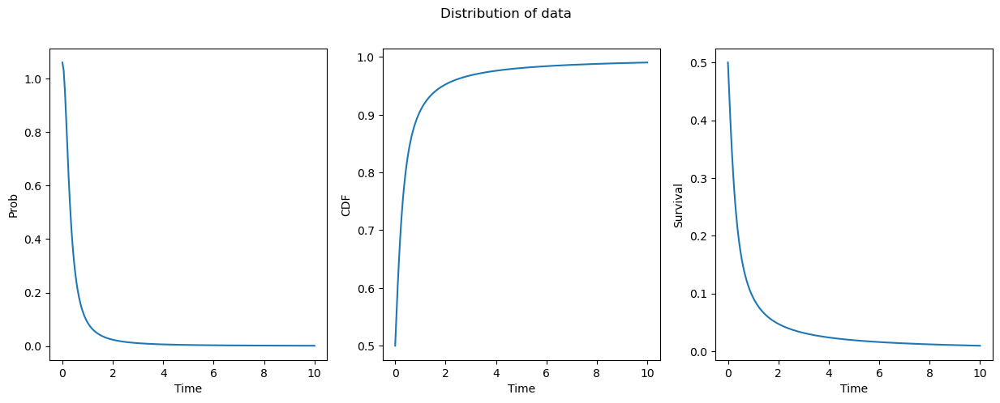

Lorenz Curve:


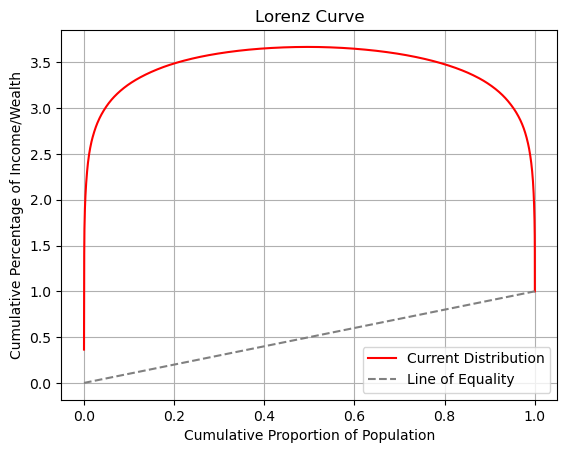

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9891
        Pearson Coefficient: -0.9945
        Slope (Regression): [-0.89799754]


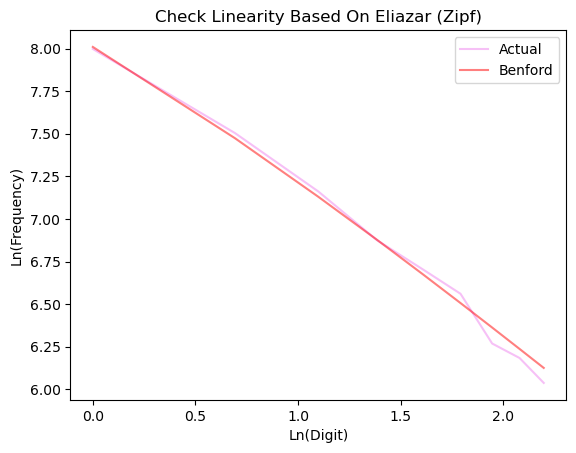

Scaled TTT:


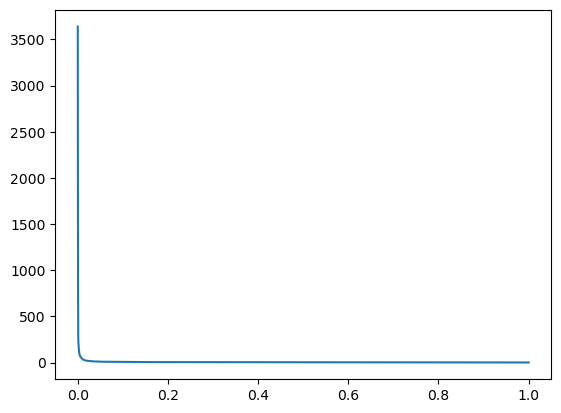

   Check t*h(t):
        Slope (Regression): [0.02098184]
        Estimated value for p (denoted in eliazar): 0.9600585173527034


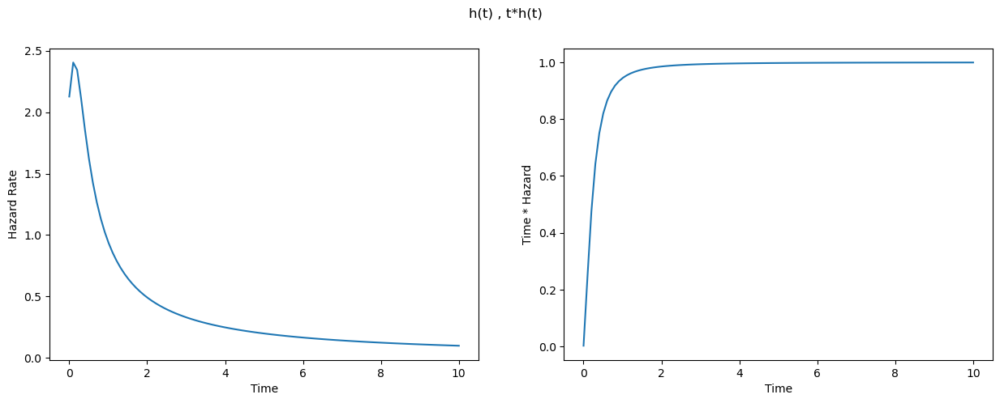

In [57]:
cauchy_rv = cauchy()
data = cauchy_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(cauchy_rv)
analyzer.report()
la = LindyAnalyzer(cauchy_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

cauchy_rv = cauchy(loc=0, scale=0.3)
data = cauchy_rv.rvs(size=SAMPLE_SIZE)
analyzer.set_data(data)
analyzer.set_dist_of_data(cauchy_rv)
analyzer.report()
la = LindyAnalyzer(cauchy_rv)
la.show_hazard_rate(0, 10, LINDY_PRECISION)

#### - ErdosReyni Network Degree Distribution

Statistical Tests:
    Chi2 Statistic: 1257.352264231014, Chi2 P-Value: 3.8781861592772876e-266
    Lawrence Statistics-> c: 1.257352264231014, m: 0.32690874094431877
    MAD Statistic: 0.11619527672896392
    MAD result: None
    KS Statistic: 0.555 KS P-Value: 5.2479055181400886e-142
    Pearson Statistic: 0.874112742282231 Pearson P-Value: 0.002056301940738657
    J-Divergence: nan
Benford Check:


/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:228: RuntimeWarning: divide by zero encountered in log2
  first_digits_probes[i] * np.log2(first_digits_probes[i] / benford_probes[i]) +
/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:228: RuntimeWarning: invalid value encountered in scalar multiply
  first_digits_probes[i] * np.log2(first_digits_probes[i] / benford_probes[i]) +
/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:229: RuntimeWarning: divide by zero encountered in scalar divide
  benford_probes[i] * np.log2(benford_probes[i] / first_digits_probes[i])


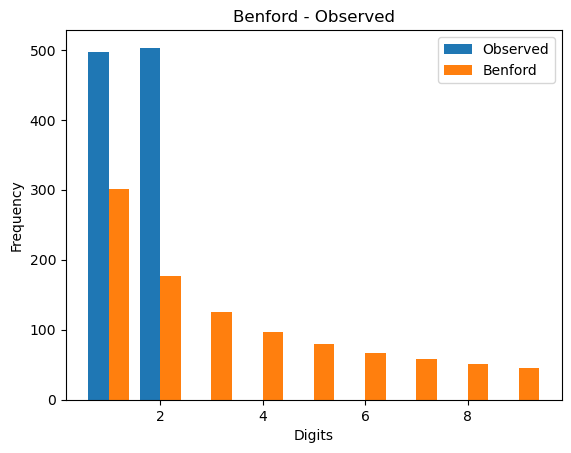

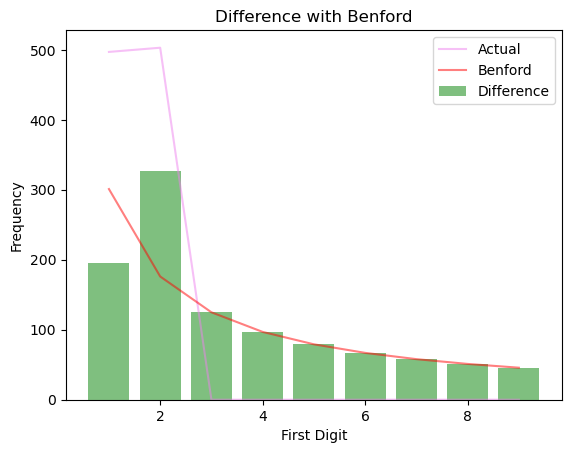

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.8216802931258457, P-Value: 6.477893344974461e-246
        R-squared: 0.6752


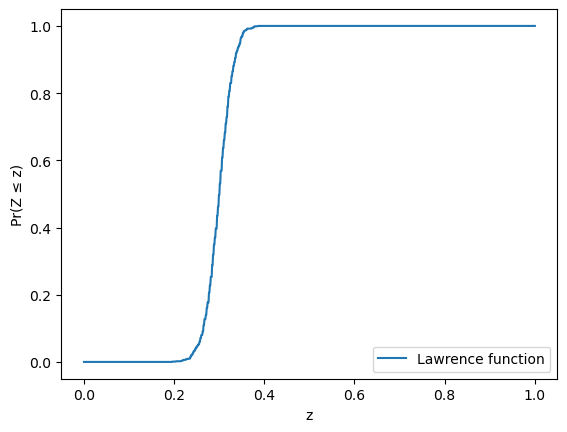

Distribution:


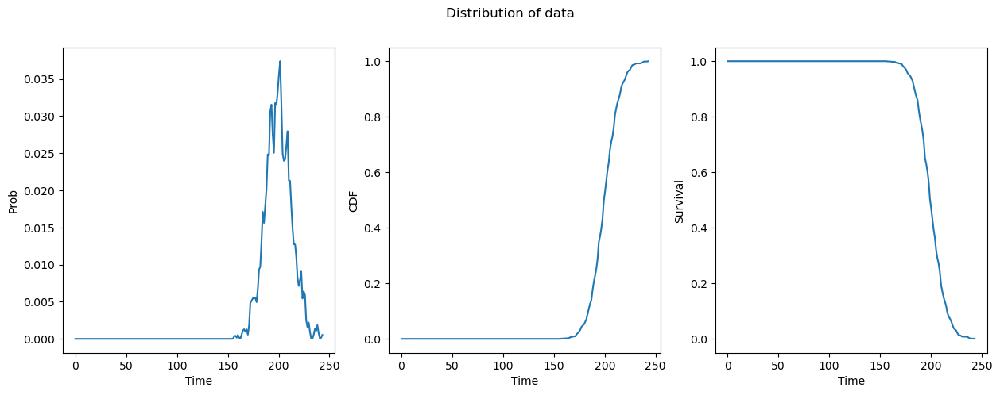

Lorenz Curve:


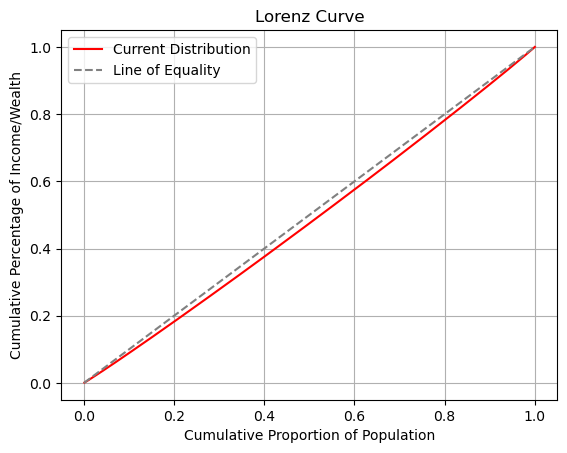

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.7187
        Pearson Coefficient: -0.8478
        Slope (Regression): [-3.22994823]


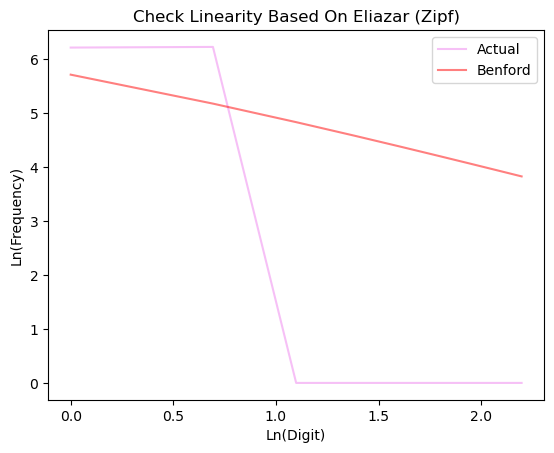

Scaled TTT:


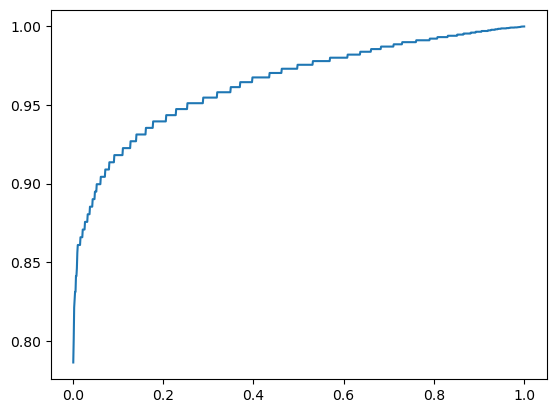

   Check t*h(t):
        Slope (Regression): [0.14733469]
        Estimated value for p (denoted in eliazar): 7.1112909830472555


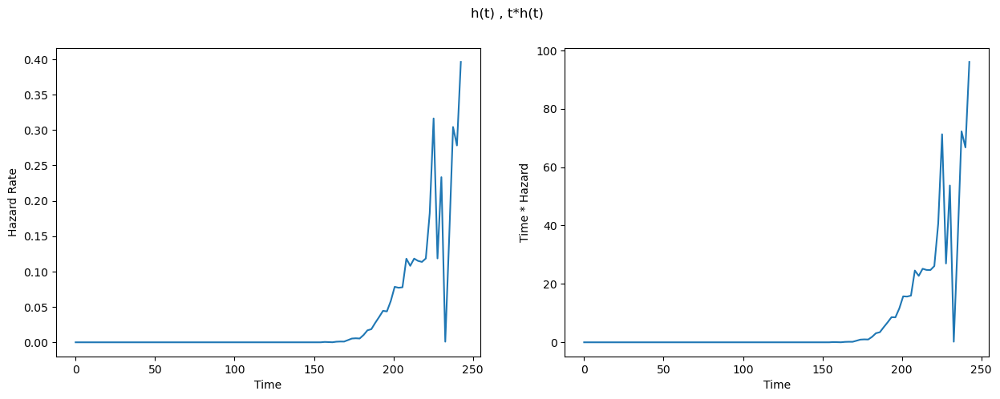

Statistical Tests:
    Chi2 Statistic: 2799.3477574023277, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 2.7993477574023276, m: 0.29824250943932484
    MAD Statistic: 0.13179110918399164
    MAD result: None
    KS Statistic: 0.364 KS P-Value: 2.7948372826899163e-59
    Pearson Statistic: 0.5409207571961199 Pearson P-Value: 0.13262670004588292
    J-Divergence: nan
Benford Check:


/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:228: RuntimeWarning: divide by zero encountered in log2
  first_digits_probes[i] * np.log2(first_digits_probes[i] / benford_probes[i]) +
/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:228: RuntimeWarning: invalid value encountered in scalar multiply
  first_digits_probes[i] * np.log2(first_digits_probes[i] / benford_probes[i]) +
/var/folders/yq/5ch5x8jn4qb69qx20g9_9lqr0000gn/T/ipykernel_58379/1319226645.py:229: RuntimeWarning: divide by zero encountered in scalar divide
  benford_probes[i] * np.log2(benford_probes[i] / first_digits_probes[i])


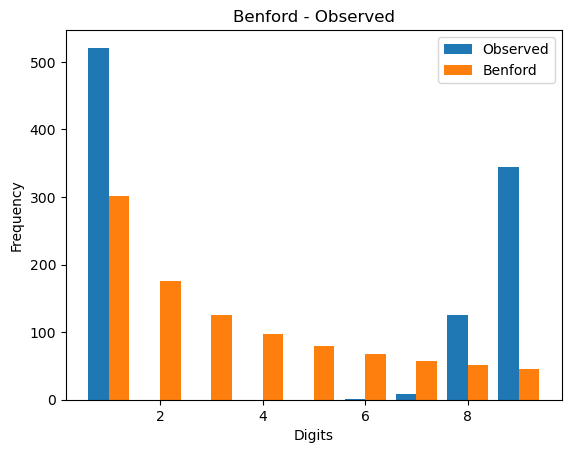

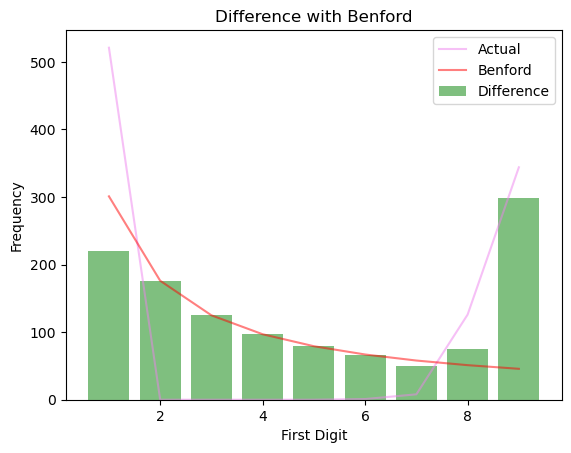

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.5546250765376217, P-Value: 9.832357776522883e-82
        R-squared: 0.3076


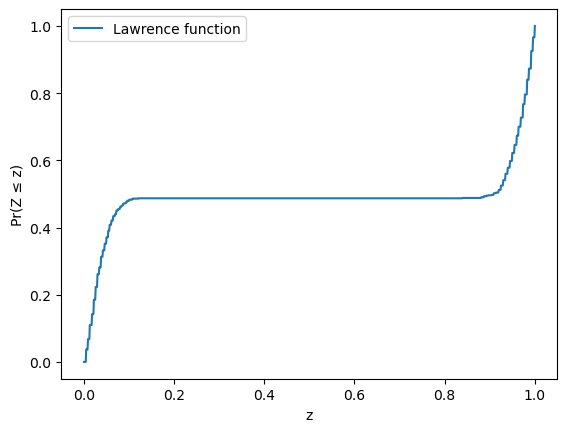

Distribution:


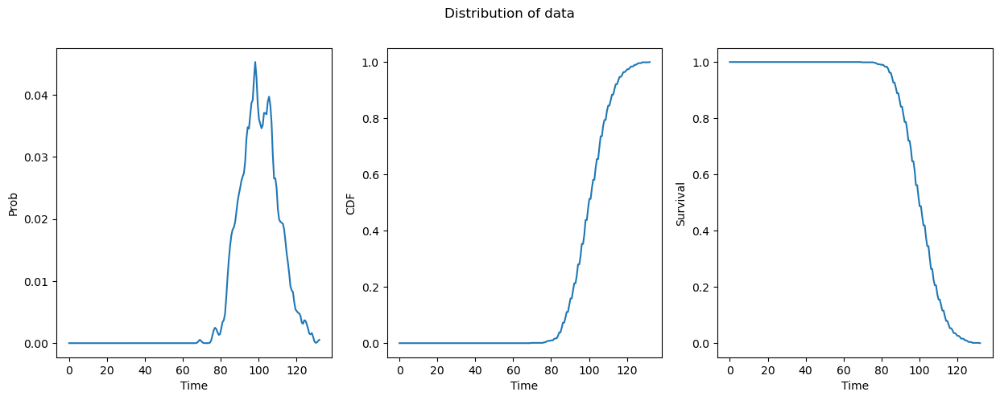

Lorenz Curve:


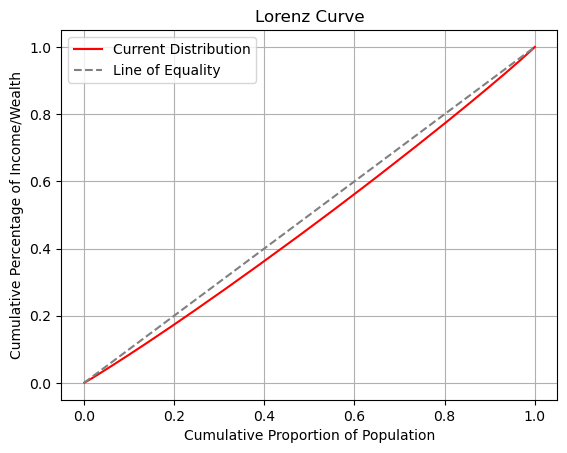

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0000
        Pearson Coefficient: -0.0067
        Slope (Regression): [-0.02583897]


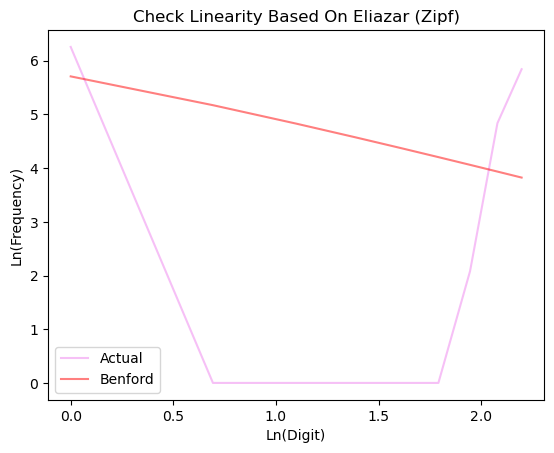

Scaled TTT:


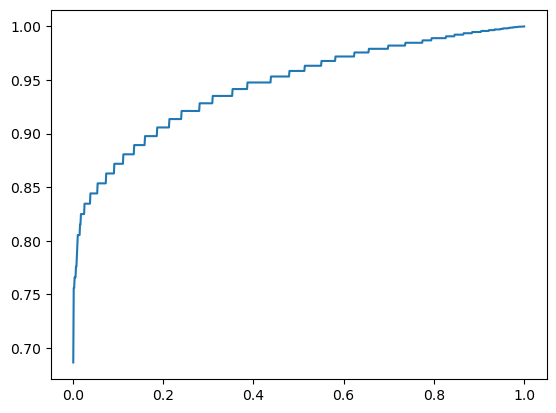

   Check t*h(t):
        Slope (Regression): [0.27068218]
        Estimated value for p (denoted in eliazar): 7.359223616992953


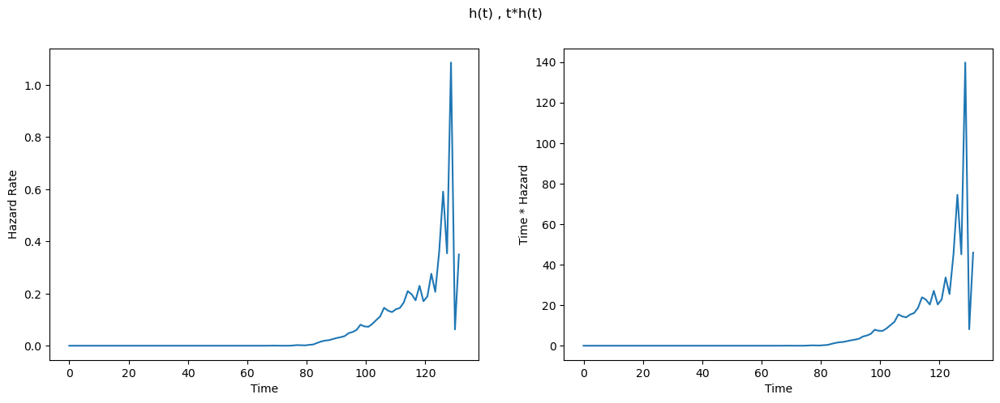

In [58]:
G = nx.erdos_renyi_graph(1000, 0.2)
degrees = [G.degree(n) for n in G.nodes()]
analyzer.set_data(degrees)
analyzer.report()
dist = Distribution(degrees)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 500, LINDY_PRECISION)

G = nx.erdos_renyi_graph(1000, 0.1)
degrees = [G.degree(n) for n in G.nodes]
analyzer.set_data(degrees)
analyzer.report()
dist = Distribution(degrees)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 500, LINDY_PRECISION)

#### - BarabasiAlbert Network Degree Distribution

Statistical Tests:
    Chi2 Statistic: 10759.535952810696, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 1.0759535952810697, m: 0.2782612633917001
    MAD Statistic: 0.09467182549009014
    MAD result: None
    KS Statistic: 0.3747 KS P-Value: 0.0
    Pearson Statistic: 0.08895513748067563 Pearson P-Value: 0.8199728144924117
    J-Divergence: 1.579052448432024
Benford Check:


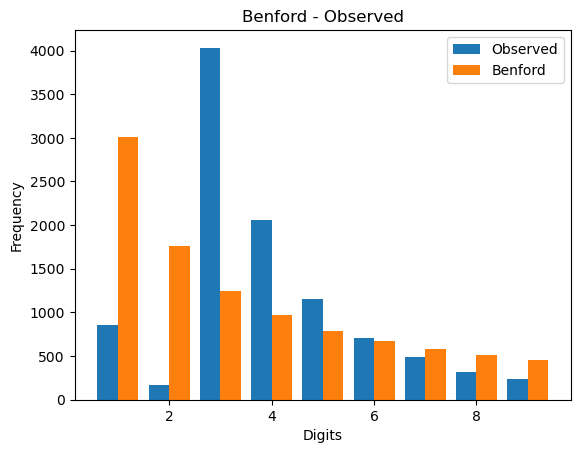

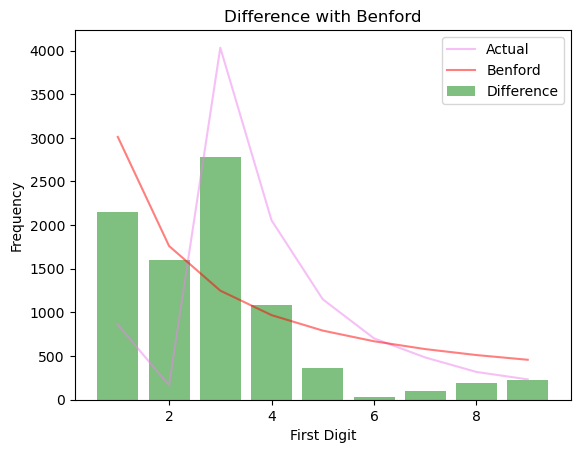

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9516738643514147, P-Value: 0.0
        R-squared: 0.9057


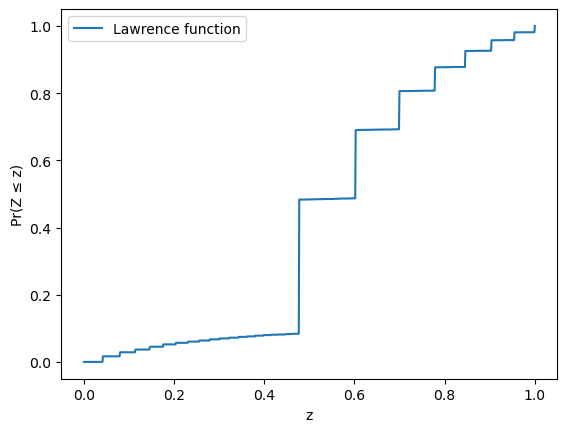

Distribution:


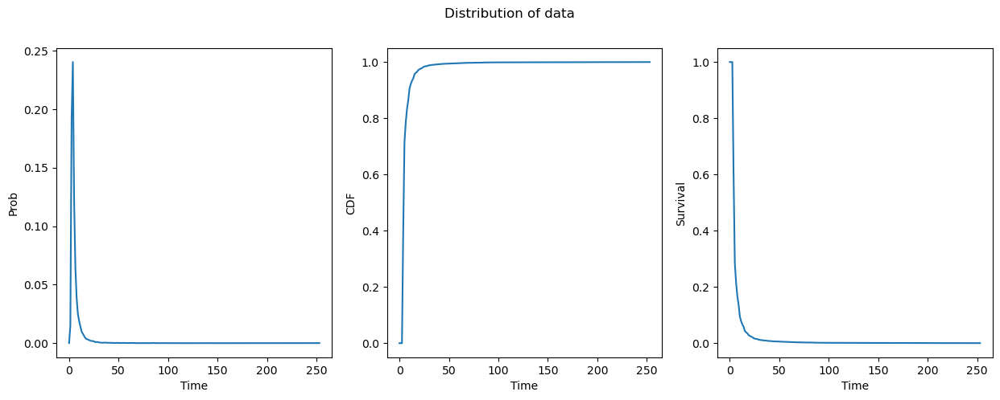

Lorenz Curve:


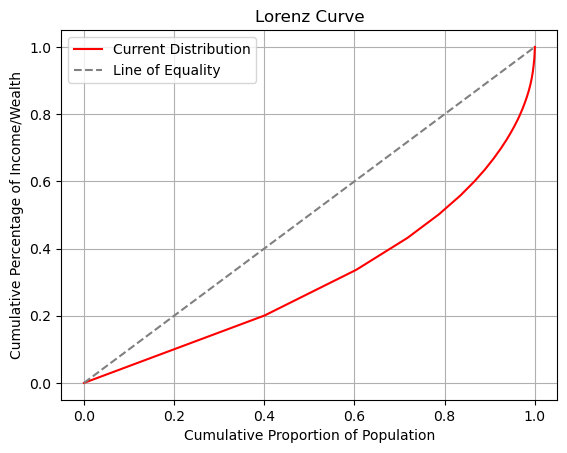

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0487
        Pearson Coefficient: -0.2207
        Slope (Regression): [-0.3175517]


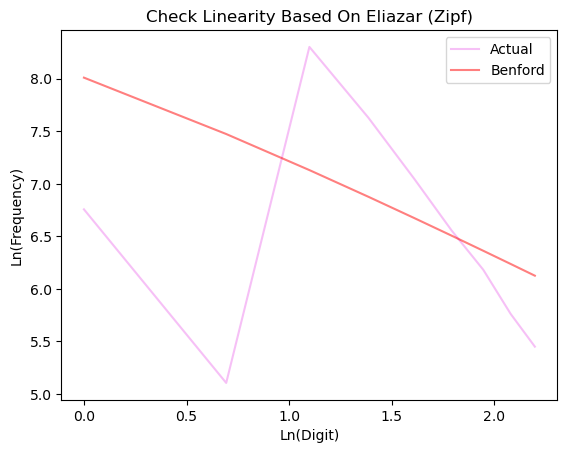

Scaled TTT:


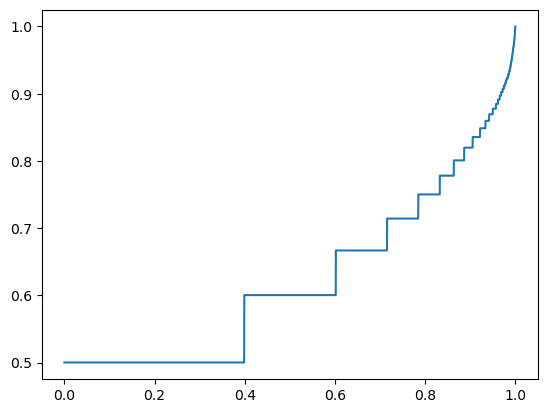

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


   Linearity Check:
        R-squared: 0.9601
        Pearson Coefficient: -0.9799
        Slope (Regression): [-1.4098928]


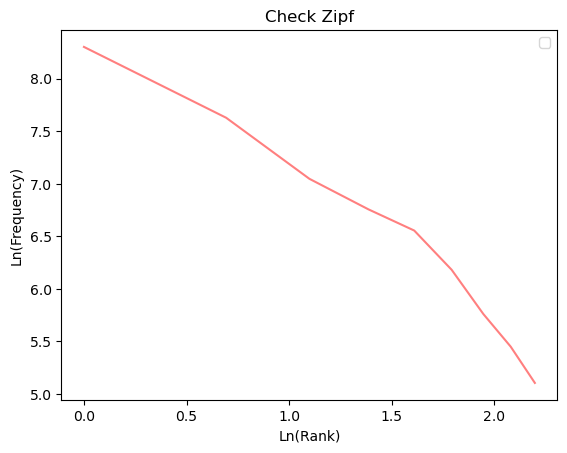

   Check t*h(t):
        Slope (Regression): [0.03560379]
        Estimated value for p (denoted in eliazar): 3.5530029521417323


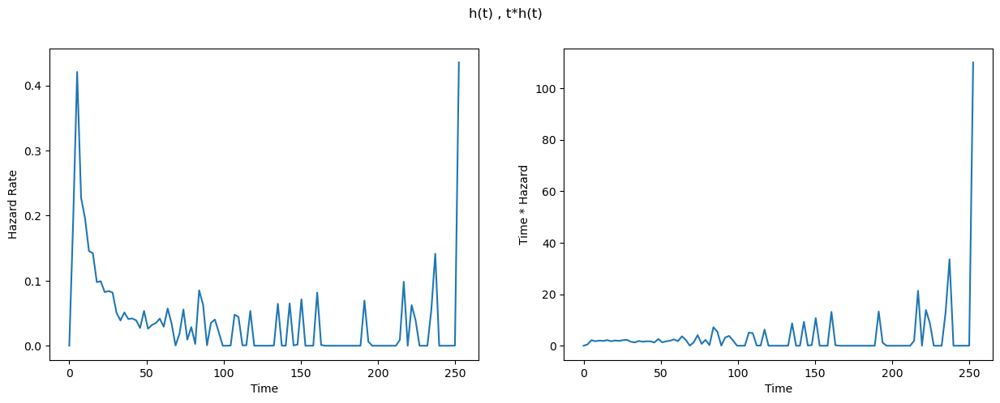

Statistical Tests:
    Chi2 Statistic: 11682.822785264654, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 1.1682822785264653, m: 0.2104187539523752
    MAD Statistic: 0.09659333429689307
    MAD result: None
    KS Statistic: 0.4318 KS P-Value: 0.0
    Pearson Statistic: 0.144178743047364 Pearson P-Value: 0.7113220628304413
    J-Divergence: 1.737198099851169
Benford Check:


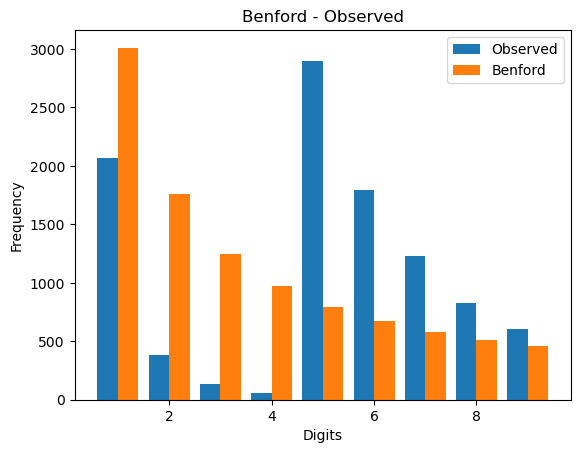

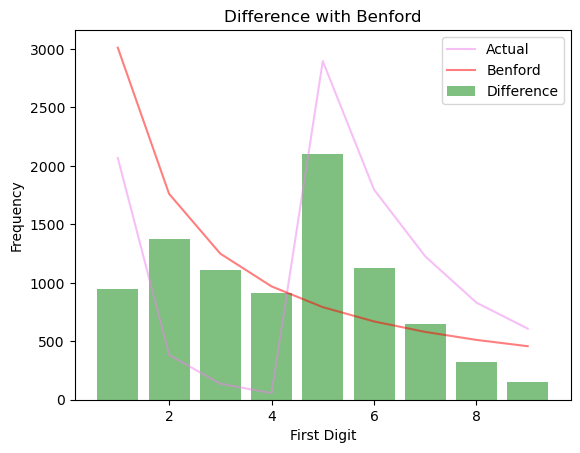

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.8927735879643925, P-Value: 0.0
        R-squared: 0.7970


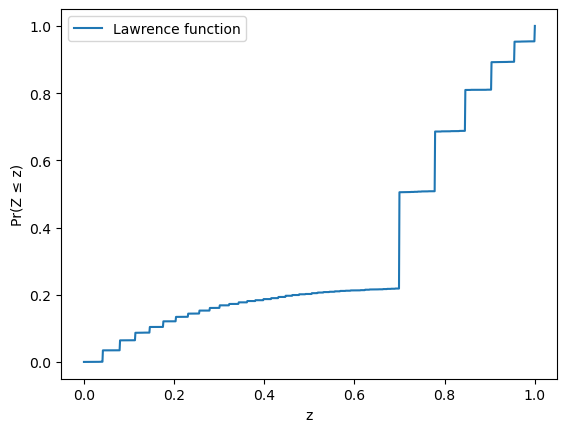

Distribution:


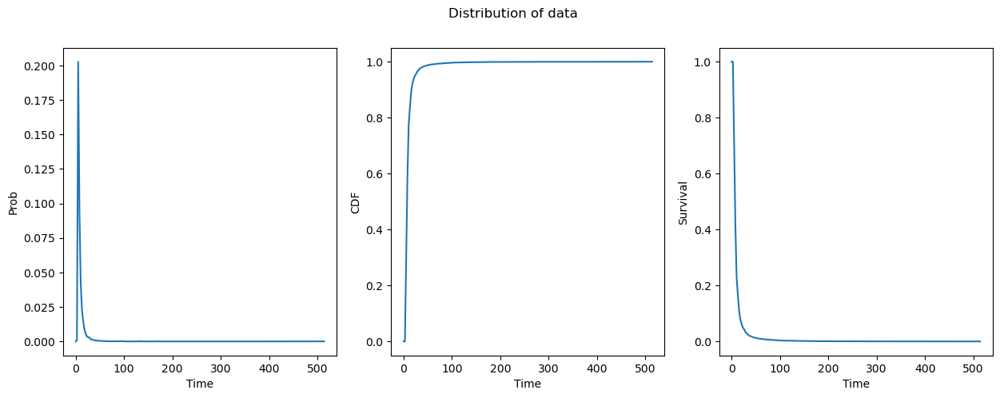

Lorenz Curve:


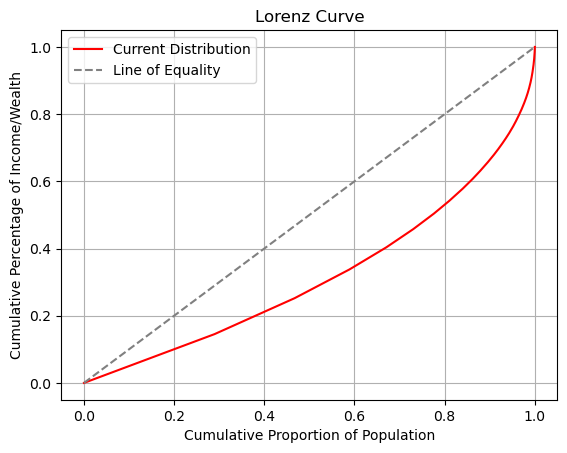

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.0032
        Pearson Coefficient: 0.0568
        Slope (Regression): [0.10364128]


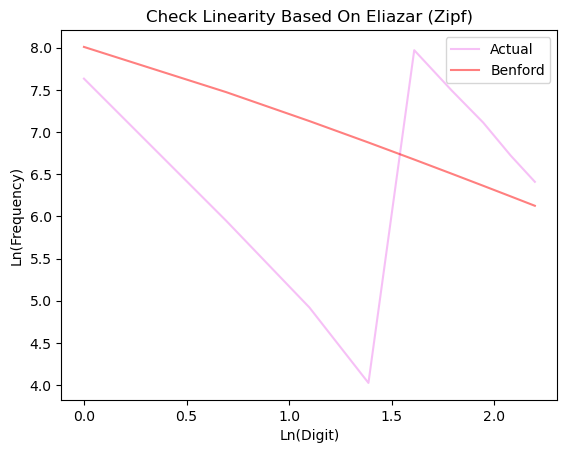

Scaled TTT:


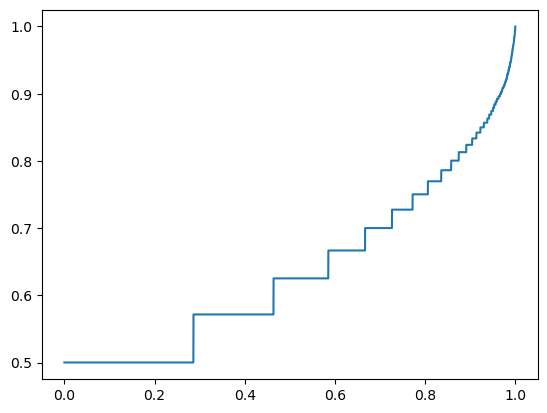

   Check t*h(t):
        Slope (Regression): [-0.00208325]
        Estimated value for p (denoted in eliazar): 2.0480505901656603


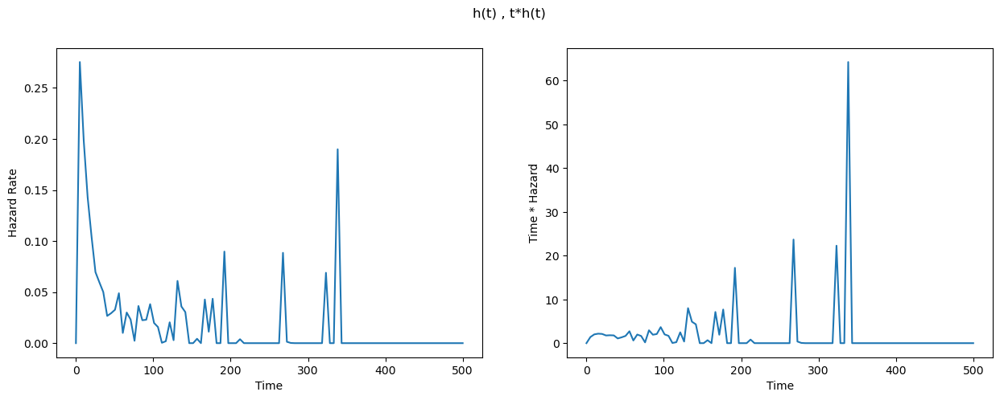

In [59]:
G = nx.barabasi_albert_graph(10000, 3)
degrees = [G.degree(n) for n in G.nodes()]
analyzer.set_data(degrees)
analyzer.report()
analyzer.show_zipf_fd_single()
dist = Distribution(degrees)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 500, LINDY_PRECISION)


G = nx.barabasi_albert_graph(10000, 5)
degrees = [G.degree(n) for n in G.nodes()]
analyzer.set_data(degrees)
analyzer.report()
dist = Distribution(degrees)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 500, LINDY_PRECISION)

### - Real Datasets (Golbeck Paper)

In [60]:
twitter = pd.read_csv('twitterAnonymized.tdf', sep='\t')
facebook = pd.read_csv('fbAnonymized.tdf', sep='\t')

In [61]:
twitter.head()

,UserID,Friend_Count,Follower_Count,Status_Count
0,1,138,163,9985
1,2,1,5,14
2,3,39,13,188
3,4,25,59,8
4,5,20,3,1


In [62]:
facebook.head()

,UserID,FriendCount
0,1,753
1,2,540
2,3,258
3,4,247
4,5,279


In [63]:
twitter_friend_counts = twitter['Friend_Count'].to_numpy()
twitter_follower_counts = twitter['Follower_Count'].to_numpy()
facebook_friend_counts = facebook['FriendCount'].to_numpy()

### - Twitter Friend & Follower Count Distribution

Statistical Tests:
    Chi2 Statistic: 402.16245171906525, Chi2 P-Value: 6.456421221984231e-82
    Lawrence Statistics-> c: 0.005141033054471213, m: 0.025868989328220904
    MAD Statistic: 0.007461891693582089
    MAD result: None
    KS Statistic: 0.03694423848848205 KS P-Value: 8.079717592286069e-47
    Pearson Statistic: 0.9989483548709948 Pearson P-Value: 1.2406097117662765e-10
    J-Divergence: 0.007442190463958316
Benford Check:


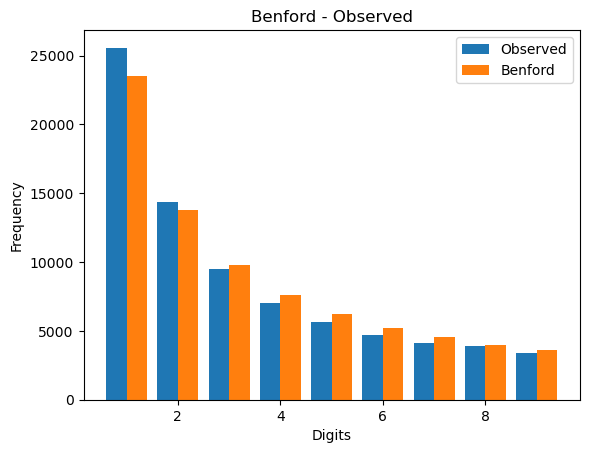

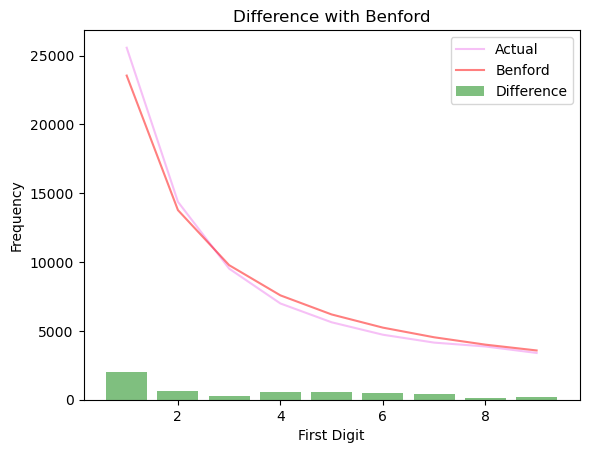

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9991204787478218, P-Value: 0.0
        R-squared: 0.9982


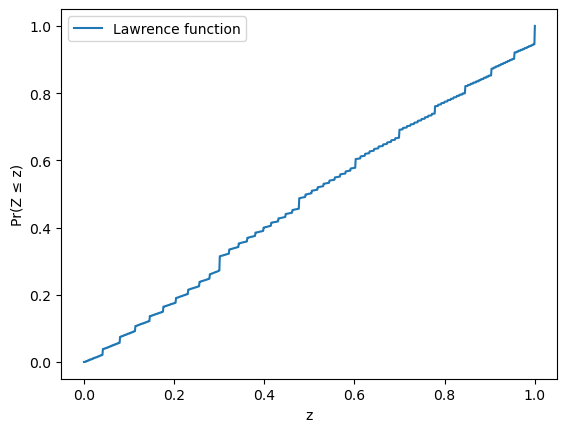

Distribution:


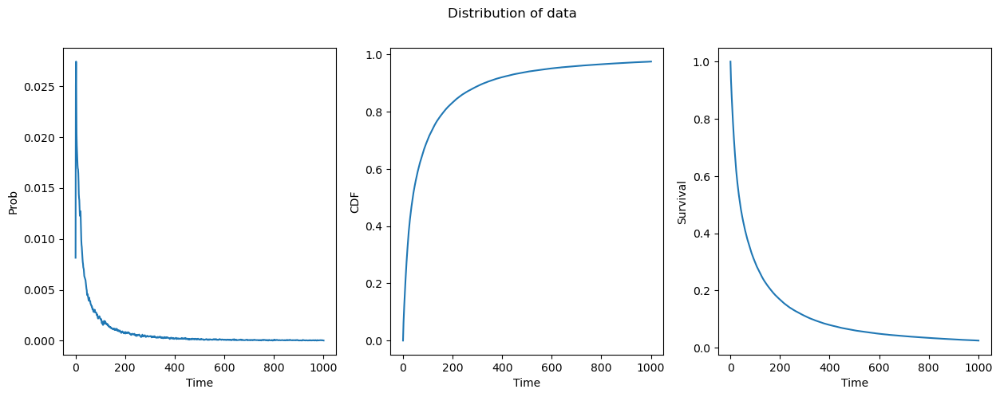

Lorenz Curve:


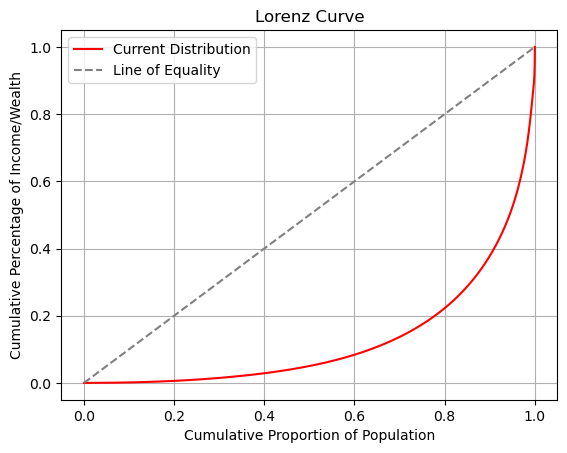

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9978
        Pearson Coefficient: -0.9989
        Slope (Regression): [-0.93676321]


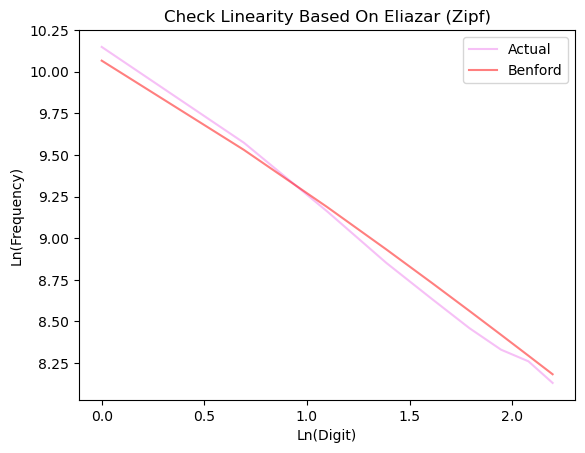

Scaled TTT:


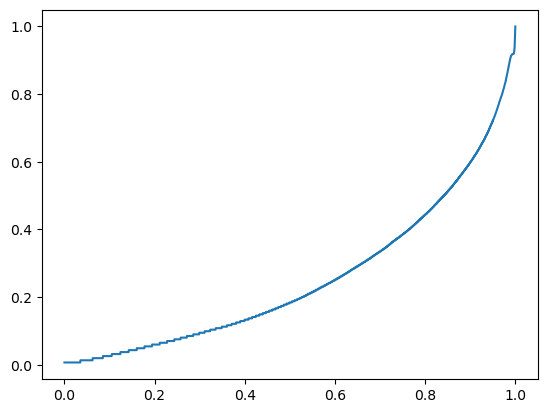

   Check t*h(t):
        Slope (Regression): [0.00077376]
        Estimated value for p (denoted in eliazar): 1.0840830495388387


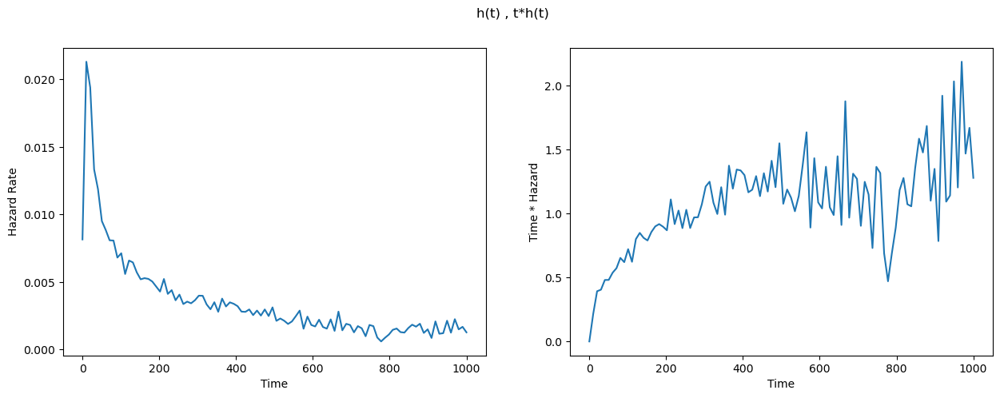

In [64]:
analyzer.set_data(twitter_friend_counts)
analyzer.report()
dist = Distribution(twitter_friend_counts)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 1000, LINDY_PRECISION)

Statistical Tests:
    Chi2 Statistic: 843.1221189020985, Chi2 P-Value: 1.0420356352222576e-176
    Lawrence Statistics-> c: 0.010778029285686322, m: 0.03499638942537531
    MAD Statistic: 0.00996331176726924
    MAD result: None
    KS Statistic: 0.048577199396620085 KS P-Value: 1.1952045144002703e-80
    Pearson Statistic: 0.9998278406322575 Pearson P-Value: 2.2040511014031331e-13
    J-Divergence: 0.016057130413210816
Benford Check:


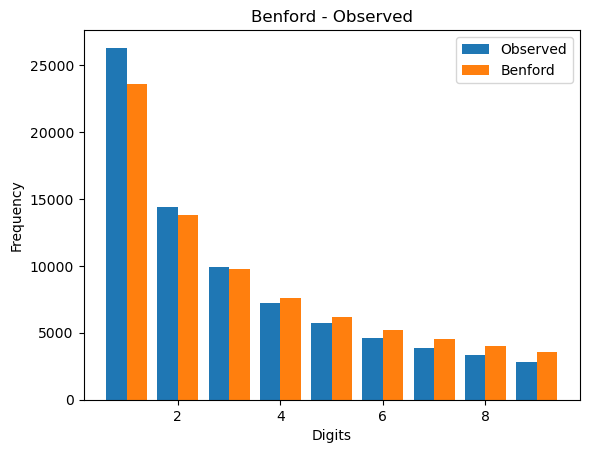

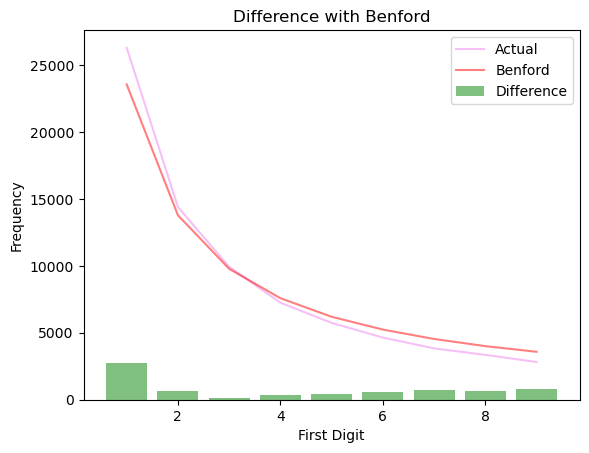

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9971332661744825, P-Value: 0.0
        R-squared: 0.9943


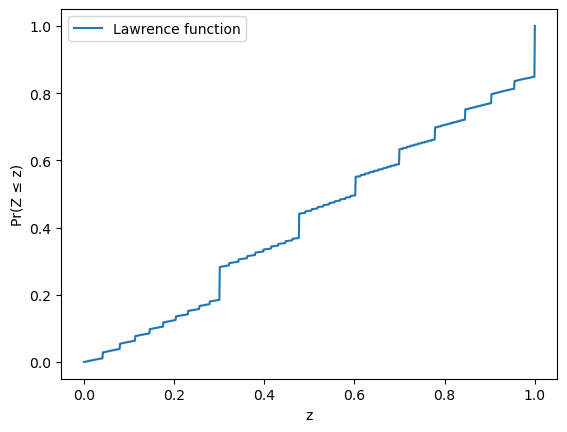

Distribution:


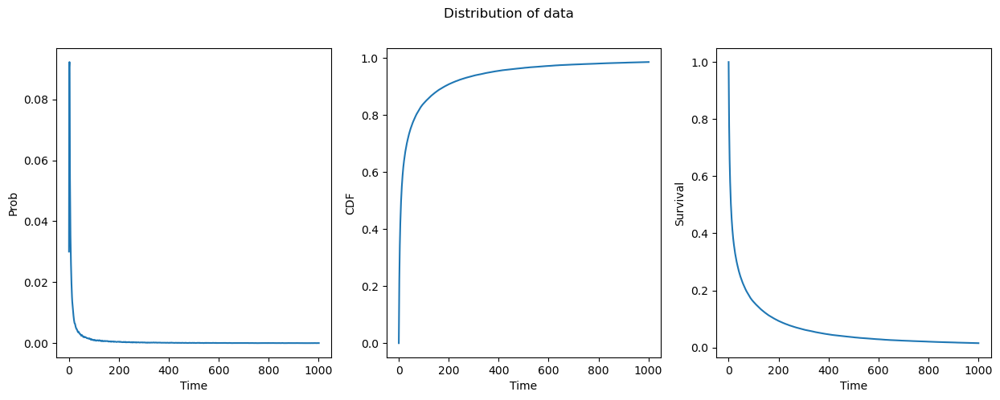

Lorenz Curve:


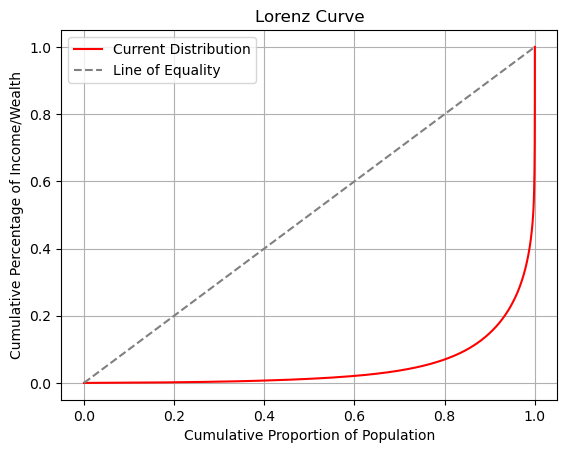

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9951
        Pearson Coefficient: -0.9975
        Slope (Regression): [-1.01875468]


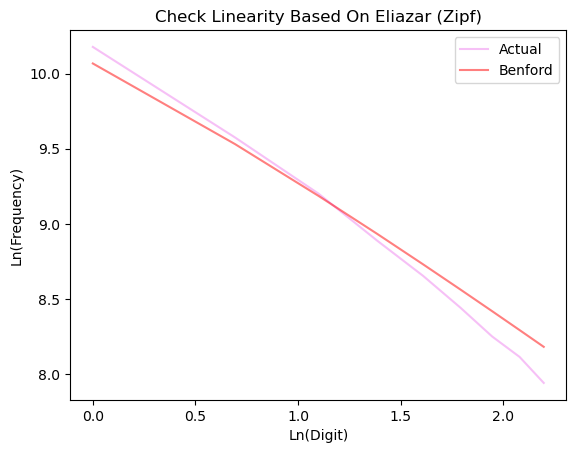

Scaled TTT:


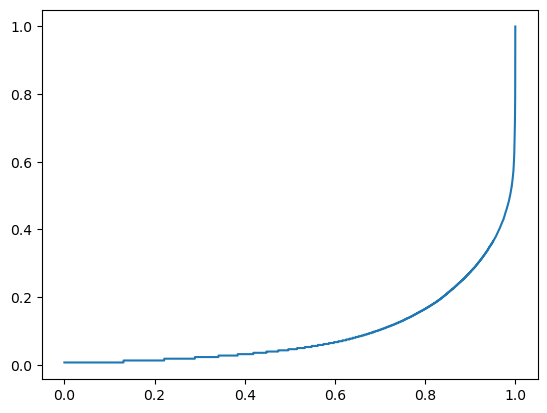

   Check t*h(t):
        Slope (Regression): [-9.50056828e-09]
        Estimated value for p (denoted in eliazar): 0.0010411718601355641


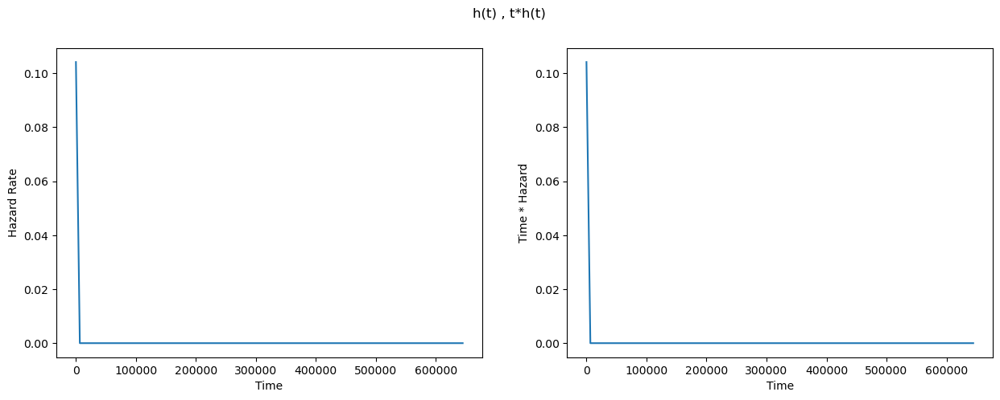

In [65]:
analyzer.set_data(twitter_follower_counts)
analyzer.report()
dist = Distribution(twitter_follower_counts)
la = LindyAnalyzer(dist)
la.show_hazard_rate(np.min(twitter_follower_counts), np.max(twitter_follower_counts), LINDY_PRECISION)

### - Facebook Friend Count Distribution

Statistical Tests:
    Chi2 Statistic: 95.7674727766079, Chi2 P-Value: 3.120698083345892e-17
    Lawrence Statistics-> c: 0.005233767230113004, m: 0.022120075382034754
    MAD Statistic: 0.007415932295449611
    MAD result: None
    KS Statistic: 0.030221882172915104 KS P-Value: 1.0783161830714177e-07
    Pearson Statistic: 0.9995473253215427 Pearson P-Value: 6.495275904432898e-12
    J-Divergence: 0.007673948759256512
Benford Check:


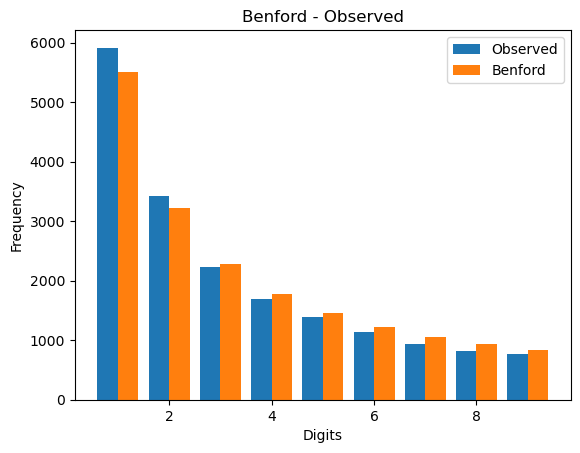

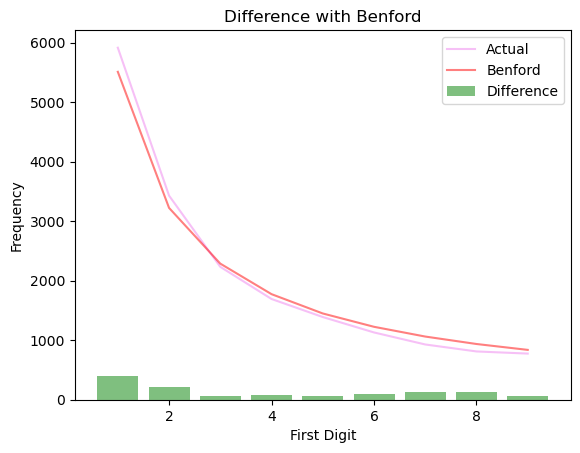

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9992571806286129, P-Value: 0.0
        R-squared: 0.9985


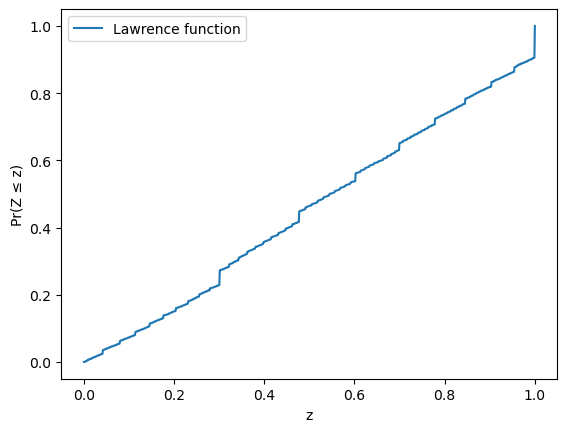

Distribution:


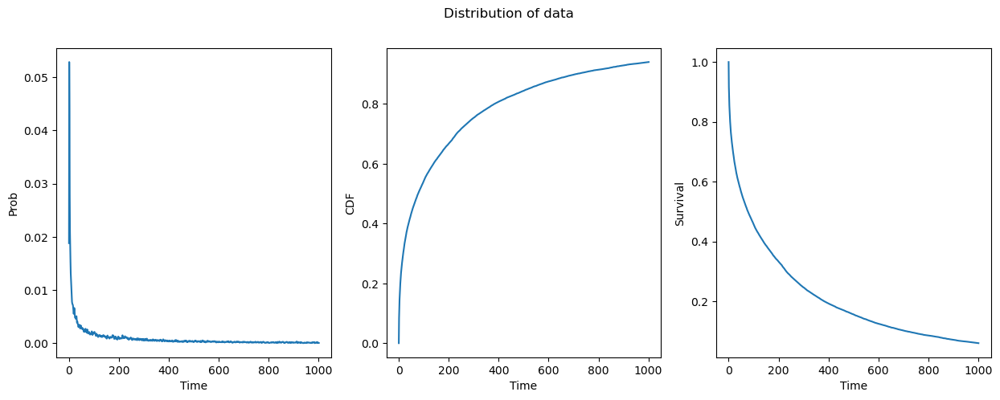

Lorenz Curve:


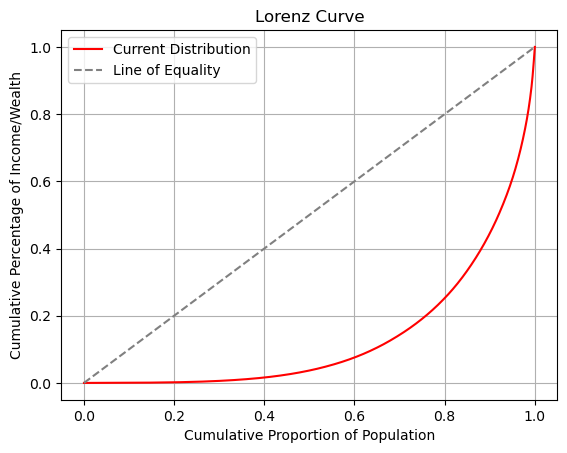

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9963
        Pearson Coefficient: -0.9982
        Slope (Regression): [-0.95995469]


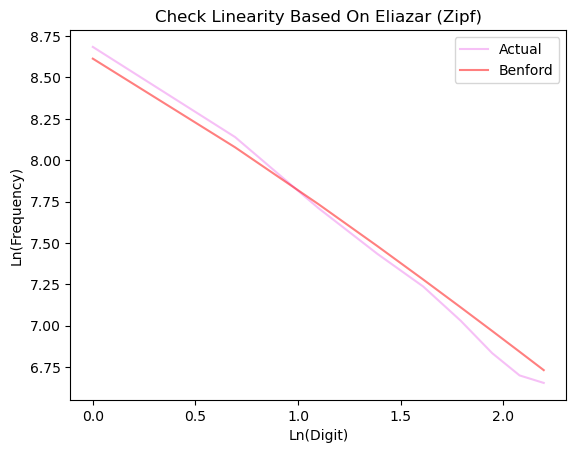

Scaled TTT:


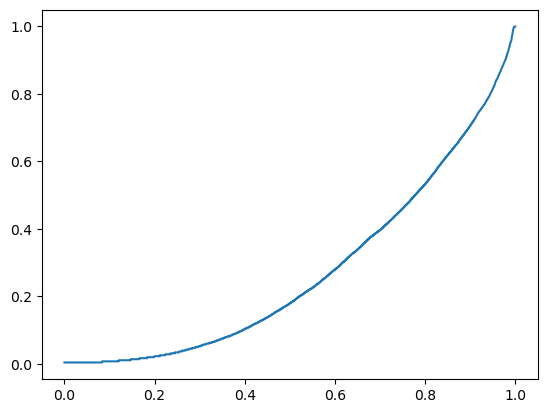

   Check t*h(t):
        Slope (Regression): [0.00276182]
        Estimated value for p (denoted in eliazar): 3.937237698634454


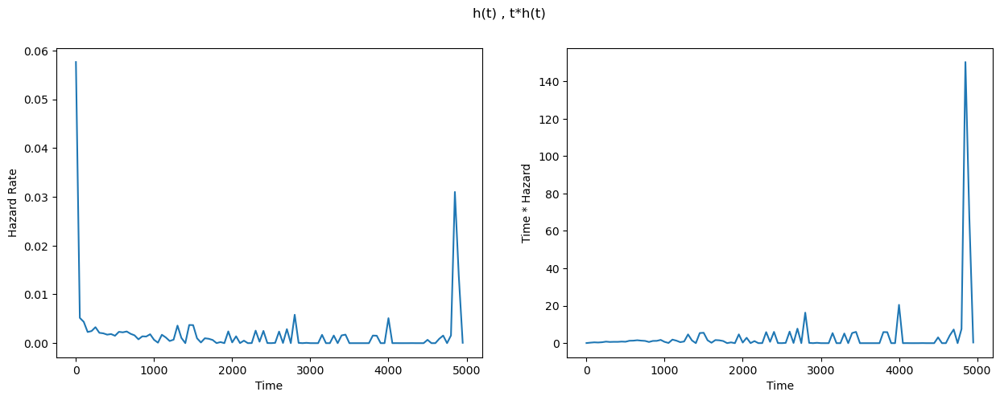

In [66]:
analyzer.set_data(facebook_friend_counts)
analyzer.report()
dist = Distribution(facebook_friend_counts)
la = LindyAnalyzer(dist)
la.show_hazard_rate(np.min(facebook_friend_counts), np.max(facebook_friend_counts), LINDY_PRECISION)

In [67]:
purchases = pd.read_csv('pindo_users_total_purchase.csv')
purchases.head()

,User_Id,User_Name,Count_Order,Count_shipment,Count_Item,Total_Users_Price,Avg_Users_Price
0,3493458,علیرضاعلی محمدی,1,1,3,87300000,2.910000e+07
1,2976040,مصطفیاکبری بیشه,1,2,8,76760000,9.595000e+06
2,648722,کامبیزمرادیان,2,2,13,60790000,4.676154e+06
3,244429,امیرحسینحکیمی,2,2,3,54550000,1.818333e+07
4,90605,نیمااشرف زاده,6,6,7,54087000,7.726714e+06


Statistical Tests:
    Chi2 Statistic: 357.0371734170018, Chi2 P-Value: 2.848265458981247e-72
    Lawrence Statistics-> c: 0.029880088159427713, m: 0.029949225121510673
    MAD Statistic: 0.015546868804557206
    MAD result: None
    KS Statistic: 0.0395849025023014 KS P-Value: 1.4326209454888343e-08
    Pearson Statistic: 0.9765364154341167 Pearson P-Value: 6.367491494839185e-06
    J-Divergence: 0.042850699130721676
Benford Check:


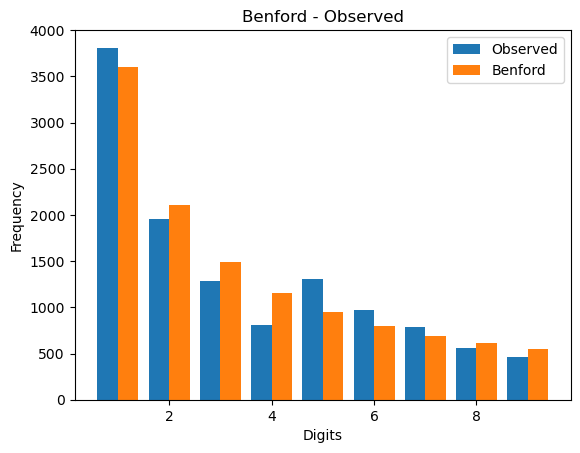

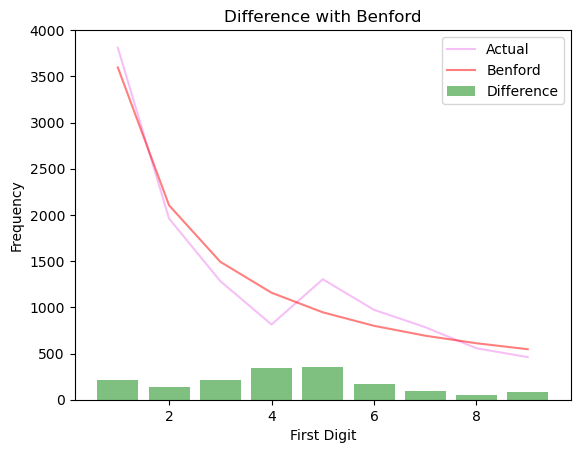

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9985308365886193, P-Value: 0.0
        R-squared: 0.9971


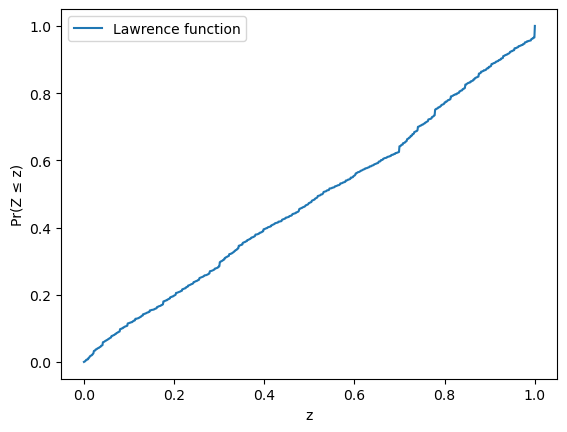

Distribution:


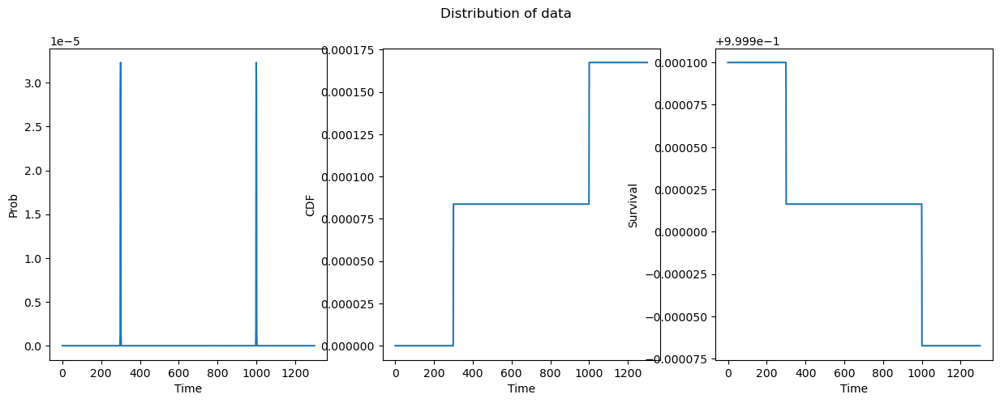

Lorenz Curve:


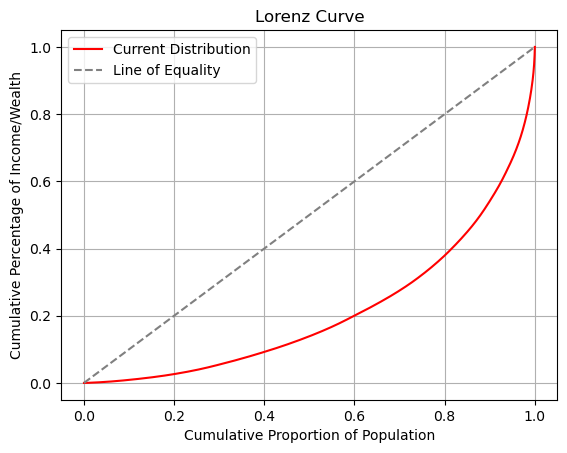

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.8989
        Pearson Coefficient: -0.9481
        Slope (Regression): [-0.85509047]


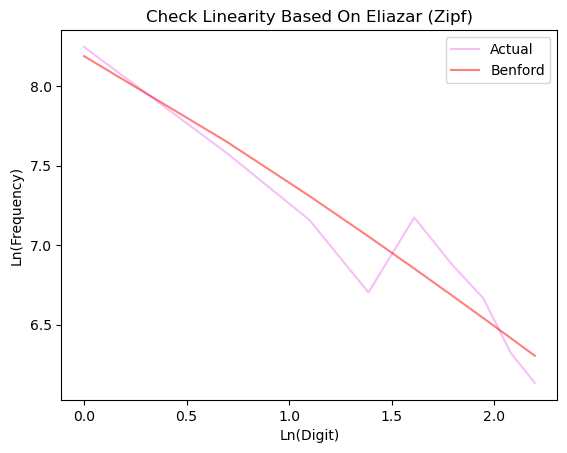

Scaled TTT:


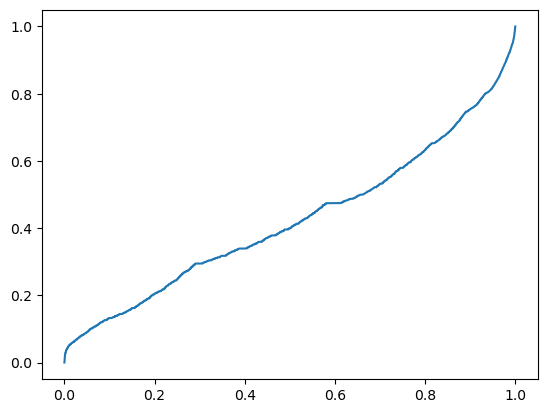

In [68]:
analyzer.set_data(purchases['Total_Users_Price'])
analyzer.report()
dist = Distribution(purchases['Total_Users_Price'])
la = LindyAnalyzer(dist)

Statistical Tests:
    Chi2 Statistic: 3997.0480606230567, Chi2 P-Value: 0.0
    Lawrence Statistics-> c: 0.003469385717467682, m: 0.0166219063724235
    MAD Statistic: 0.0061239175896057995
    MAD result: None
    KS Statistic: 0.016788604372397653 KS P-Value: 1.8235174706995584e-141
    Pearson Statistic: 0.9956748652102315 Pearson P-Value: 1.744649484497815e-08
    J-Divergence: 0.0049670628204405735
Benford Check:


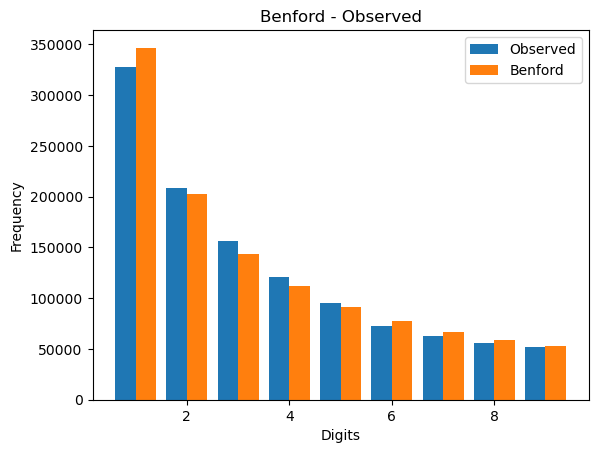

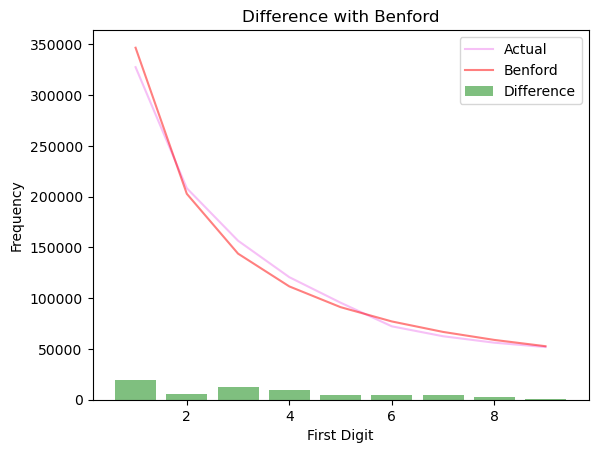

Lawrence Check:
    Linearity Check:
        Pearson Coefficient: 0.9994871146592779, P-Value: 0.0
        R-squared: 0.9990


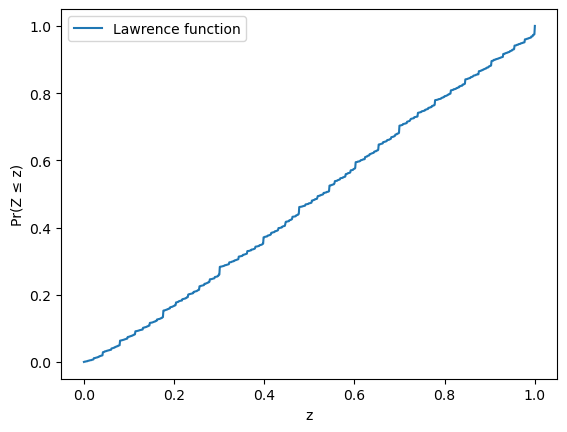

Distribution:


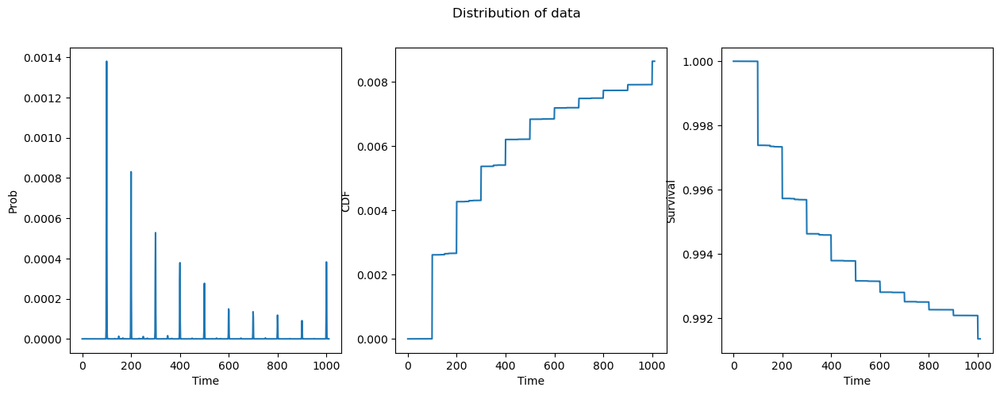

Lorenz Curve:


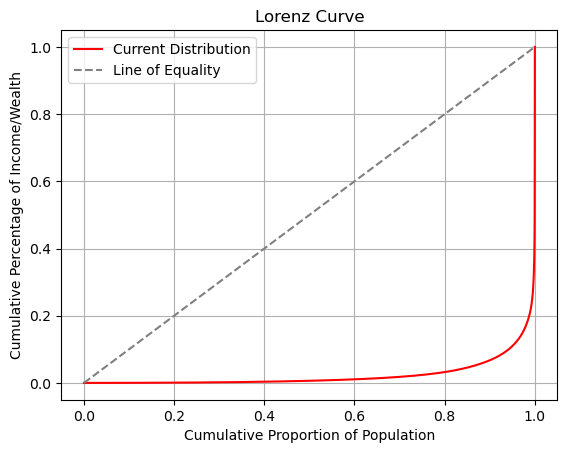

Zipf Law Check (Eliazar):
   Linearity Check:
        R-squared: 0.9837
        Pearson Coefficient: -0.9918
        Slope (Regression): [-0.87853678]


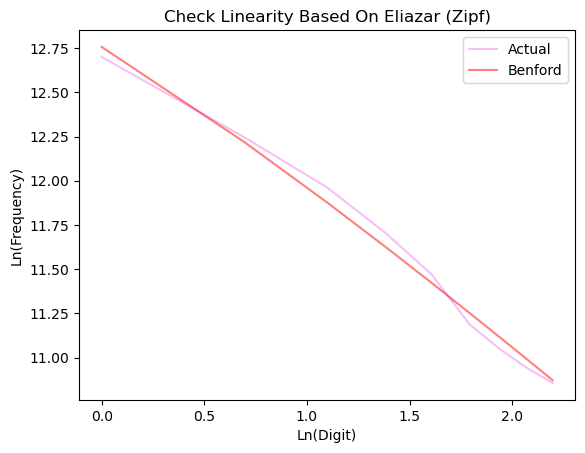

Scaled TTT:


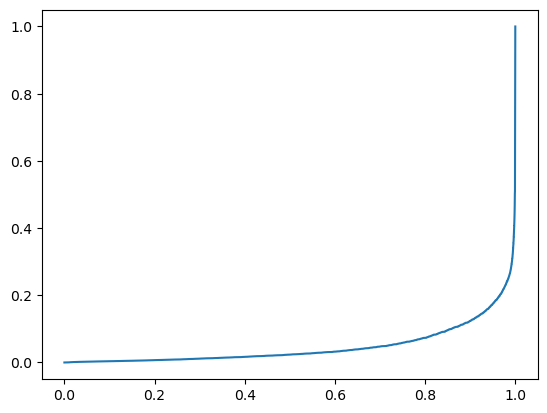

   Check t*h(t):
        Slope (Regression): [0.00122682]
        Estimated value for p (denoted in eliazar): 2089.585656282685


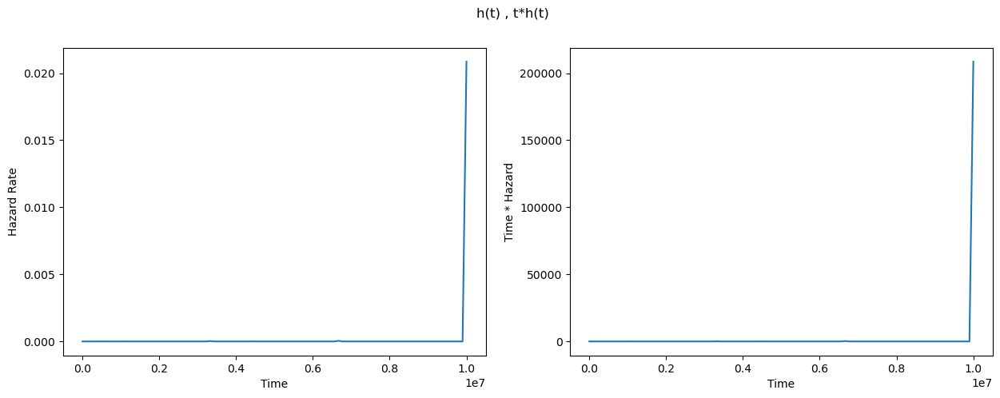

In [69]:
prices = pd.read_csv('ad_prices.csv')
prices.head()
prices = prices['price']
analyzer.set_data(prices)
analyzer.report()
dist = Distribution(prices)
la = LindyAnalyzer(dist)
la.show_hazard_rate(0, 10000000, LINDY_PRECISION)

### Mean Approach Eliazar Paper (Checking Lindy Backward)

In [70]:
import numpy as np 
import math
class EliazarMeanLindySimulator():
    def __init__(self, c):
        self.c = c
    
    def get_first_moment(self, lindy_param, approach = 'mean'):
        if approach == 'mean':
            return self.c * (1+lindy_param)
        elif approach == 'median':
            if 0 < lindy_param < 1:
                return self.c * np.log(2) / (np.log(2) - np.log(1+lindy_param))
            return np.inf
        else:
            raise Exception('Not implemented approach')
        
    def get_second_moment(self, lindy_param, approach = 'mean'):
        if approach == 'mean':
            if  0 < lindy_param < 1:
                return self.c**2 * (1+lindy_param) / (1-lindy_param)
            return np.inf
        else:
            raise Exception('Not implemented approach')
    
    def get_variance(self, lindy_param, approach = 'mean'):
        if approach == 'mean':
            return self.get_second_moment(lindy_param) - self.get_first_moment(lindy_param)**2
        else:
            raise Exception('Not implemented approach')
    
    def get_exponent(self, lindy_param, approach = 'mean'):
        if approach == 'mean':
            return 1 + (1/lindy_param)
        if approach == 'median':
            return np.log(2) / np.log(1 + lindy_param)
        raise Exception('Not implemented approach')
 
 
    def get_pareto_stats(self, lindy_param, approach = 'mean'):
        if approach == 'mean':
            exp = self.c, self.get_exponent(lindy_param)
        elif approach == 'median':
            exp = self.c, self.get_exponent(lindy_param, approach='median')
        else:
            raise Exception('Not implemented approach')
        pareto_rv = pareto(b = exp)
        return pareto_rv.mean(), pareto_rv.var()
 
    def simulate_median_approach(self, title, q_range):
        # plot exponent:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        axes[0].plot(q_range, [self.get_exponent(q, approach='median') for q in q_range])
        axes[0].set_xlabel('q')
        axes[0].set_ylabel('Exponent')
        
        # plot first moment:
        axes[1].plot(q_range, [self.get_first_moment(q, approach='median') for q in q_range])
        axes[1].set_xlabel('q')
        axes[1].set_ylabel('First Moment')
        
        fig.suptitle(title)
        plt.show()
        
    def simulate_mean_approach(self, title, p_range):
        # plot exponent:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].plot(p_range, [self.get_exponent(p) for p in p_range])
        axes[0].set_xlabel('p')
        axes[0].set_ylabel('Exponent')
        
        # plot first moment:
        axes[1].plot(p_range, [self.get_first_moment(p) for p in p_range])
        axes[1].set_xlabel('p')
        axes[1].set_ylabel('First Moment')
        
        # plot variance:
        axes[2].plot(p_range, [self.get_variance(p) for p in p_range])
        axes[2].set_xlabel('p')
        axes[2].set_ylabel('Variance')
        
        fig.suptitle(title)
        plt.show()

In [71]:
# C denotes the constant which denotes a lower bound for lifetime
C = 1
simulator = EliazarMeanLindySimulator(C)

### Mean Approach

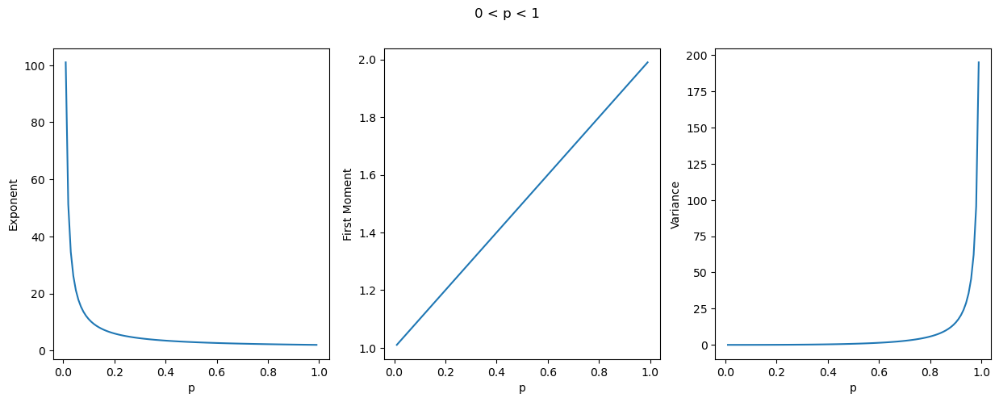

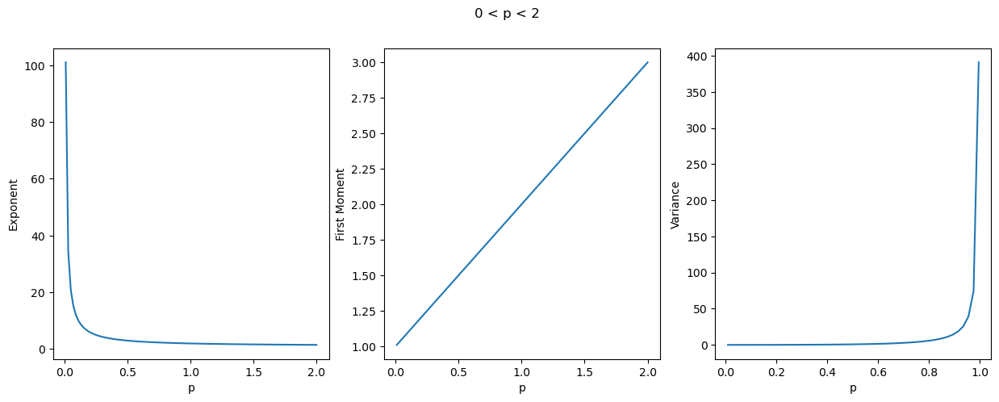

In [72]:
simulator.simulate_mean_approach('0 < p < 1', np.linspace(0.01, .99, 100))
simulator.simulate_mean_approach('0 < p < 2', np.linspace(0.01, 2, 100))

### Median Approach

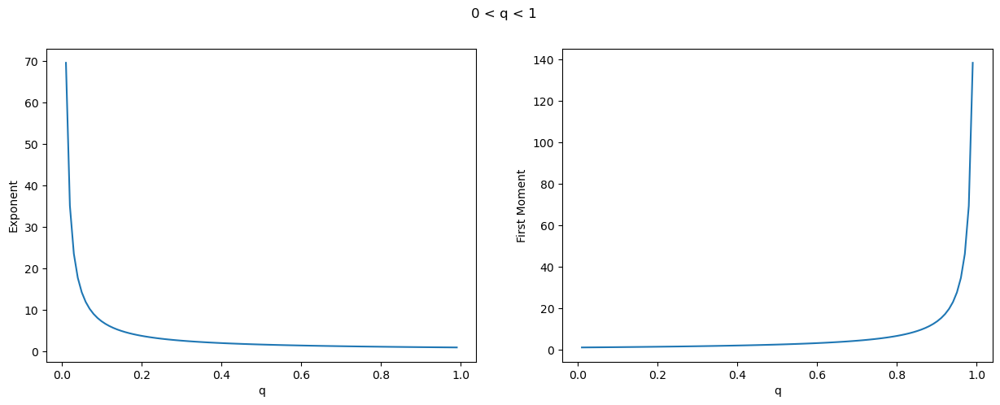

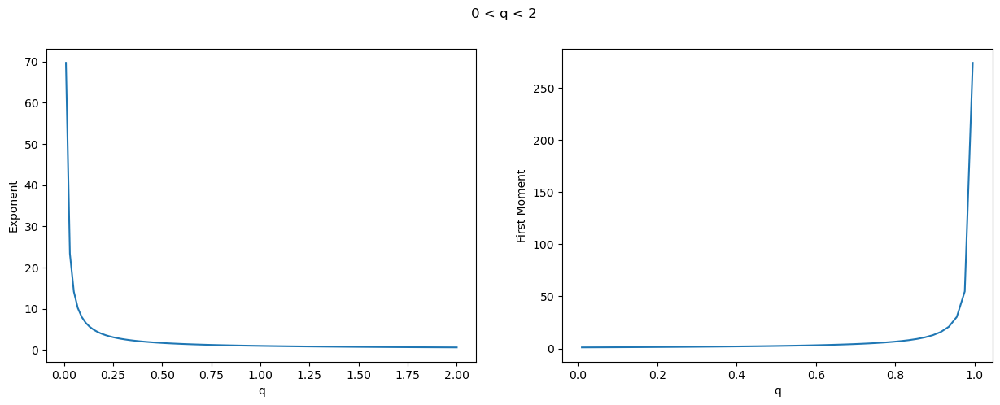

In [73]:
simulator.simulate_median_approach('0 < q < 1', np.linspace(0.01, .99, 100))
simulator.simulate_median_approach('0 < q < 2', np.linspace(0.01, 2, 100))